In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.regularizers import l2
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import numpy as np
from keras.losses import BinaryFocalCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'

train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=True
)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=False
)

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)
num_train_samples = train_generator.samples

X_train_features = []
y_train_labels = []

for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features.append(features)
    y_train_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_train_features = np.vstack(X_train_features)
y_train_labels = np.hstack(y_train_labels)

smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)
X_train_resampled = X_train_resampled.reshape(-1, 7, 7, 1920)

X_train_final, X_val_final, y_train_final, y_val_final = train_test_split(
    X_train_resampled, y_train_resampled, test_size=0.2, random_state=42, stratify=y_train_resampled
)

model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.4),
    layers.Dense(512, kernel_regularizer=l2(0.007)),
    layers.BatchNormalization(),
    layers.LeakyReLU(negative_slope=0.1),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryFocalCrossentropy(alpha=0.25, gamma=2.0)
model.compile(optimizer=AdamW(learning_rate=3e-5), loss=loss_fn, metrics=['accuracy'])

class_weights_smote = compute_class_weight(class_weight="balanced", classes=np.unique(y_train_final), y=y_train_final)
class_weights_dict_smote = {i: class_weights_smote[i] for i in range(len(class_weights_smote))}

early_stopping = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1)
checkpoint = ModelCheckpoint("densenet_optimized.keras", monitor='val_accuracy', save_best_only=True, verbose=1)

history = model.fit(
    X_train_final, y_train_final,
    validation_data=(X_val_final, y_val_final),
    epochs=150,
    callbacks=[early_stopping, reduce_lr, checkpoint],
    class_weight=class_weights_dict_smote,
    batch_size=32
)

val_loss, val_acc = model.evaluate(X_val_final, y_val_final, verbose=0)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

y_pred = model.predict(X_val_final, verbose=0)
y_pred_classes = (y_pred > 0.5).astype("int32").flatten()

print("\nClassification Report:\n", classification_report(y_val_final, y_pred_classes))

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
Epoch 1/150
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.5398 - loss: 5.9405
Epoch 1: val_accuracy improved from -inf to 0.66443, saving model to densenet_optimized.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.5434 - loss: 5.9331 - val_accuracy: 0.6644 - val_loss: 5.5769 - learning_rate: 3.0000e-05
Epoch 2/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.6377 - loss: 5.5903
Epoch 2: val_accuracy improved from 0.66443 to 0.68121, saving model to densenet_optimized.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.6376 - loss: 5.5887 - val_accuracy: 0.6812 - val_loss: 5.3216 - learning_rate: 3.0000e-05
Epoch 3/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.6811 - loss: 5.3308
Epoch 3: val_accuracy improved from 0.68121 to 0.68792, saving model to densenet_optimized.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.6817 - loss: 5.3267 - val_acc

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
Found 1246 images for training.
Found 309 images for validation.
Freezing BatchNormalization layers in the base model...
Number of trainable layers in base_model: 21
Extracting features from training data...
Extracted training features shape: (1246, 7, 7, 1920)
Extracted training labels shape: (1246,)
Applying SMOTE to training features...
Shape after SMOTE: Data (1486, 94080), Labels (1486,)
Class distribution after SMOTE: [743 743]
Reshaped scaled resampled training features shape: (1486, 7, 7, 1920)
Final training features shape: (1188, 7, 7, 1920)
SMOTE'd validation features shape: (298, 7, 7, 1920)
Building the final classification head model...


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ global_average_pooling2d_5      │ (None, 1920)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 1920)           │         7,680 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 512)            │       983,552 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 991,745 (3.78 MB)

 Trainable params: 987,905 (3.77 MB)

 Non-trainable params: 3,840 (15.00 KB)

Training the classification head model...
Epoch 1/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.6258 - loss: 0.7572
Epoch 1: val_accuracy improved from -inf to 0.79530, saving model to best_head_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.6267 - loss: 0.7553 - val_accuracy: 0.7953 - val_loss: 0.4822 - learning_rate: 2.0000e-05
Epoch 2/100
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7534 - loss: 0.5270
Epoch 2: val_accuracy improved from 0.79530 to 0.82215, saving model to best_head_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.7538 - loss: 0.5269 - val_accuracy: 0.8221 - val_loss: 0.4266 - learning_rate: 2.0000e-05
Epoch 3/100
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7967 - loss: 0.4585
Epoch 3: val_accuracy improved from 0.82215 to 0.84228, saving model to best_head_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.7967 - loss: 0.4581 - val_accuracy: 0.8423 - val_loss: 0.3907 - learning_rate: 

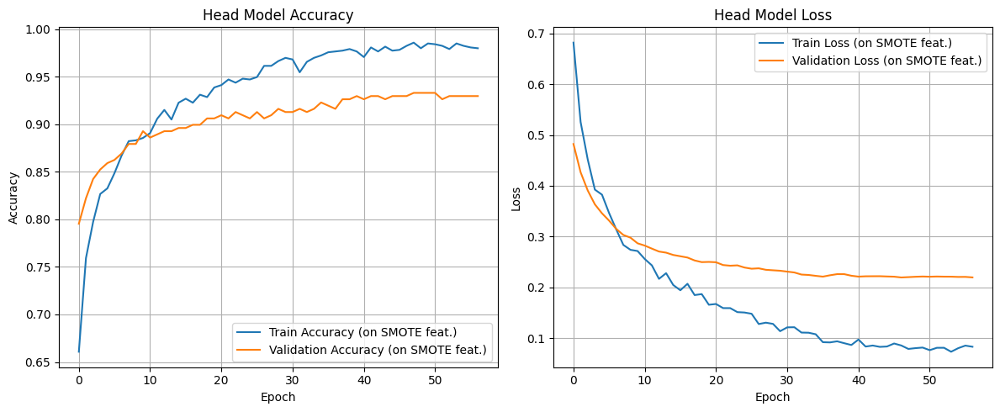


--- Generating Plots for Evaluation on ORIGINAL Validation Data ---


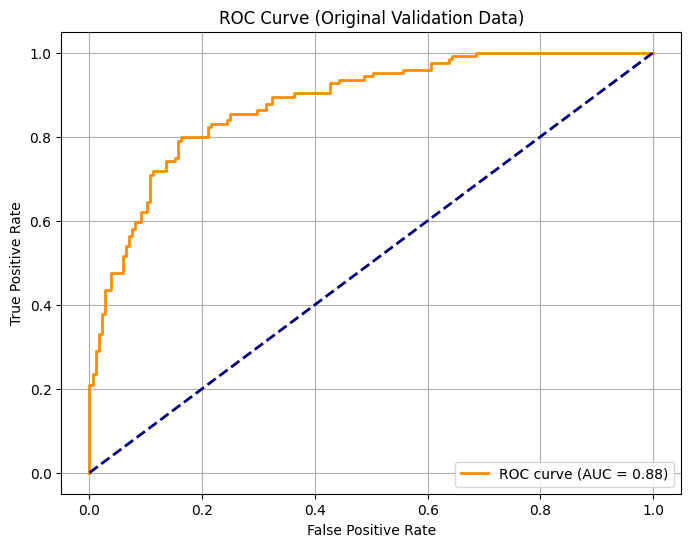

AUC on Original Validation Data: 0.8812


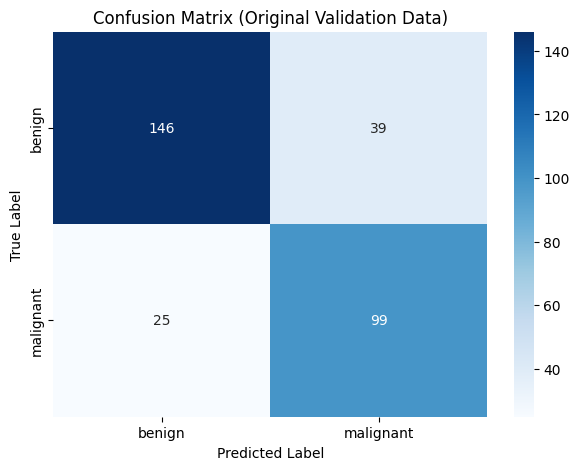


Final head model saved successfully!


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.applications import DenseNet201
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import numpy as np
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'
IMG_SIZE = 224
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.8, 1.2],
    horizontal_flip=True,
    fill_mode='nearest'
)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='binary', shuffle=True
)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='binary', shuffle=False
)
print(f"Found {train_generator.samples} images for training.")
print(f"Found {validation_generator.samples} images for validation.")

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))

base_model.trainable = True
NUM_FINE_TUNE_LAYERS = 30

for layer in base_model.layers[:-NUM_FINE_TUNE_LAYERS]:
    layer.trainable = False

print("Freezing BatchNormalization layers in the base model...")
for layer in base_model.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

trainable_layers_count = sum([1 for layer in base_model.layers if layer.trainable])
print(f"Number of trainable layers in base_model: {trainable_layers_count}")


feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)
FEATURE_MAP_SHAPE = (7, 7, 1920)

print("Extracting features from training data...")
X_train_features_list, y_train_labels_list = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features_list.append(features)
    y_train_labels_list.append(labels)
    if i >= len(train_generator) - 1:
        break
X_train_features = np.vstack(X_train_features_list)
y_train_labels = np.hstack(y_train_labels_list)
print(f"Extracted training features shape: {X_train_features.shape}")
print(f"Extracted training labels shape: {y_train_labels.shape}")


print("Applying SMOTE to training features...")
smote = SMOTE(random_state=42, sampling_strategy='auto')
X_resampled_flat, y_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)
print(f"Shape after SMOTE: Data {X_resampled_flat.shape}, Labels {y_resampled.shape}")
print(f"Class distribution after SMOTE: {np.bincount(y_resampled.astype(int))}")


scaler = StandardScaler()
X_resampled_flat_scaled = scaler.fit_transform(X_resampled_flat)

X_resampled_scaled = X_resampled_flat_scaled.reshape(X_resampled_flat_scaled.shape[0], *FEATURE_MAP_SHAPE)
print(f"Reshaped scaled resampled training features shape: {X_resampled_scaled.shape}")

X_train_final, X_val_smote, y_train_final, y_val_smote = train_test_split(
    X_resampled_scaled, y_resampled,
    test_size=0.2,
    stratify=y_resampled,
    random_state=42
)
print(f"Final training features shape: {X_train_final.shape}")
print(f"SMOTE'd validation features shape: {X_val_smote.shape}")

print("Building the final classification head model...")
model = models.Sequential([
    layers.Input(shape=FEATURE_MAP_SHAPE),
    layers.GlobalAveragePooling2D(),
    layers.BatchNormalization(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryCrossentropy()
OPTIMIZER_LR = 2e-5
model.compile(optimizer=AdamW(learning_rate=OPTIMIZER_LR), loss=loss_fn, metrics=['accuracy'])
model.summary()

class_weight_dict = None

callbacks_list = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1), # Patience کمی بیشتر
    ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=5, min_lr=1e-7, verbose=1), # Patience و factor کمی تغییر
    ModelCheckpoint("best_head_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
]

print("Training the classification head model...")
history = model.fit(
    X_train_final, y_train_final,
    validation_data=(X_val_smote, y_val_smote),
    epochs=100,
    batch_size=BATCH_SIZE,
    class_weight=class_weight_dict,
    callbacks=callbacks_list
)

print("Loading best weights for the head model...")
model.load_weights("best_head_model.keras")

print("\n--- Evaluating on ORIGINAL Validation Data (True Performance) ---")
print("Extracting features from original validation data...")
X_validation_original_features_list, y_validation_original_labels_list = [], []
validation_generator.reset()
for i in range(len(validation_generator)):
    images, labels = validation_generator[i]
    features = feature_extractor.predict(images, verbose=0)
    X_validation_original_features_list.append(features)
    y_validation_original_labels_list.append(labels)

X_validation_original_features = np.vstack(X_validation_original_features_list)
y_validation_original_labels = np.hstack(y_validation_original_labels_list)
y_validation_original_labels = y_validation_original_labels[:validation_generator.samples]
X_validation_original_features = X_validation_original_features[:validation_generator.samples]

print(f"Extracted original validation features shape: {X_validation_original_features.shape}")

X_validation_original_flat = X_validation_original_features.reshape(X_validation_original_features.shape[0], -1)
X_validation_original_flat_scaled = scaler.transform(X_validation_original_flat) # استفاده از transform
X_validation_original_scaled = X_validation_original_flat_scaled.reshape(X_validation_original_flat_scaled.shape[0], *FEATURE_MAP_SHAPE)
print(f"Scaled original validation features shape: {X_validation_original_scaled.shape}")

original_val_loss, original_val_acc = model.evaluate(X_validation_original_scaled, y_validation_original_labels, verbose=1)
print(f"Accuracy on ORIGINAL Validation Data: {original_val_acc:.4f}")
print(f"Loss on ORIGINAL Validation Data: {original_val_loss:.4f}")

y_pred_original_val_probs = model.predict(X_validation_original_scaled)
y_pred_classes_original_val = (y_pred_original_val_probs > 0.5).astype("int32").flatten()

print("\nClassification Report on ORIGINAL Validation Data:\n")
print(classification_report(y_validation_original_labels, y_pred_classes_original_val, target_names=list(validation_generator.class_indices.keys())))

print("\n--- Generating Plots for Head Model Training (on SMOTE'd val data) ---")
if hasattr(history, 'history'):
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy (on SMOTE feat.)')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy (on SMOTE feat.)')
    plt.title('Head Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss (on SMOTE feat.)')
    plt.plot(history.history['val_loss'], label='Validation Loss (on SMOTE feat.)')
    plt.title('Head Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("head_model_training_plots.png")
    plt.show()


print("\n--- Generating Plots for Evaluation on ORIGINAL Validation Data ---")
fpr, tpr, _ = roc_curve(y_validation_original_labels, y_pred_original_val_probs)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.title('ROC Curve (Original Validation Data)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.grid(True)
plt.savefig("roc_curve_original_validation.png")
plt.show()
print(f"AUC on Original Validation Data: {roc_auc:.4f}")

cm = confusion_matrix(y_validation_original_labels, y_pred_classes_original_val)
class_names = list(validation_generator.class_indices.keys()) # ['benign', 'malignant'] or similar
plt.figure(figsize=(7,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix (Original Validation Data)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig("confusion_matrix_original_validation.png")
plt.show()

model.save("final_head_model_on_features.keras")
print("\nFinal head model saved successfully!")

In [ ]:
sample_images, sample_labels = next(validation_generator)
img = sample_images[0:1]
feature_maps = feature_extractor.predict(img)
print("شکل ویژگی‌های استخراج‌شده:", feature_maps.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
شکل ویژگی‌های استخراج‌شده: (1, 7, 7, 1920)


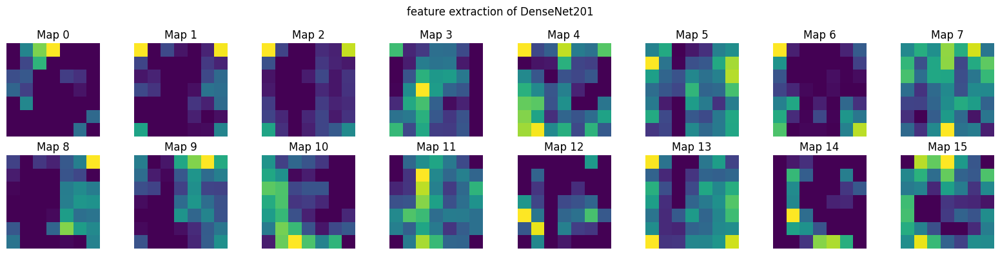

In [ ]:
import matplotlib.pyplot as plt

num_features = 16
fig, axes = plt.subplots(2, 8, figsize=(16, 4))

for i in range(num_features):
    ax = axes[i // 8, i % 8]
    ax.imshow(feature_maps[0, :, :, i], cmap='viridis')
    ax.axis('off')
    ax.set_title(f"Map {i}")

plt.suptitle("feature extraction of DenseNet201")
plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


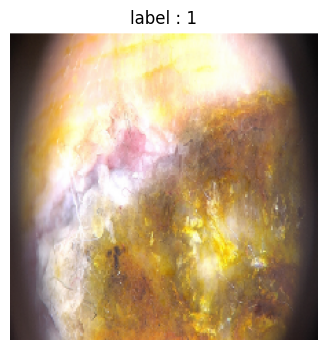

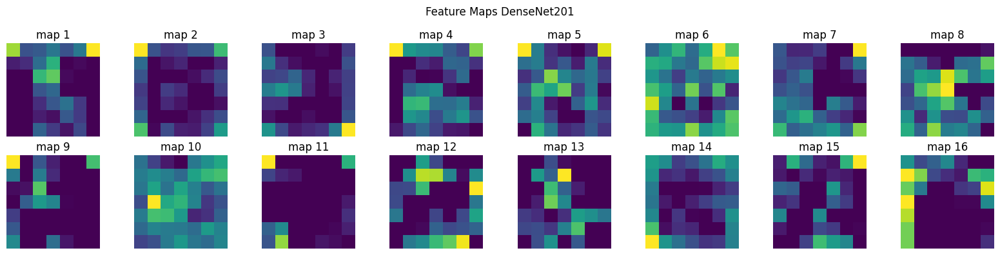

In [ ]:
import matplotlib.pyplot as plt

sample_images, sample_labels = next(validation_generator)

img = sample_images[0:1]
label = sample_labels[0]

feature_maps = feature_extractor.predict(img)

plt.figure(figsize=(4, 4))
plt.imshow(img[0])
plt.axis('off')
plt.title(f"label : {int(label)}")
plt.show()

num_maps = 16
fig, axes = plt.subplots(2, 8, figsize=(16, 4))
for i in range(num_maps):
    ax = axes[i // 8, i % 8]
    ax.imshow(feature_maps[0, :, :, i], cmap='viridis')
    ax.axis('off')
    ax.set_title(f"map {i+1}")
plt.suptitle("Feature Maps DenseNet201")
plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.applications import DenseNet201
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import numpy as np
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=True
)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=False
)

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers[:-30]:
    layer.trainable = False
for layer in base_model.layers[-30:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_train_features, y_train_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features.append(features)
    y_train_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_train_features = np.vstack(X_train_features)
y_train_labels = np.hstack(y_train_labels)

smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 7, 7, 1920)

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42
)

model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dense(1024),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.4),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryCrossentropy()
model.compile(optimizer=AdamW(learning_rate=2e-5), loss=loss_fn, metrics=['accuracy'])

class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint("best_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

y_pred = model.predict(X_val)
y_pred_classes = (y_pred > 0.5).astype("int32").flatten()
print("\nClassification Report:\n", classification_report(y_val, y_pred_classes))

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5840 - loss: 0.7243
Epoch 1: val_accuracy improved from -inf to 0.82550, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - accuracy: 0.5862 - loss: 0.7219 - val_accuracy: 0.8255 - val_loss: 0.4571 - learning_rate: 2.0000e-05
Epoch 2/150
35/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7757 - loss: 0.5038
Epoch 2: val_accuracy improved from 0.82550 to 0.83893, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.7760 - loss: 0.4997 - val_accuracy: 0.8389 - val_loss: 0.4022 - learning_rate: 2.0000e-05
Epoch 3/150
34/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8080 - loss: 0.4332
Epoch 3: val_accuracy improved from 0.83893 to 0.85570, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.8081 - loss: 0.4336 - val_accuracy: 0.8557 - val_loss: 

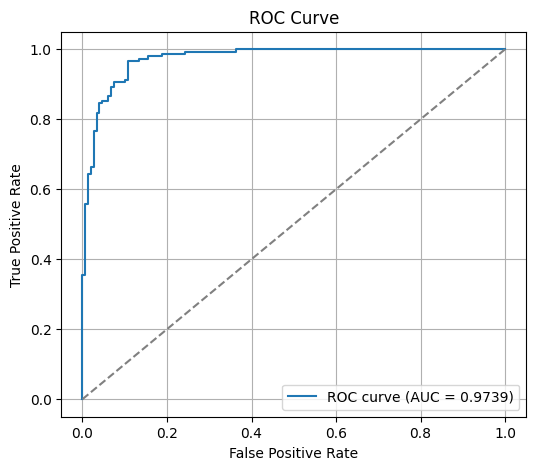

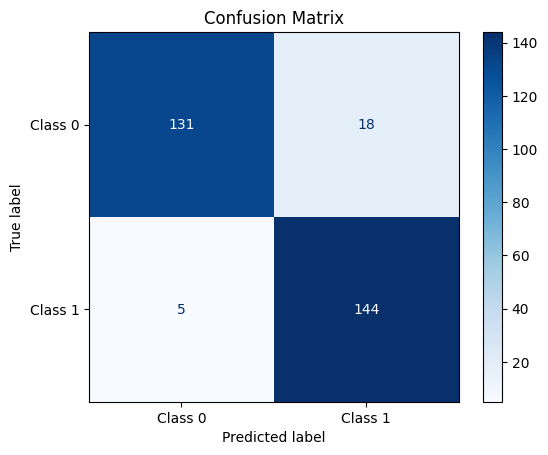

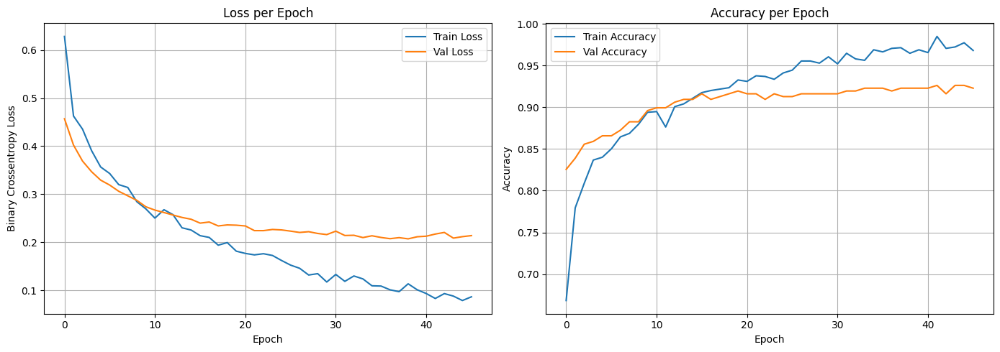

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()

cm = confusion_matrix(y_val, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Class 0', 'Class 1'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()


plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=True
)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=False
)

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers[:-30]:
    layer.trainable = False
for layer in base_model.layers[-30:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_train_features, y_train_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features.append(features)
    y_train_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_train_features = np.vstack(X_train_features)
y_train_labels = np.hstack(y_train_labels)

smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 7, 7, 1920)

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42
)

model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dense(1024),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.5),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryCrossentropy()
model.compile(optimizer=AdamW(learning_rate=2e-5), loss=loss_fn, metrics=['accuracy'])

class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint("best_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")
y_pred = model.predict(X_val)
y_pred_classes = (y_pred > 0.5).astype("int32").flatten()
print("\nClassification Report:\n", classification_report(y_val, y_pred_classes))

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.5972 - loss: 0.7256
Epoch 1: val_accuracy improved from -inf to 0.80537, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - accuracy: 0.5985 - loss: 0.7241 - val_accuracy: 0.8054 - val_loss: 0.4799 - learning_rate: 2.0000e-05
Epoch 2/150
35/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7707 - loss: 0.5164
Epoch 2: val_accuracy improved from 0.80537 to 0.82886, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.7703 - loss: 0.5165 - val_accuracy: 0.8289 - val_loss: 0.4231 - learning_rate: 2.0000e-05
Epoch 3/150
33/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7885 - loss: 0.4558
Epoch 3: val_accuracy improved from 0.82886 to 0.83893, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.7880 - loss: 0.4589 - val_accuracy: 0.8389 - val_loss

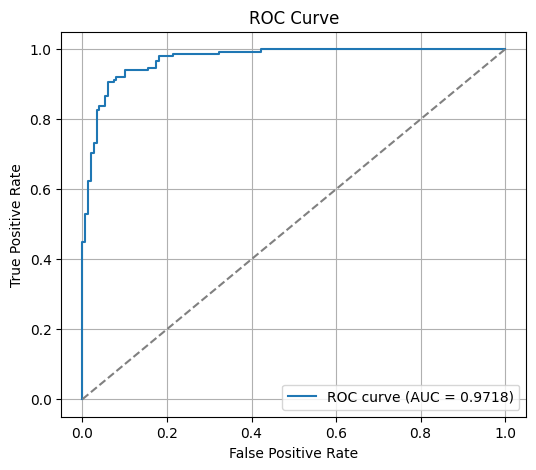

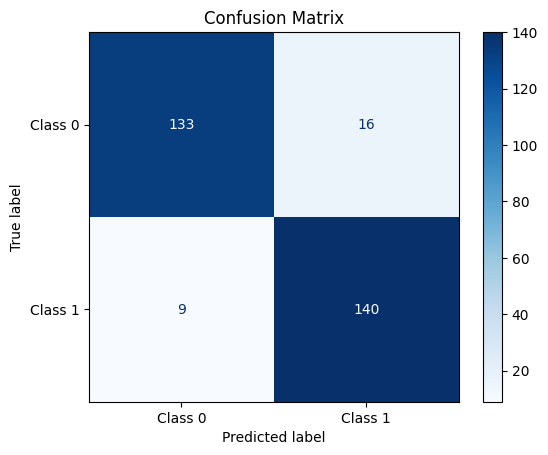

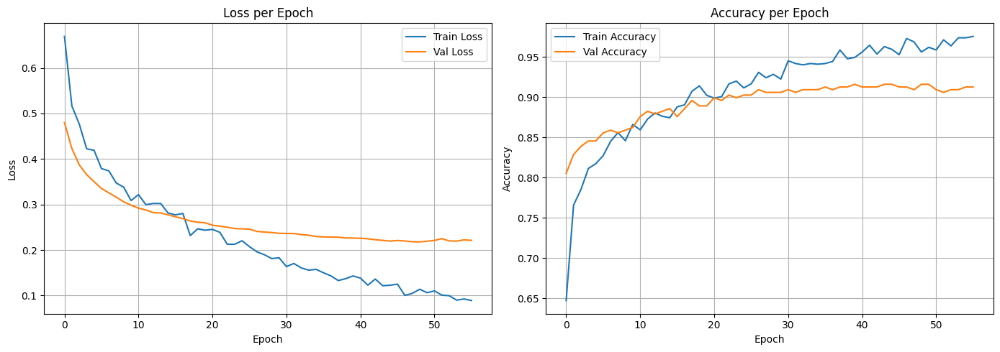

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()

cm = confusion_matrix(y_val, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Class 0', 'Class 1'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=True
)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=False
)

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers[:-30]:
    layer.trainable = False
for layer in base_model.layers[-30:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_train_features, y_train_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features.append(features)
    y_train_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_train_features = np.vstack(X_train_features)
y_train_labels = np.hstack(y_train_labels)

smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 7, 7, 1920)

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42
)

model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.5),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(negative_slope=0.1),
    layers.Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryCrossentropy()
model.compile(optimizer=AdamW(learning_rate=2e-5), loss=loss_fn, metrics=['accuracy'])

class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint("best_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")
y_pred = model.predict(X_val)
y_pred_classes = (y_pred > 0.5).astype("int32").flatten()
print("\nClassification Report:\n", classification_report(y_val, y_pred_classes))

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.5174 - loss: 0.9142
Epoch 1: val_accuracy improved from -inf to 0.68792, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.5181 - loss: 0.9123 - val_accuracy: 0.6879 - val_loss: 0.5699 - learning_rate: 2.0000e-05
Epoch 2/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.6745 - loss: 0.6320
Epoch 2: val_accuracy improved from 0.68792 to 0.75503, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.6746 - loss: 0.6320 - val_accuracy: 0.7550 - val_loss: 0.5055 - learning_rate: 2.0000e-05
Epoch 3/150
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.7264 - loss: 0.5648
Epoch 3: val_accuracy improved from 0.75503 to 0.78523, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - accuracy: 0.72

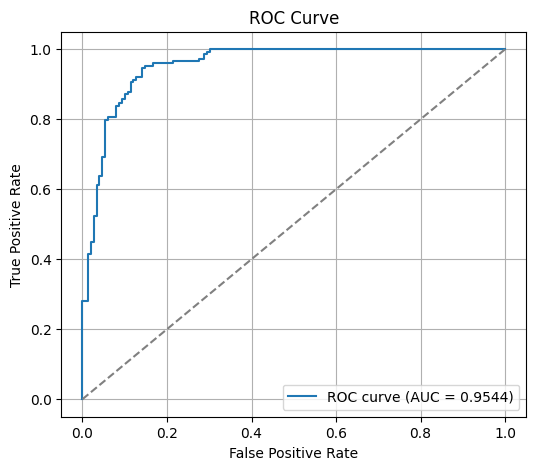

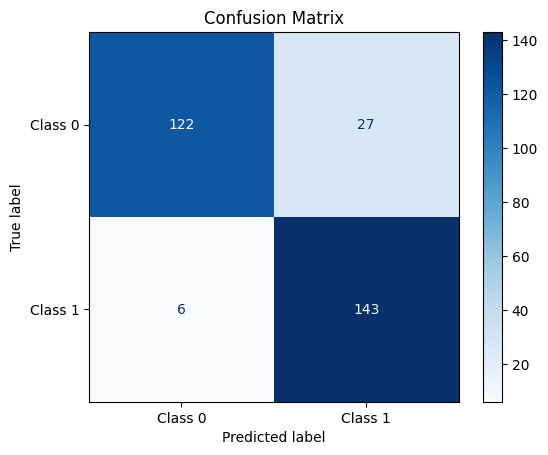

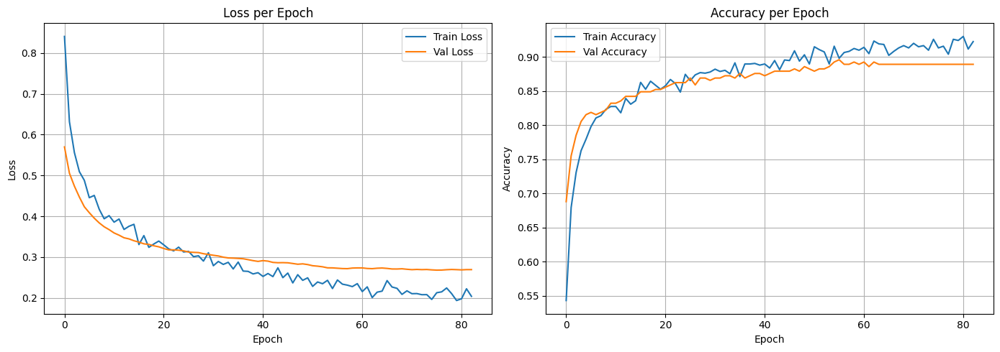

In [ ]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay

fpr, tpr, thresholds = roc_curve(y_val, y_pred)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()

cm = confusion_matrix(y_val, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Class 0', 'Class 1'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.grid(False)
plt.show()

plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=True
)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=False
)

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers[:-30]:
    layer.trainable = False
for layer in base_model.layers[-30:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_train_features, y_train_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features.append(features)
    y_train_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_train_features = np.vstack(X_train_features)
y_train_labels = np.hstack(y_train_labels)

smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 7, 7, 1920)

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42
)

model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dense(1024),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.4),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryCrossentropy()
model.compile(optimizer=AdamW(learning_rate=2e-5), loss=loss_fn, metrics=['accuracy'])

class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint("best_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")
y_pred = model.predict(X_val)
y_pred_classes = (y_pred > 0.5).astype("int32").flatten()
print("\nClassification Report:\n", classification_report(y_val, y_pred_classes))

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.6385 - loss: 0.6599
Epoch 1: val_accuracy improved from -inf to 0.81208, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 9s 135ms/step - accuracy: 0.6402 - loss: 0.6577 - val_accuracy: 0.8121 - val_loss: 0.4432 - learning_rate: 2.0000e-05
Epoch 2/150
32/38 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7937 - loss: 0.4366
Epoch 2: val_accuracy improved from 0.81208 to 0.83221, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - accuracy: 0.7935 - loss: 0.4390 - val_accuracy: 0.8322 - val_loss: 0.3920 - learning_rate: 2.0000e-05
Epoch 3/150
33/38 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8169 - loss: 0.4308
Epoch 3: val_accuracy improved from 0.83221 to 0.83893, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.815


🔁 Fold 1/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.89      0.91       149
         1.0       0.90      0.93      0.91       149

    accuracy                           0.91       298
   macro avg       0.91      0.91      0.91       298
weighted avg       0.91      0.91      0.91       298



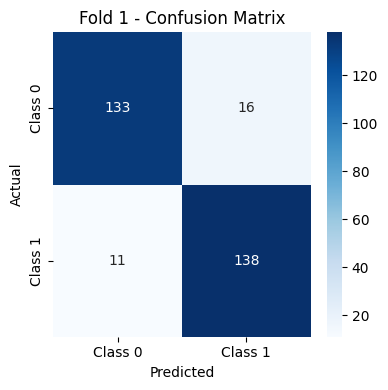

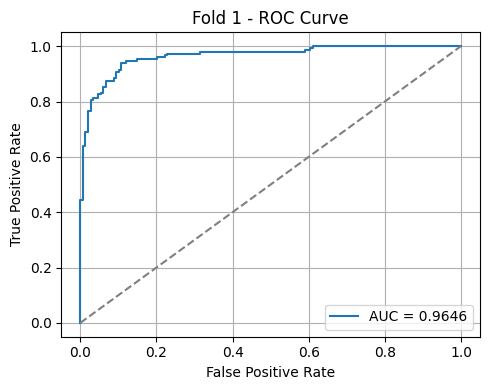

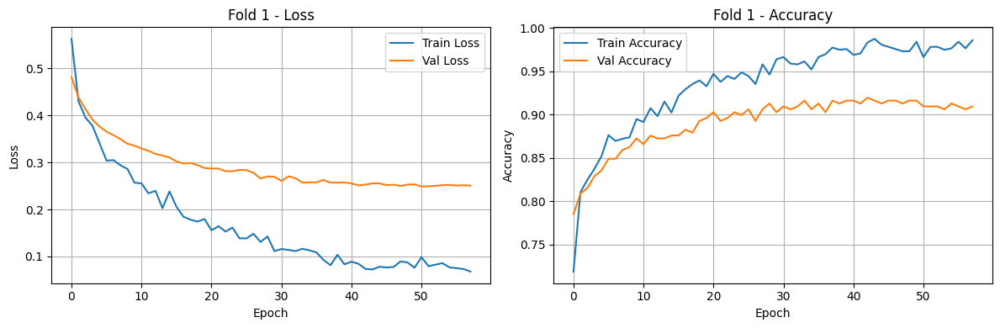


🔁 Fold 2/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.94      0.92      0.93       149
         1.0       0.92      0.94      0.93       148

    accuracy                           0.93       297
   macro avg       0.93      0.93      0.93       297
weighted avg       0.93      0.93      0.93       297



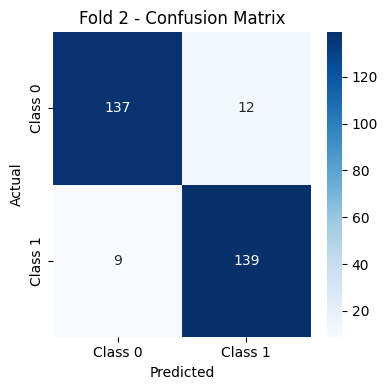

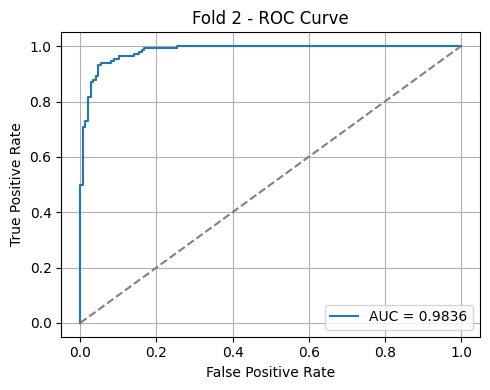

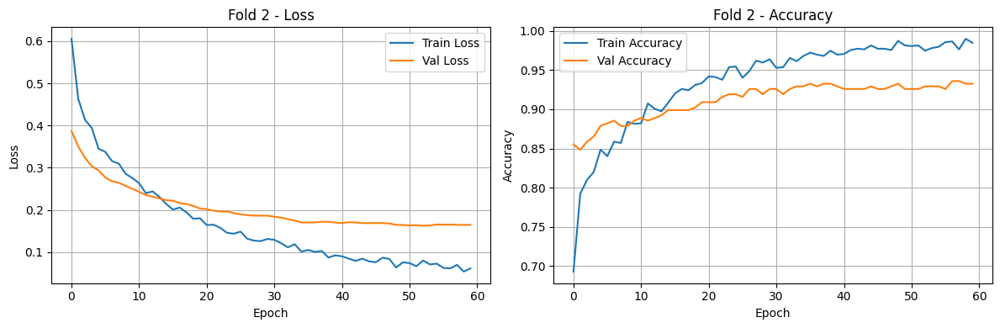


🔁 Fold 3/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.93      0.87      0.90       149
         1.0       0.88      0.93      0.90       148

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297



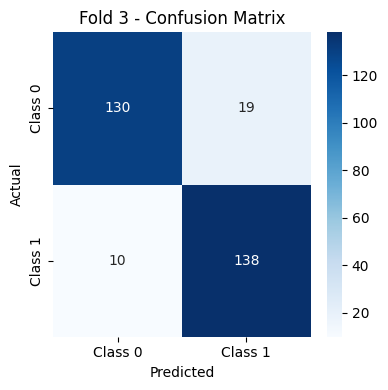

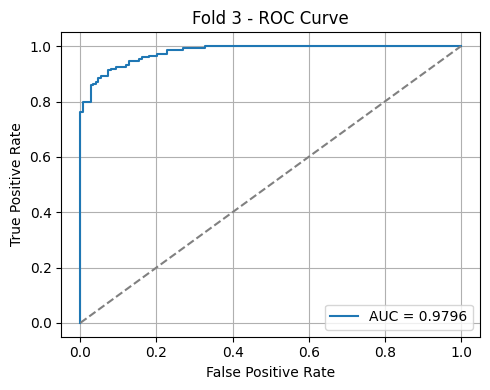

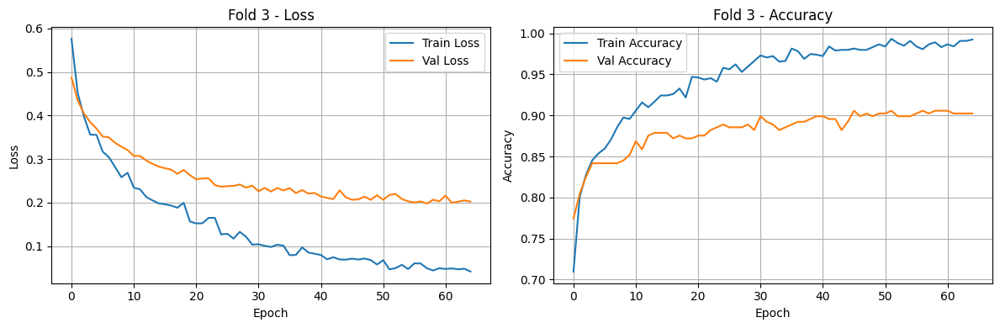


🔁 Fold 4/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.91      0.92       148
         1.0       0.91      0.93      0.92       149

    accuracy                           0.92       297
   macro avg       0.92      0.92      0.92       297
weighted avg       0.92      0.92      0.92       297



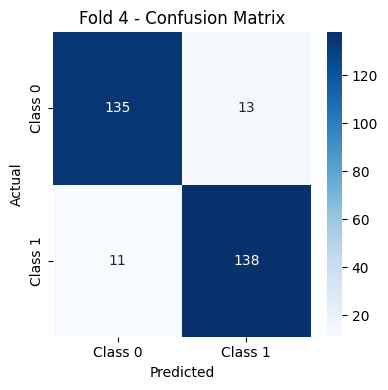

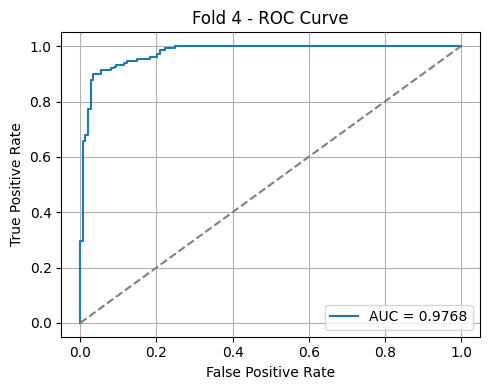

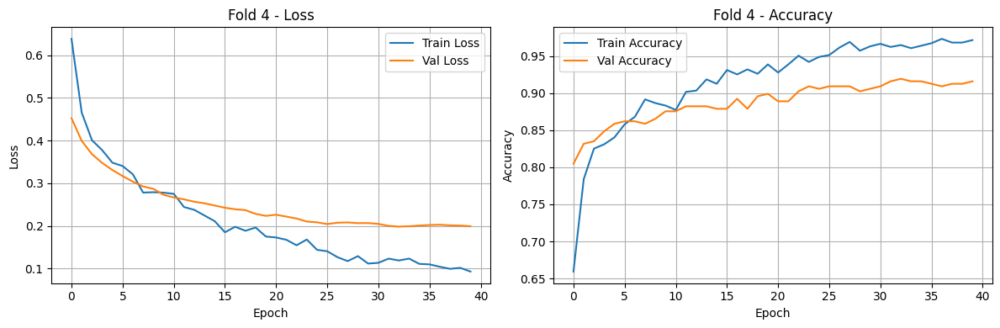


🔁 Fold 5/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.94      0.91      0.92       148
         1.0       0.91      0.95      0.93       149

    accuracy                           0.93       297
   macro avg       0.93      0.93      0.93       297
weighted avg       0.93      0.93      0.93       297



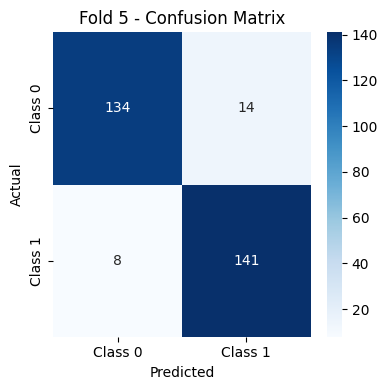

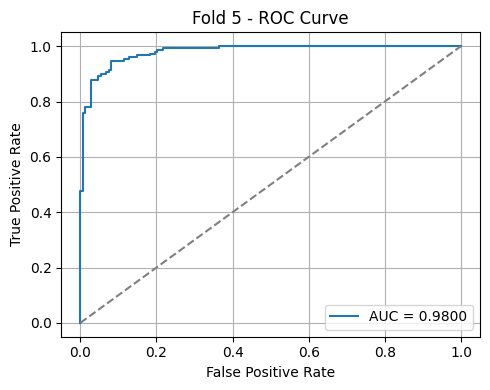

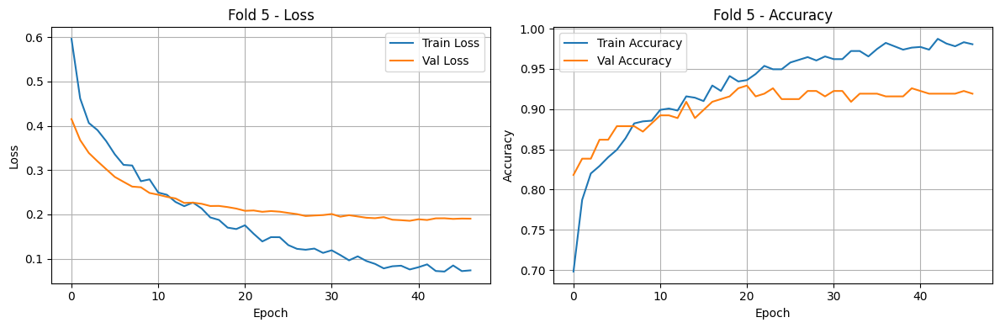

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

fold_no = 1

for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{n_splits} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled[train_idx], y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
        layers.Input(shape=(7, 7, 1920)),
        layers.GlobalAveragePooling2D(),
        layers.Dense(1024),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.4),
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Dropout(0.3),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=AdamW(learning_rate=2e-5),
        loss=BinaryCrossentropy(),
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=0),
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=0
    )

    y_pred = model.predict(X_val, verbose=0)
    y_pred_classes = (y_pred > 0.5).astype("int32").flatten()

    print("\n📊 Classification Report:\n", classification_report(y_val, y_pred_classes))

    cm = confusion_matrix(y_val, y_pred_classes)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.title(f"Fold {fold_no} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    fpr, tpr, _ = roc_curve(y_val, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(5, 4))
    plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.4f}')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.title(f"Fold {fold_no} - ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold_no} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    fold_no += 1

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.applications import DenseNet201
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import numpy as np
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=True
)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(224, 224), batch_size=32, class_mode='binary', shuffle=False
)

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers[:-30]:
    layer.trainable = False
for layer in base_model.layers[-30:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_train_features, y_train_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features.append(features)
    y_train_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_train_features = np.vstack(X_train_features)
y_train_labels = np.hstack(y_train_labels)

smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 7, 7, 1920)

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42
)

model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.5),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(negative_slope=0.1),
    layers.Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryCrossentropy()
model.compile(optimizer=AdamW(learning_rate=2e-5), loss=loss_fn, metrics=['accuracy'])

class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint("best_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")
y_pred = model.predict(X_val)
y_pred_classes = (y_pred > 0.5).astype("int32").flatten()
print("\nClassification Report:\n", classification_report(y_val, y_pred_classes))

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.5661 - loss: 0.7708
Epoch 1: val_accuracy improved from -inf to 0.79195, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - accuracy: 0.5673 - loss: 0.7692 - val_accuracy: 0.7919 - val_loss: 0.5004 - learning_rate: 2.0000e-05
Epoch 2/150
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7053 - loss: 0.5944
Epoch 2: val_accuracy improved from 0.79195 to 0.81879, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.7076 - loss: 0.5918 - val_accuracy: 0.8188 - val_loss: 0.4508 - learning_rate: 2.0000e-05
Epoch 3/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7294 - loss: 0.5443
Epoch 3: val_accuracy improved from 0.81879 to 0.83221, saving model to best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.730


🔁 Fold 1/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.95      0.83      0.88       149
         1.0       0.85      0.96      0.90       149

    accuracy                           0.89       298
   macro avg       0.90      0.89      0.89       298
weighted avg       0.90      0.89      0.89       298



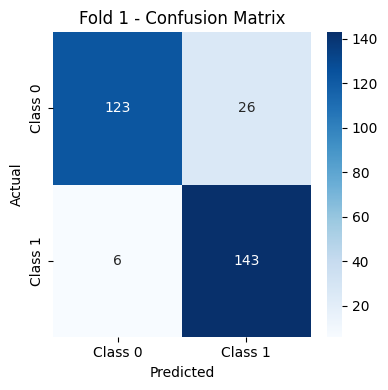

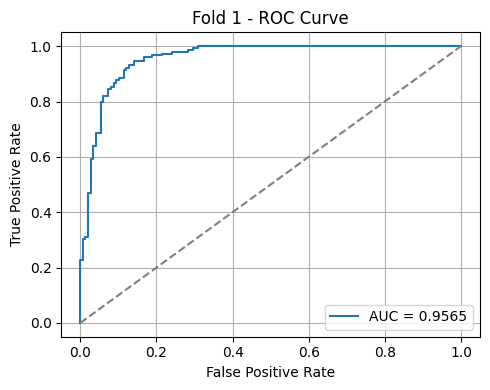

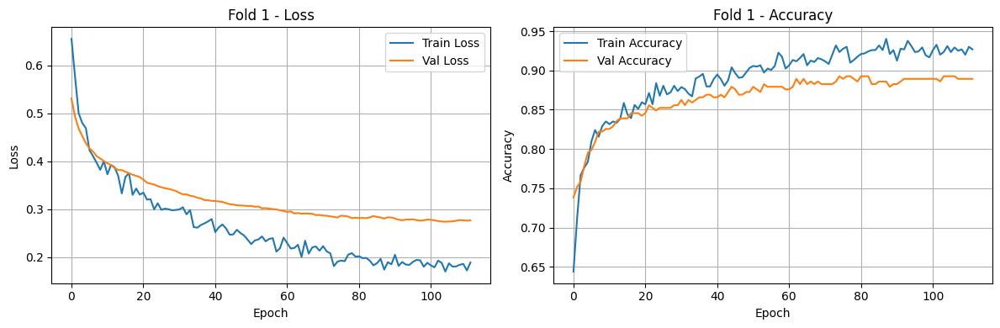


🔁 Fold 2/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.94      0.85      0.89       149
         1.0       0.86      0.95      0.90       148

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297



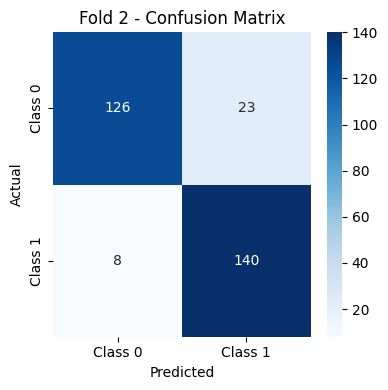

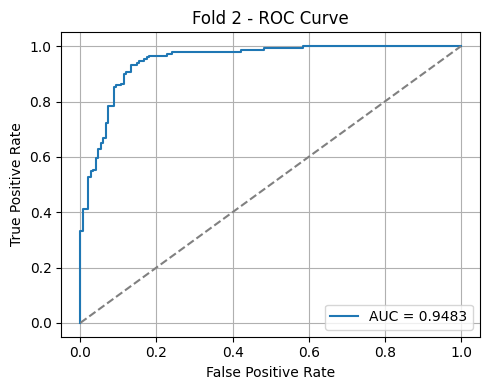

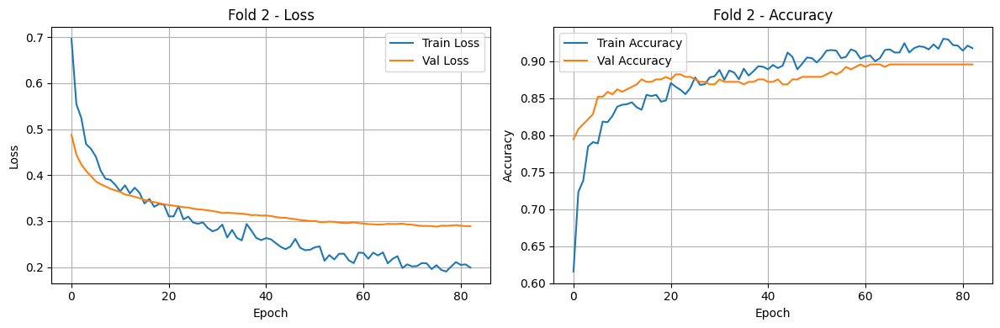


🔁 Fold 3/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      0.90      0.93       149
         1.0       0.91      0.97      0.93       148

    accuracy                           0.93       297
   macro avg       0.93      0.93      0.93       297
weighted avg       0.93      0.93      0.93       297



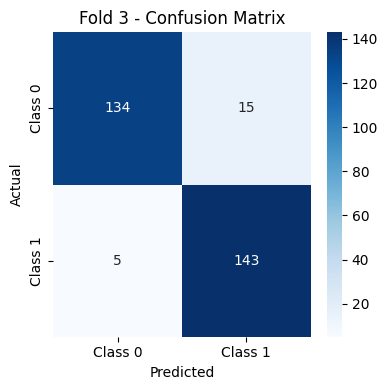

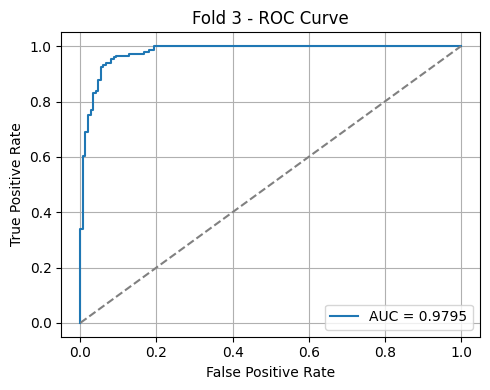

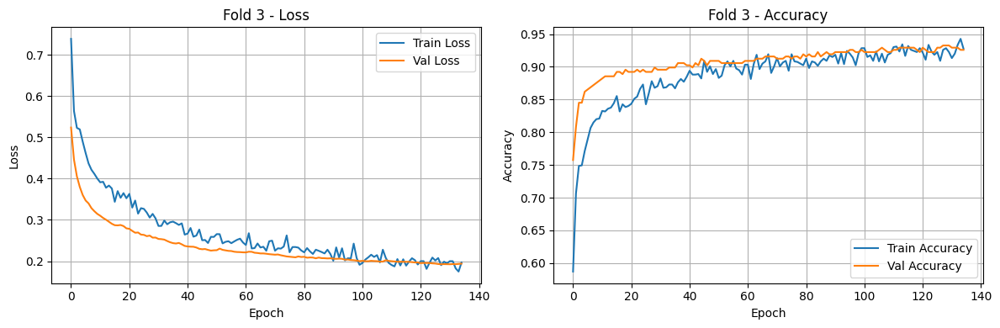


🔁 Fold 4/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.93      0.93       148
         1.0       0.93      0.92      0.93       149

    accuracy                           0.93       297
   macro avg       0.93      0.93      0.93       297
weighted avg       0.93      0.93      0.93       297



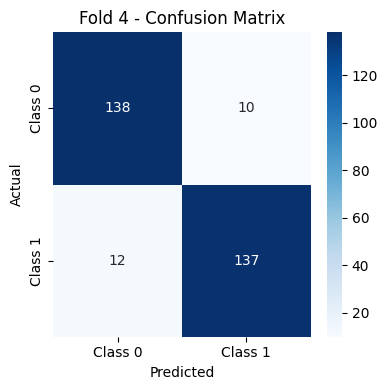

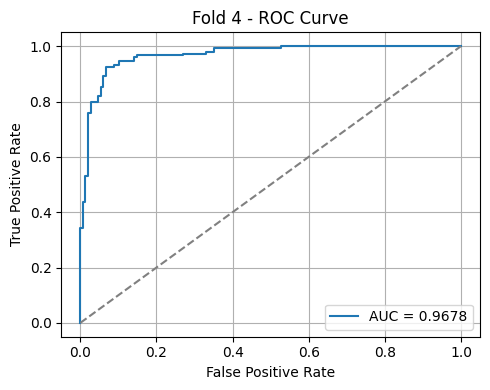

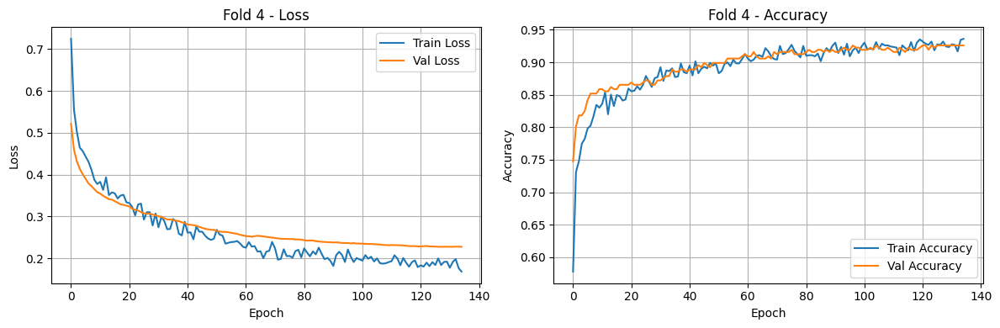


🔁 Fold 5/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.93      0.90      0.91       148
         1.0       0.90      0.93      0.92       149

    accuracy                           0.92       297
   macro avg       0.92      0.92      0.92       297
weighted avg       0.92      0.92      0.92       297



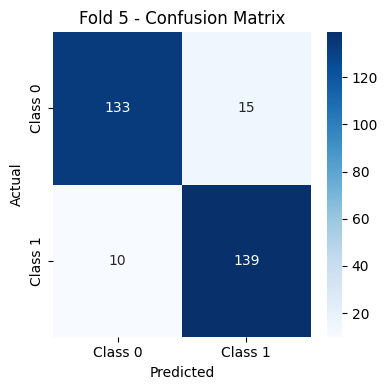

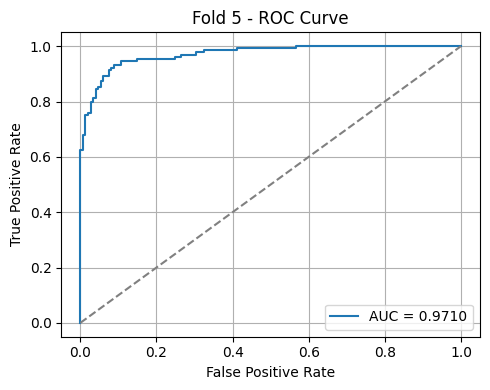

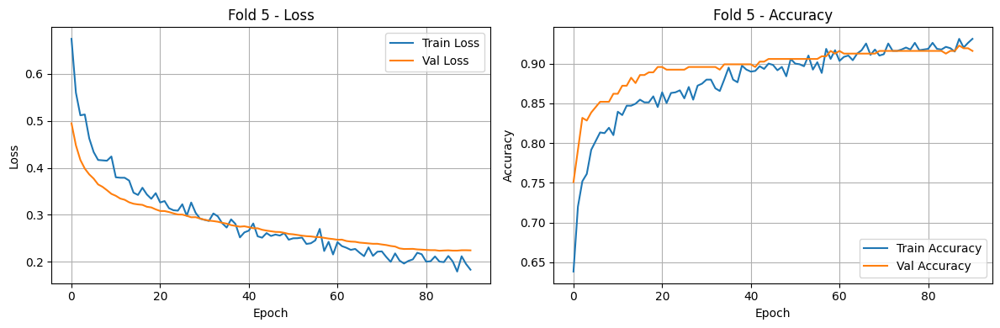

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

fold_no = 1

for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{n_splits} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled[train_idx], y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
        layers.Input(shape=(7, 7, 1920)),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.5),
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.1),
        layers.Dropout(0.4),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=AdamW(learning_rate=2e-5),
        loss=BinaryCrossentropy(),
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=0),
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=0
    )

    y_pred = model.predict(X_val, verbose=0)
    y_pred_classes = (y_pred > 0.5).astype("int32").flatten()

    print("\n📊 Classification Report:\n", classification_report(y_val, y_pred_classes))

    cm = confusion_matrix(y_val, y_pred_classes)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.title(f"Fold {fold_no} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    fpr, tpr, _ = roc_curve(y_val, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(5, 4))
    plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.4f}')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.title(f"Fold {fold_no} - ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold_no} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    fold_no += 1

In [ ]:
########### Xception #############

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.applications import Xception
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import numpy as np
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(299, 299), batch_size=32, class_mode='binary', shuffle=True
)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(299, 299), batch_size=32, class_mode='binary', shuffle=False
)

base_model = Xception(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
for layer in base_model.layers[:-20]:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_train_features, y_train_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features.append(features)
    y_train_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_train_features = np.vstack(X_train_features)
y_train_labels = np.hstack(y_train_labels)

smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 10, 10, 2048)

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42
)

model = models.Sequential([
    layers.Input(shape=(10, 10, 2048)),
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.5),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(negative_slope=0.1),
    layers.Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryCrossentropy()
model.compile(optimizer=AdamW(learning_rate=2e-5), loss=loss_fn, metrics=['accuracy'])

class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint("xception_best_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")
y_pred = model.predict(X_val)
y_pred_classes = (y_pred > 0.5).astype("int32").flatten()
print("\nClassification Report:\n", classification_report(y_val, y_pred_classes))

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5263 - loss: 0.7977
Epoch 1: val_accuracy improved from -inf to 0.72148, saving model to xception_best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.5277 - loss: 0.7959 - val_accuracy: 0.7215 - val_loss: 0.5606 - learning_rate: 2.0000e-05
Epoch 2/150
33/38 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7057 - loss: 0.6104
Epoch 2: val_accuracy improved from 0.72148 to 0.76846, saving model to xception_best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7086 - loss: 0.6040 - val_accuracy: 0.7685 - val_loss: 0.5047 - learning_rate: 2.0000e-05
Epoch 3/150
34/38 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7543 - loss: 0.5361
Epoch 3: val_accuracy improved from 0.76846 to 0.78523, saving model to xception_best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s

Found 1246 images belonging to 2 classes.

🔁 Fold 1/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.91      0.87      0.89       149
         1.0       0.88      0.91      0.89       149

    accuracy                           0.89       298
   macro avg       0.89      0.89      0.89       298
weighted avg       0.89      0.89      0.89       298



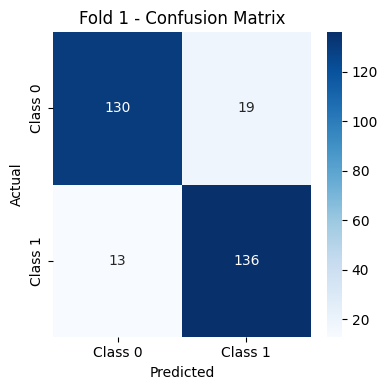

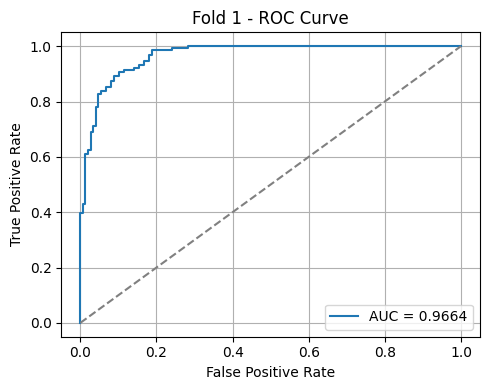

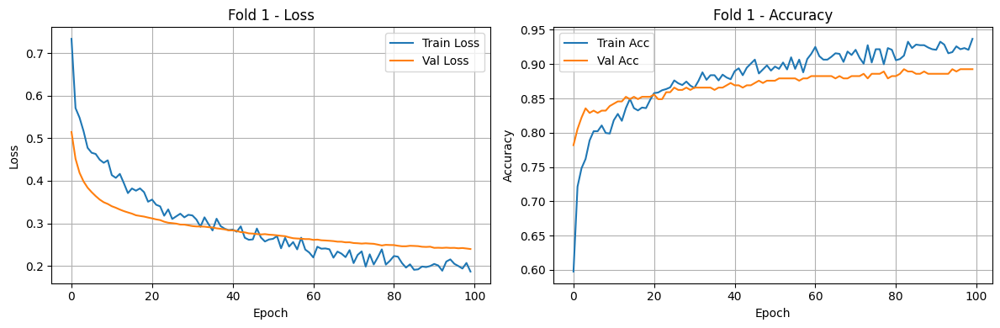


🔁 Fold 2/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.89      0.89      0.89       148
         1.0       0.89      0.89      0.89       149

    accuracy                           0.89       297
   macro avg       0.89      0.89      0.89       297
weighted avg       0.89      0.89      0.89       297



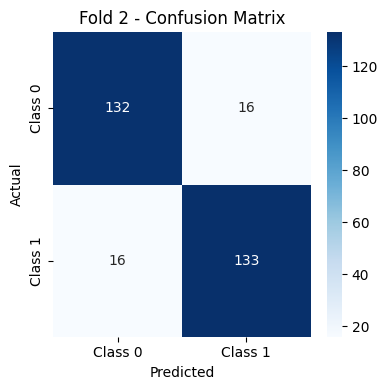

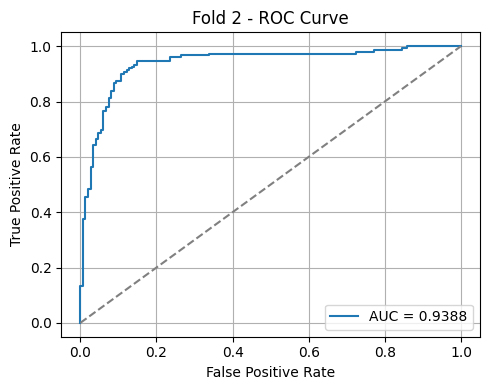

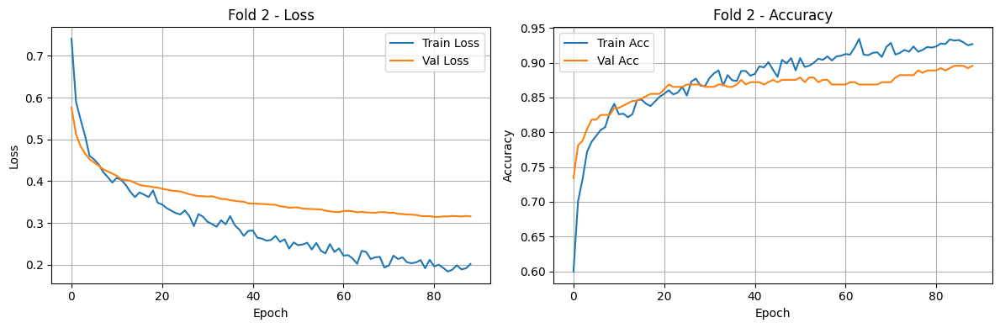


🔁 Fold 3/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.90      0.87      0.88       148
         1.0       0.88      0.90      0.89       149

    accuracy                           0.89       297
   macro avg       0.89      0.89      0.89       297
weighted avg       0.89      0.89      0.89       297



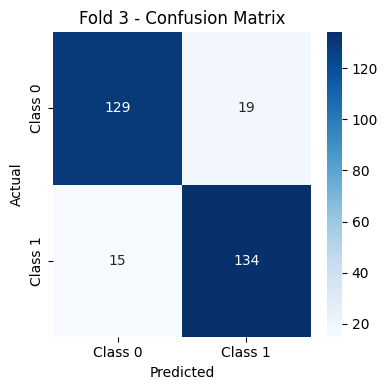

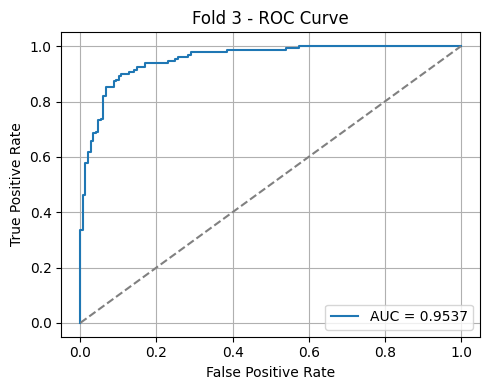

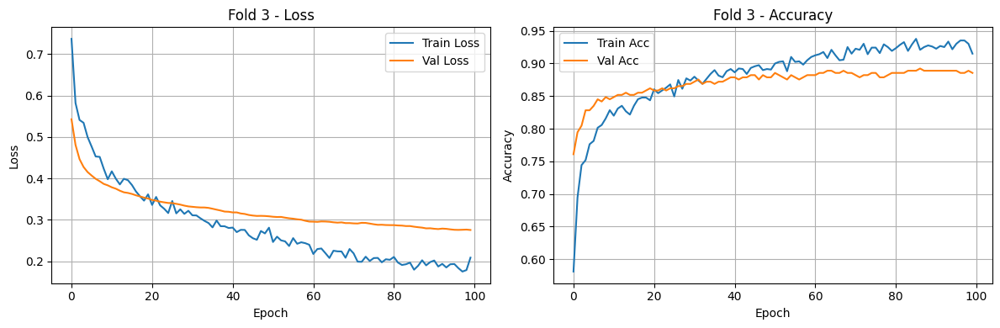


🔁 Fold 4/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.89      0.90       149
         1.0       0.89      0.92      0.90       148

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297



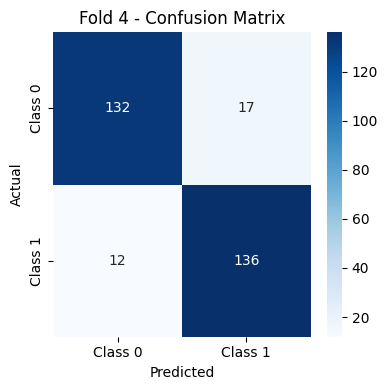

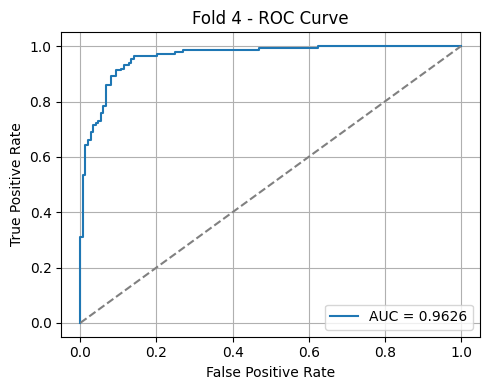

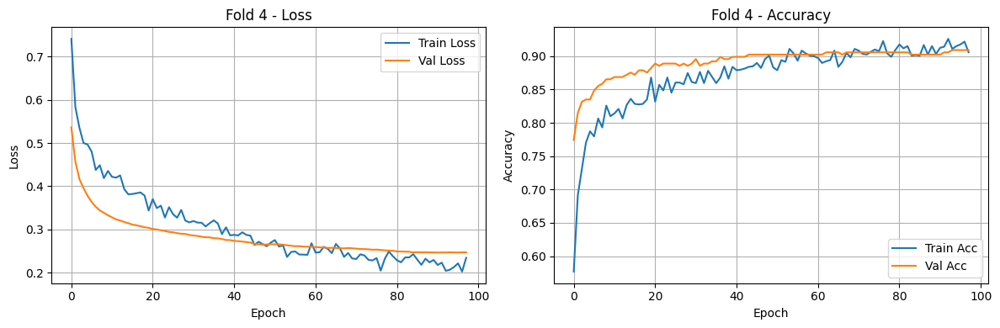


🔁 Fold 5/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.86      0.88      0.87       149
         1.0       0.88      0.85      0.86       148

    accuracy                           0.87       297
   macro avg       0.87      0.87      0.87       297
weighted avg       0.87      0.87      0.87       297



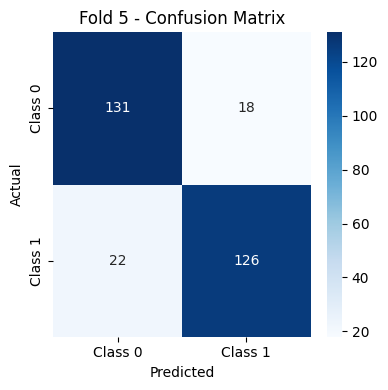

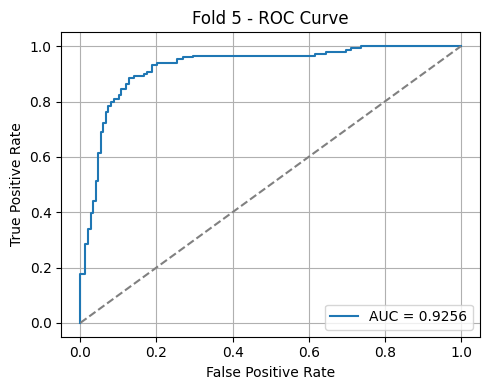

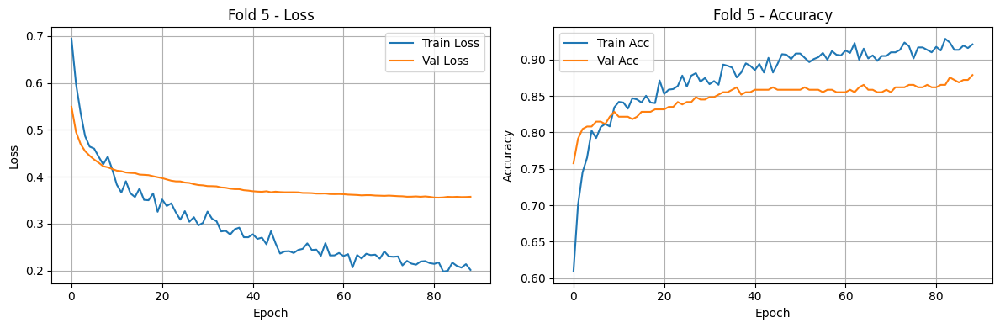

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import Xception
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = '/content/drive/MyDrive/train'

datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

train_generator = datagen.flow_from_directory(
    train_dir, target_size=(299, 299), batch_size=32,
    class_mode='binary', shuffle=True
)

base_model = Xception(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
for layer in base_model.layers[:-20]:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_features, y_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_features.append(features)
    y_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_features = np.vstack(X_features)
y_labels = np.hstack(y_labels)

smote = SMOTE(random_state=42)
X_flat, y_resampled = smote.fit_resample(X_features.reshape(X_features.shape[0], -1), y_labels)

scaler = StandardScaler()
X_flat = scaler.fit_transform(X_flat)
X_resampled = X_flat.reshape(-1, 10, 10, 2048)

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

fold_no = 1
for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{n_splits} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled[train_idx], y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
        layers.Input(shape=(10, 10, 2048)),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.5),
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.1),
        layers.Dropout(0.4),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=AdamW(learning_rate=2e-5),
        loss=BinaryCrossentropy(),
        metrics=['accuracy']
    )

    callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=7, monitor='val_loss', restore_best_weights=True, verbose=0),
        tf.keras.callbacks.ReduceLROnPlateau(patience=4, factor=0.5, min_lr=1e-7, verbose=0)
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=100,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=0
    )

    y_pred = model.predict(X_val, verbose=0)
    y_pred_classes = (y_pred > 0.5).astype("int32").flatten()

    print("\n📊 Classification Report:\n", classification_report(y_val, y_pred_classes))

    cm = confusion_matrix(y_val, y_pred_classes)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.title(f"Fold {fold_no} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    fpr, tpr, _ = roc_curve(y_val, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(5, 4))
    plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.4f}')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.title(f"Fold {fold_no} - ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold_no} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Acc')
    plt.plot(history.history['val_accuracy'], label='Val Acc')
    plt.title(f'Fold {fold_no} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    fold_no += 1

Found 1246 images belonging to 2 classes.

🔁 Fold 1/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.90      0.87      0.88       149
         1.0       0.87      0.91      0.89       149

    accuracy                           0.89       298
   macro avg       0.89      0.89      0.89       298
weighted avg       0.89      0.89      0.89       298



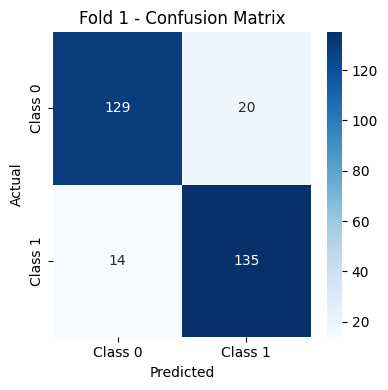

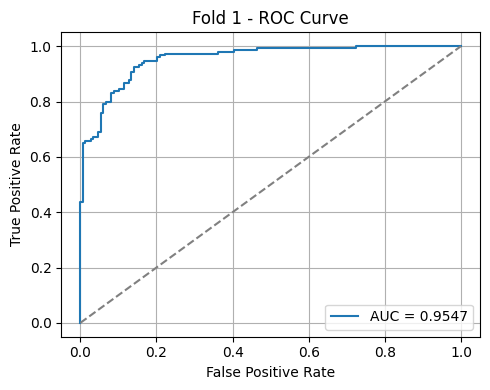

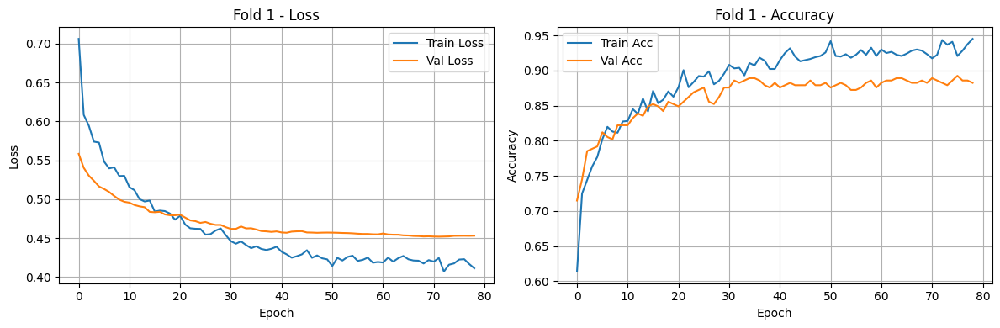


🔁 Fold 2/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.94      0.83      0.88       149
         1.0       0.85      0.95      0.89       148

    accuracy                           0.89       297
   macro avg       0.89      0.89      0.89       297
weighted avg       0.89      0.89      0.89       297



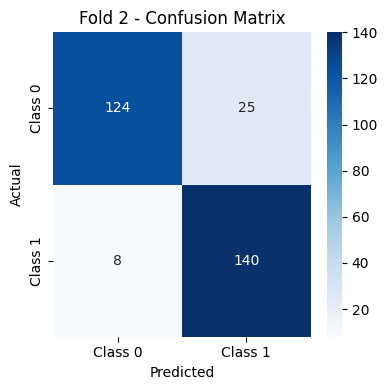

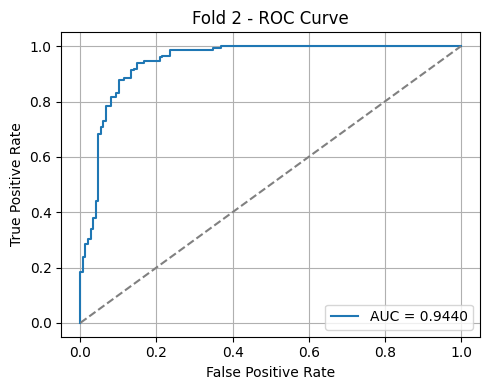

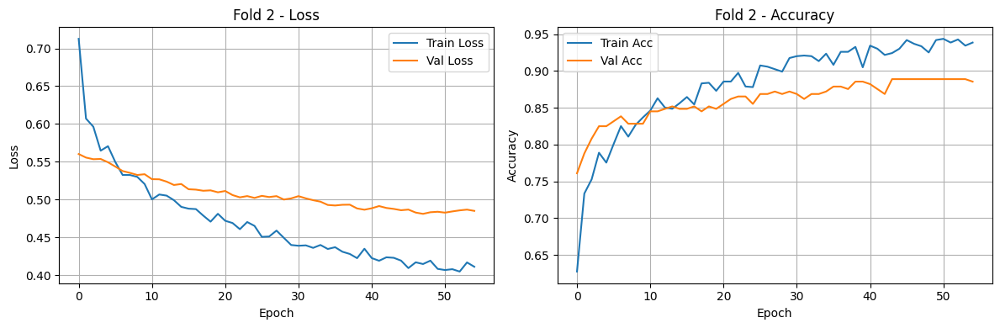


🔁 Fold 3/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.87      0.89       149
         1.0       0.88      0.92      0.90       148

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297



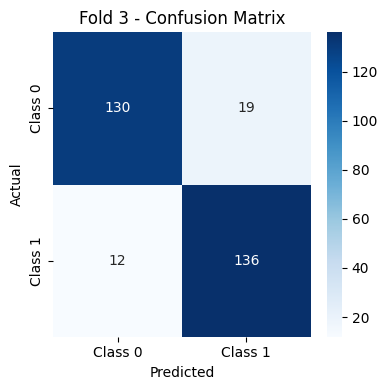

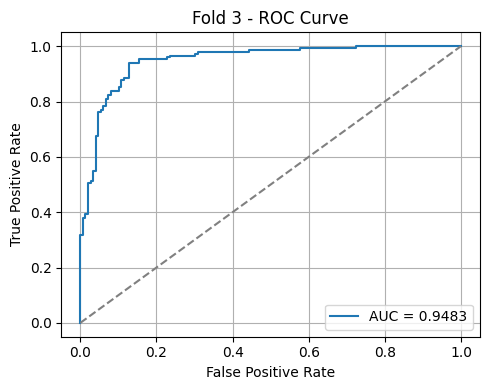

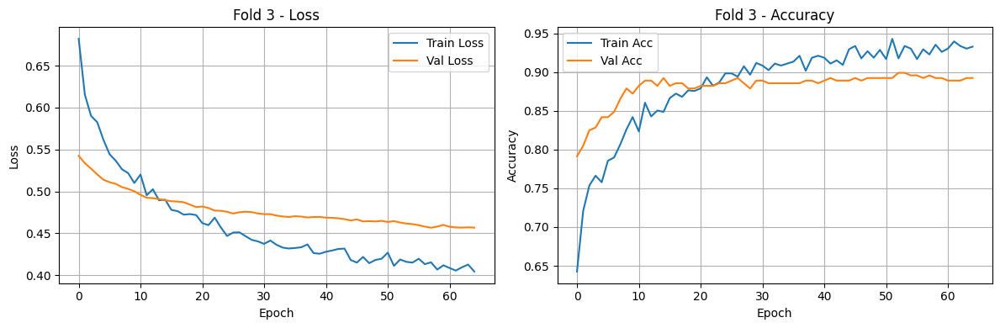


🔁 Fold 4/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.88      0.86      0.87       148
         1.0       0.86      0.89      0.87       149

    accuracy                           0.87       297
   macro avg       0.87      0.87      0.87       297
weighted avg       0.87      0.87      0.87       297



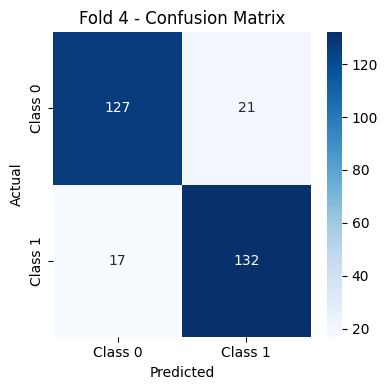

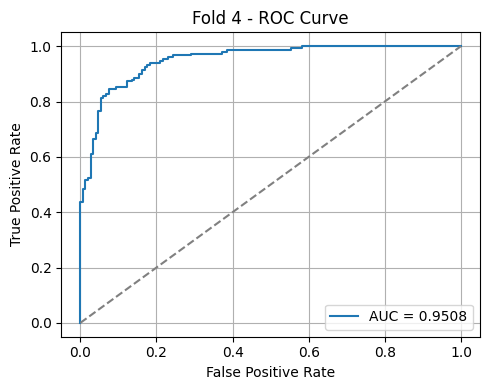

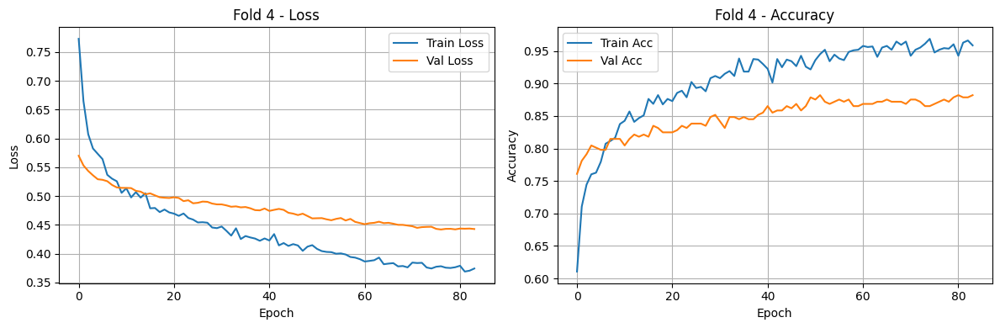


🔁 Fold 5/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.91      0.93      0.92       148
         1.0       0.93      0.91      0.92       149

    accuracy                           0.92       297
   macro avg       0.92      0.92      0.92       297
weighted avg       0.92      0.92      0.92       297



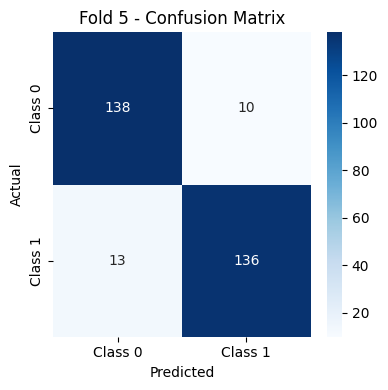

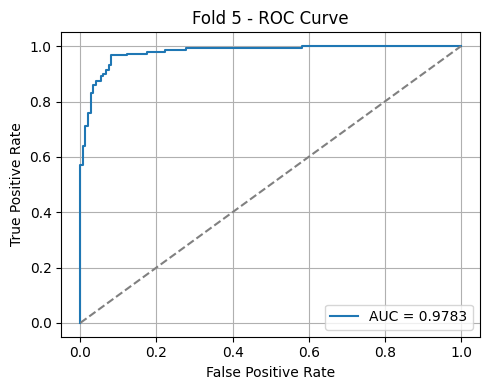

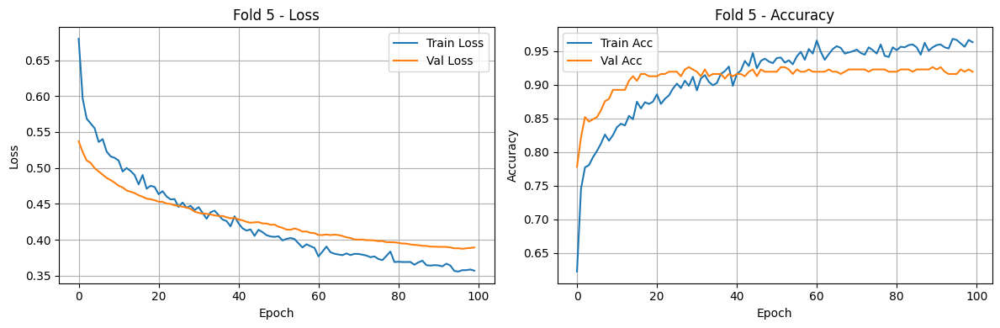

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import Xception
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = '/content/drive/MyDrive/train'

datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

train_generator = datagen.flow_from_directory(
    train_dir, target_size=(299, 299), batch_size=32,
    class_mode='binary', shuffle=True
)

base_model = Xception(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
for layer in base_model.layers[:-20]:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_features, y_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_features.append(features)
    y_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_features = np.vstack(X_features)
y_labels = np.hstack(y_labels)

smote = SMOTE(random_state=42)
X_flat, y_resampled = smote.fit_resample(X_features.reshape(X_features.shape[0], -1), y_labels)

scaler = StandardScaler()
X_flat = scaler.fit_transform(X_flat)
X_resampled = X_flat.reshape(-1, 10, 10, 2048)

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

fold_no = 1
for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{n_splits} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled[train_idx], y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
        layers.Input(shape=(10, 10, 2048)),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.4),
        layers.Dense(512, kernel_regularizer=l2(0.0005)),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.1),
        layers.Dropout(0.3),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=AdamW(learning_rate=3e-5),
        loss=BinaryFocalCrossentropy(alpha=0.25, gamma=2.0),
        metrics=['accuracy']
    )

    callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=7, monitor='val_loss', restore_best_weights=True, verbose=0),
        tf.keras.callbacks.ReduceLROnPlateau(patience=4, factor=0.5, min_lr=1e-7, verbose=0)
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=100,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=0
    )
    y_pred = model.predict(X_val, verbose=0)
    y_pred_classes = (y_pred > 0.5).astype("int32").flatten()

    print("\n📊 Classification Report:\n", classification_report(y_val, y_pred_classes))

    cm = confusion_matrix(y_val, y_pred_classes)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.title(f"Fold {fold_no} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    fpr, tpr, _ = roc_curve(y_val, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(5, 4))
    plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.4f}')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.title(f"Fold {fold_no} - ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold_no} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Acc')
    plt.plot(history.history['val_accuracy'], label='Val Acc')
    plt.title(f'Fold {fold_no} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    fold_no += 1

In [ ]:
########### InceptionV3 ##############

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.applications import InceptionV3
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import numpy as np
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

train_dir = '/content/drive/MyDrive/train'
validation_dir = '/content/drive/MyDrive/validation'

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(299, 299), batch_size=32, class_mode='binary', shuffle=True
)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir, target_size=(299, 299), batch_size=32, class_mode='binary', shuffle=False
)

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
for layer in base_model.layers[:-20]:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_train_features, y_train_labels = [], []
for i, (images, labels) in enumerate(train_generator):
    features = feature_extractor.predict(images, verbose=0)
    X_train_features.append(features)
    y_train_labels.append(labels)
    if i >= len(train_generator) - 1:
        break

X_train_features = np.vstack(X_train_features)
y_train_labels = np.hstack(y_train_labels)

smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(
    X_train_features.reshape(X_train_features.shape[0], -1),
    y_train_labels
)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 8, 8, 2048)

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_resampled, test_size=0.2, stratify=y_resampled, random_state=42
)

model = models.Sequential([
    layers.Input(shape=(8, 8, 2048)),
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.5),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(negative_slope=0.1),
    layers.Dropout(0.4),
    layers.Dense(1, activation='sigmoid')
])

loss_fn = BinaryCrossentropy()
model.compile(optimizer=AdamW(learning_rate=2e-5), loss=loss_fn, metrics=['accuracy'])

class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint("inceptionv3_best_model.keras", monitor='val_accuracy', save_best_only=True, verbose=1)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=150,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")
y_pred = model.predict(X_val)
y_pred_classes = (y_pred > 0.5).astype("int32").flatten()
print("\nClassification Report:\n", classification_report(y_val, y_pred_classes))

Found 1246 images belonging to 2 classes.
Found 309 images belonging to 2 classes.
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.5696 - loss: 0.7400
Epoch 1: val_accuracy improved from -inf to 0.77181, saving model to inceptionv3_best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.5710 - loss: 0.7387 - val_accuracy: 0.7718 - val_loss: 0.5322 - learning_rate: 2.0000e-05
Epoch 2/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7366 - loss: 0.5623
Epoch 2: val_accuracy did not improve from 0.77181
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.7362 - loss: 0.5629 - val_accuracy: 0.7718 - val_loss: 0.4762 - learning_rate: 2.0000e-05
Epoch 3/150
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7627 - loss: 0.5150
Epoch 3: val_accuracy improved from 0.77181 to 0.79195, saving model to inceptionv3_best_model.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.7617 - loss: 0.5

Found 1246 images belonging to 2 classes.

🔁 Fold 1/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.90      0.87      0.88       149
         1.0       0.87      0.91      0.89       149

    accuracy                           0.89       298
   macro avg       0.89      0.89      0.89       298
weighted avg       0.89      0.89      0.89       298



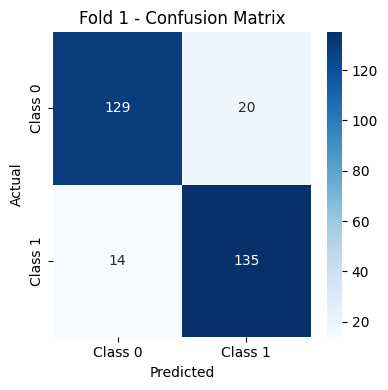

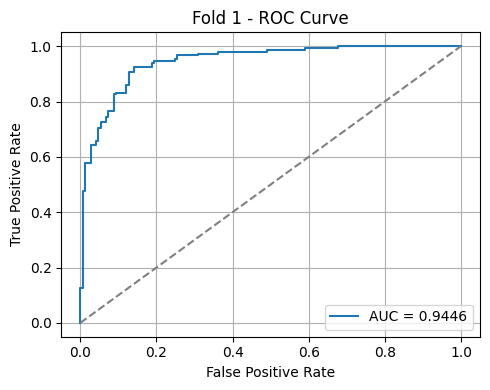

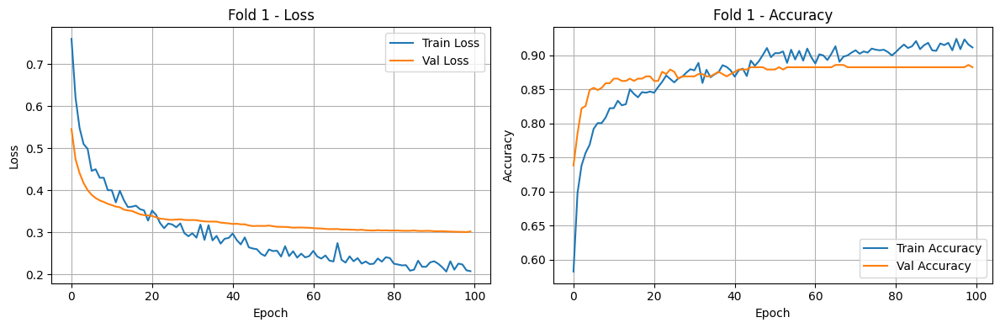


🔁 Fold 2/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.88      0.92      0.90       148
         1.0       0.92      0.88      0.90       149

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297



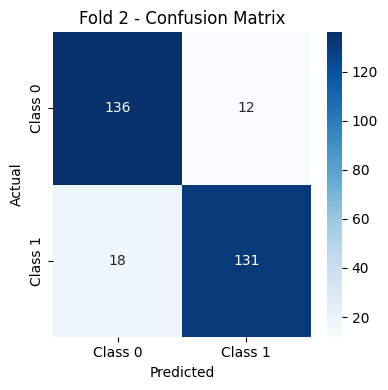

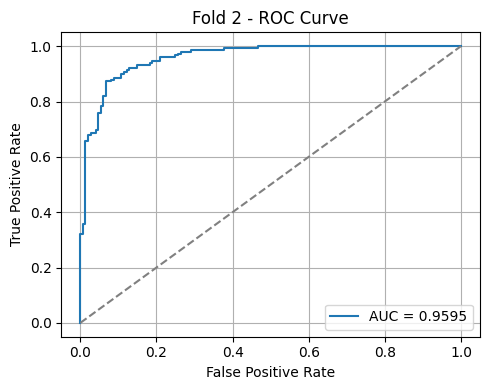

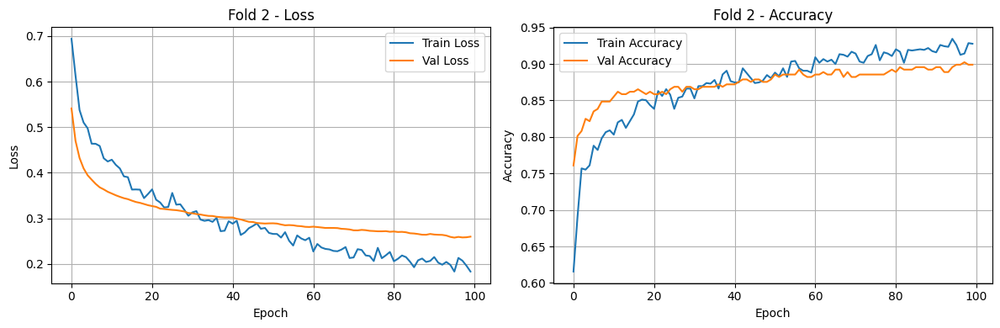


🔁 Fold 3/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.87      0.84      0.86       148
         1.0       0.85      0.88      0.86       149

    accuracy                           0.86       297
   macro avg       0.86      0.86      0.86       297
weighted avg       0.86      0.86      0.86       297



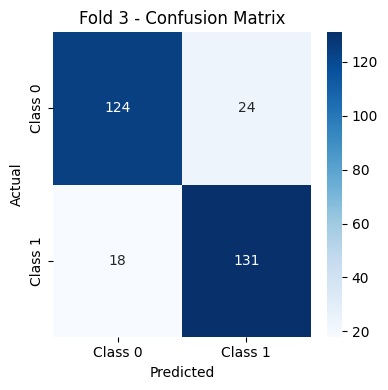

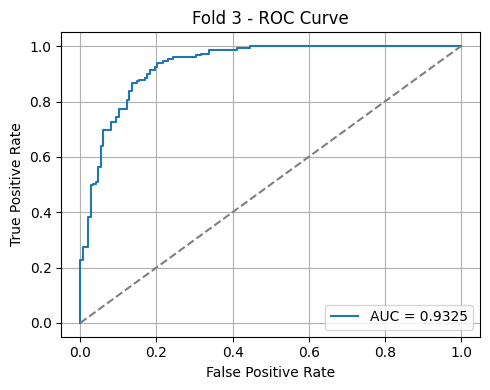

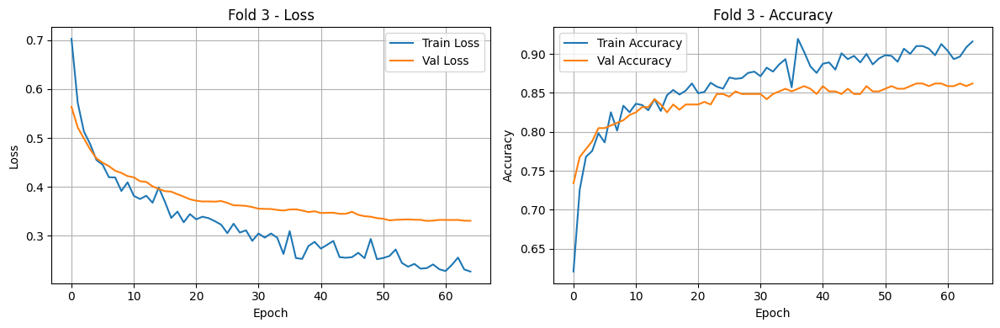


🔁 Fold 4/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.93      0.87      0.90       149
         1.0       0.87      0.93      0.90       148

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297



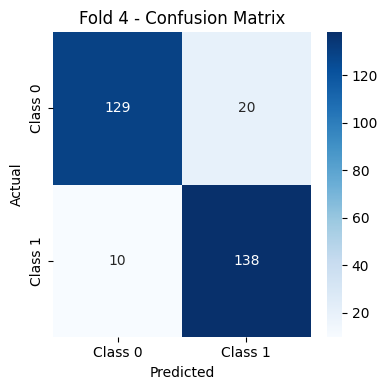

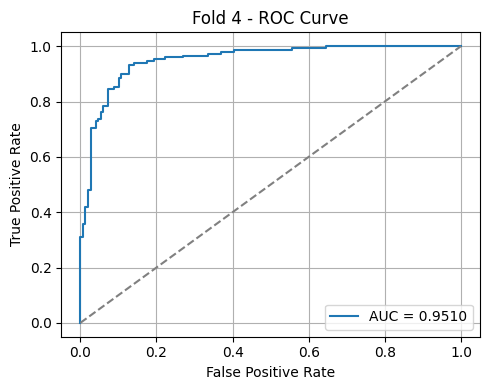

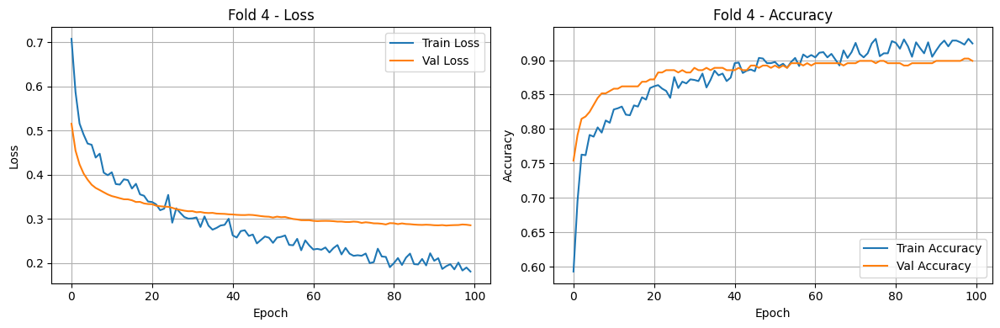


🔁 Fold 5/5 ----------------------------------------

📊 Classification Report:
               precision    recall  f1-score   support

         0.0       0.88      0.85      0.86       149
         1.0       0.85      0.88      0.86       148

    accuracy                           0.86       297
   macro avg       0.86      0.86      0.86       297
weighted avg       0.86      0.86      0.86       297



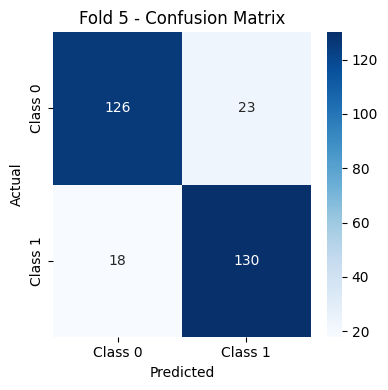

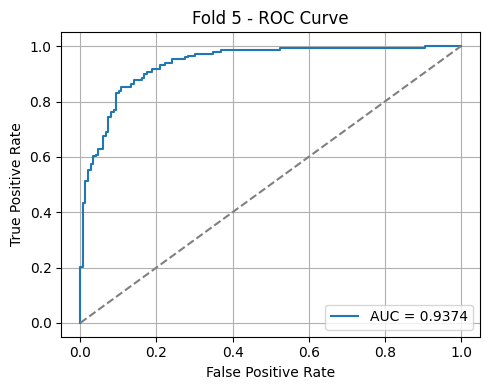

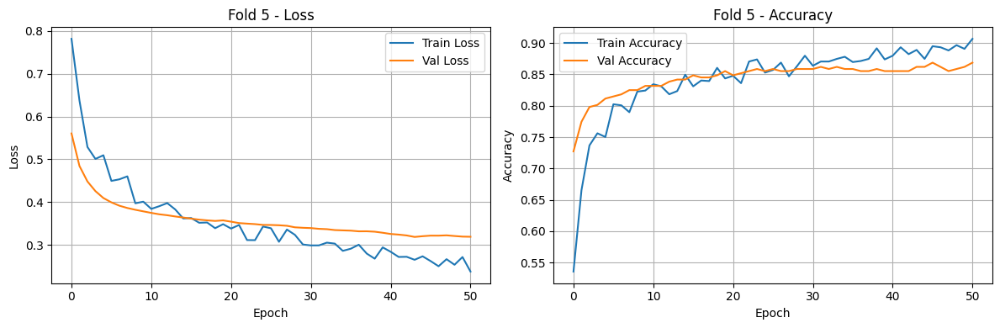

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import AdamW
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

train_dir = '/content/drive/MyDrive/train'

datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

generator = datagen.flow_from_directory(
    train_dir,
    target_size=(299, 299),
    batch_size=32,
    class_mode='binary',
    shuffle=True
)

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
for layer in base_model.layers[:-20]:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)

X_features, y_labels = [], []
for i, (images, labels) in enumerate(generator):
    features = feature_extractor.predict(images, verbose=0)
    X_features.append(features)
    y_labels.append(labels)
    if i >= len(generator) - 1:
        break

X_features = np.vstack(X_features)
y_labels = np.hstack(y_labels)

X_flat = X_features.reshape(X_features.shape[0], -1)
X_resampled, y_resampled = SMOTE(random_state=42).fit_resample(X_flat, y_labels)
X_resampled = StandardScaler().fit_transform(X_resampled)
X_resampled = X_resampled.reshape(-1, 8, 8, 2048)

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

fold_no = 1
for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{n_splits} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled[train_idx], y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
        layers.Input(shape=(8, 8, 2048)),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.5),
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.1),
        layers.Dropout(0.4),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(
        optimizer=AdamW(learning_rate=2e-5),
        loss=BinaryCrossentropy(),
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=0)
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=100,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=0
    )

    y_pred = model.predict(X_val, verbose=0)
    y_pred_classes = (y_pred > 0.5).astype("int32").flatten()

    print("\n📊 Classification Report:\n", classification_report(y_val, y_pred_classes))

    cm = confusion_matrix(y_val, y_pred_classes)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
    plt.title(f"Fold {fold_no} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    fpr, tpr, _ = roc_curve(y_val, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(5, 4))
    plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.4f}')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.title(f"Fold {fold_no} - ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold_no} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    fold_no += 1

In [ ]:
####### پاتولوژی######

In [ ]:
import pandas as pd
from PIL import Image
import os
from google.colab import files
uploaded = files.upload()

Saving train - Copy.xlsx to train - Copy.xlsx
Saving validation - Copy.xlsx to validation - Copy.xlsx


In [ ]:
import os
import pandas as pd
train_image_dir = "/content/drive/MyDrive/train"
val_image_dir = "/content/drive/MyDrive/validation"

image_counts = {
    "train_malignant": 0,
    "train_benign": 0,
    "validation_malignant": 0,
    "validation_benign": 0
}

def get_correct_image_name(image_name):
    return image_name.strip().lower().replace(".jpg", "")

def check_and_count_images(image_name, dataset_type):
    image_name_corrected = get_correct_image_name(image_name)

    if dataset_type == "train":
        if os.path.exists(os.path.join(train_image_dir, "malignant", f"{image_name_corrected}.jpg")):
            image_counts["train_malignant"] += 1
            print(f"{image_name_corrected}.jpg belongs to train (malignant)")
        if os.path.exists(os.path.join(train_image_dir, "benign", f"{image_name_corrected}.jpg")):
            image_counts["train_benign"] += 1
            print(f"{image_name_corrected}.jpg belongs to train (benign)")

    elif dataset_type == "validation":
        if os.path.exists(os.path.join(val_image_dir, "malignant", f"{image_name_corrected}.jpg")):
            image_counts["validation_malignant"] += 1
            print(f"{image_name_corrected}.jpg belongs to validation (malignant)")
        if os.path.exists(os.path.join(val_image_dir, "benign", f"{image_name_corrected}.jpg")):
            image_counts["validation_benign"] += 1
            print(f"{image_name_corrected}.jpg belongs to validation (benign)")

train_df = pd.read_excel("train - Copy.xlsx")
val_df = pd.read_excel("validation - Copy.xlsx")

train_df["dermoscopy_image_path"] = train_df["dermoscopy_image_path"].apply(lambda x: f"{x.strip().lower()}.jpg")
val_df["dermoscopy_image_path"] = val_df["dermoscopy_image_path"].apply(lambda x: f"{x.strip().lower()}.jpg")

for image_name in train_df["dermoscopy_image_path"]:
    check_and_count_images(image_name, "train")

for image_name in val_df["dermoscopy_image_path"]:
    check_and_count_images(image_name, "validation")

total_images = sum(image_counts.values())
print("\nFinal Results:")
print(f"Total number of images: {total_images}")
print(f"تعداد تصاویر در فولدر train (malignant): {image_counts['train_malignant']}")
print(f"تعداد تصاویر در فولدر train (benign): {image_counts['train_benign']}")
print(f"تعداد تصاویر در فولدر validation (malignant): {image_counts['validation_malignant']}")
print(f"تعداد تصاویر در فولدر validation (benign): {image_counts['validation_benign']}")

p114.jpg belongs to train (malignant)
p114-1.jpg belongs to train (malignant)
p115.jpg belongs to train (malignant)
p115-1.jpg belongs to train (malignant)
p115-2.jpg belongs to train (malignant)
p112.jpg belongs to train (malignant)
p112-1.jpg belongs to train (malignant)
p112-2.jpg belongs to train (malignant)
p112-3.jpg belongs to train (malignant)
p112-4.jpg belongs to train (malignant)
p112-5.jpg belongs to train (malignant)
p20-1.jpg belongs to train (benign)
p20-2.jpg belongs to train (benign)
p111.jpg belongs to train (malignant)
p111-1.jpg belongs to train (malignant)
p111-3.jpg belongs to train (malignant)
p111-4.jpg belongs to train (malignant)
p111-5.jpg belongs to train (malignant)
p111-6.jpg belongs to train (malignant)
p111-7.jpg belongs to train (malignant)
p111-8.jpg belongs to train (malignant)
p107-1.jpg belongs to train (malignant)
p107-2.jpg belongs to train (malignant)
p107-3.jpg belongs to train (malignant)
p22-3.jpg belongs to train (malignant)
p22-7.jpg belongs

In [ ]:
import pandas as pd
import os

train_df = pd.read_excel('/content/train - Copy.xlsx')
validation_df = pd.read_excel('/content/validation - Copy.xlsx')

print("Train DataFrame:")
print(train_df.head())

print("\nValidation DataFrame:")
print(validation_df.head())

train_images_path = '/content/drive/MyDrive/train'
validation_images_path = '/content/drive/MyDrive/validation'

def get_image_path(row, base_path):
    diagnosis_folder = 'benign' if row['diagnosis'] == 0 else 'malignant'
    return os.path.join(base_path, diagnosis_folder, f"{row['dermoscopy_image_path']}.jpg")

train_df['image_path'] = train_df.apply(lambda row: get_image_path(row, train_images_path), axis=1)

validation_df['image_path'] = validation_df.apply(lambda row: get_image_path(row, validation_images_path), axis=1)

print("\nUpdated Train DataFrame with image paths:")
print(train_df[['dermoscopy_image_path', 'image_path']].head())

print("\nUpdated Validation DataFrame with image paths:")
print(validation_df[['dermoscopy_image_path', 'image_path']].head())

train_df.to_excel('/content/train_with_image_paths.xlsx', index=False)
validation_df.to_excel('/content/validation_with_image_paths.xlsx', index=False)

Train DataFrame:
  gender                                clinical_impression  \
0      f  Dysplastic nevus-Lentigo/SK-Lentigo maligna -I...   
1      f  Dysplastic nevus-Lentigo/SK-Lentigo maligna -I...   
2      f                         Malignant melanoma in situ   
3      f                         Malignant melanoma in situ   
4      f                         Malignant melanoma in situ   

                             macroscopic_description  \
0  three(3) paraff  and three (3) H&E glass slide...   
1  three(3) paraff  and three (3) H&E glass slide...   
2                                      0.4*0.3*0.3     
3                                      0.4*0.3*0.3     
4                                      0.4*0.3*0.3     

                             microscopic_description       location  \
0  epithelioid/spindle cell type   Vertical growt...  right forearm   
1  epithelioid/spindle cell type   Vertical growt...  right forearm   
2  mild hyperkeratosis, acanthosis, proliferated ...  

In [ ]:
def determine_malignancy(row):
    # اگر diagnosis برابر با 0 است، malignancy_grade را برابر با 0 قرار بده
    if row['diagnosis'] == 0:
        return 0  # برای diagnosis=0، درجه بدخیمی برابر با 0 است

    # Breslow Depth
    breslow = row['breslow(mm)']
    if breslow == 0:
        breslow_grade = 1  # Low
    elif 1 <= breslow <= 4:
        breslow_grade = 2  # Medium
    else:
        breslow_grade = 3  # High

    # Clark Level
    clark = row['clark']
    if clark <= 2:
        clark_grade = 1  # Low
    elif 3 <= clark <= 4:
        clark_grade = 2  # Medium
    else:
        clark_grade = 3  # High

    # Ulceration
    ulceration = row['ulceration']
    if ulceration == 0:
        ulceration_grade = 1  # Low
    else:
        ulceration_grade = 3  # High

    # Mitotic Activity
    mitotic = row['mitotic']
    if mitotic < 1:
        mitotic_grade = 1
    elif 1 <= mitotic < 3:
        mitotic_grade = 2  # Medium
    else:
        mitotic_grade = 3  # High

    # نمره‌دهی نهایی به بدخیمی بر اساس ترکیب این ویژگی‌ها
    final_score = breslow_grade + clark_grade + ulceration_grade + mitotic_grade

    # تعیین درجه نهایی بدخیمی بر اساس نمره کلی
    if final_score >= 10:
        return 3  # High
    elif 7 <= final_score < 10:
        return 2  # Medium
    else:
        return 1  # Low

train_df['malignancy_grade'] = train_df.apply(determine_malignancy, axis=1)
print(train_df[['diagnosis', 'breslow(mm)', 'clark', 'ulceration', 'mitotic', 'malignancy_grade']].head())

validation_df['malignancy_grade'] = validation_df.apply(determine_malignancy, axis=1)
print(validation_df[['diagnosis', 'breslow(mm)', 'clark', 'ulceration', 'mitotic', 'malignancy_grade']].head())

   diagnosis  breslow(mm)  clark  ulceration  mitotic  malignancy_grade
0          1          3.0      3           0      1.5                 2
1          1          3.0      3           0      1.5                 2
2          1          0.0      0           0      0.0                 1
3          1          0.0      0           0      0.0                 1
4          1          0.0      0           0      0.0                 1
   diagnosis  breslow(mm)  clark  ulceration  mitotic  malignancy_grade
0          0          0.0      0           1      0.0                 0
1          0          0.0      0           0      0.0                 0
2          0          0.0      0           0      0.0                 0
3          0          0.0      0           0      0.0                 0
4          1          0.0      0           0      0.0                 1


In [ ]:
malignancy_grade_counts = train_df['malignancy_grade'].value_counts()

print("Counts of each diagnosis:")
print(malignancy_grade_counts)

malignancy_grade_counts = validation_df['malignancy_grade'].value_counts()

print("Counts of each diagnosis:")
print(malignancy_grade_counts)

Counts of each diagnosis:
malignancy_grade
0    217
1    189
2     59
3     13
Name: count, dtype: int64
Counts of each diagnosis:
malignancy_grade
0    62
1    44
2    16
3     8
Name: count, dtype: int64


<ipython-input-7-ff1764a92e0a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=train_df, x='malignancy_grade', palette='viridis')


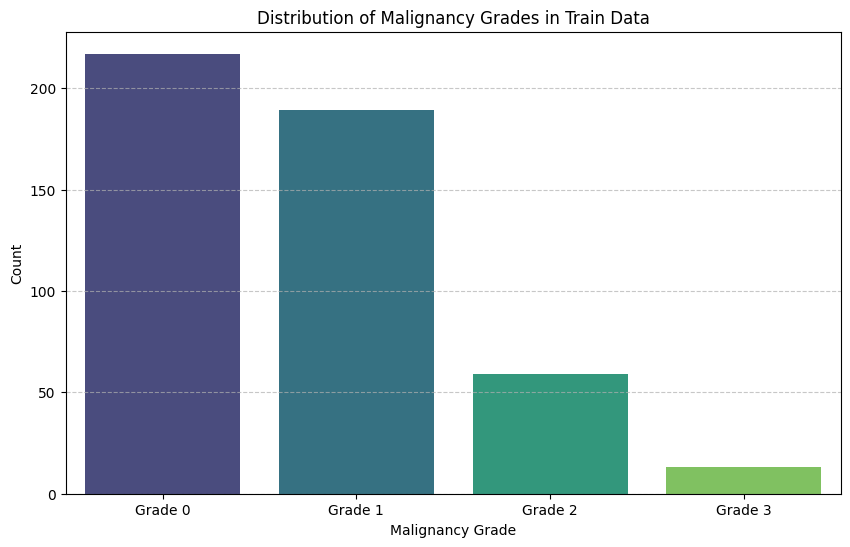

<ipython-input-7-ff1764a92e0a>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=validation_df, x='malignancy_grade', palette='viridis')


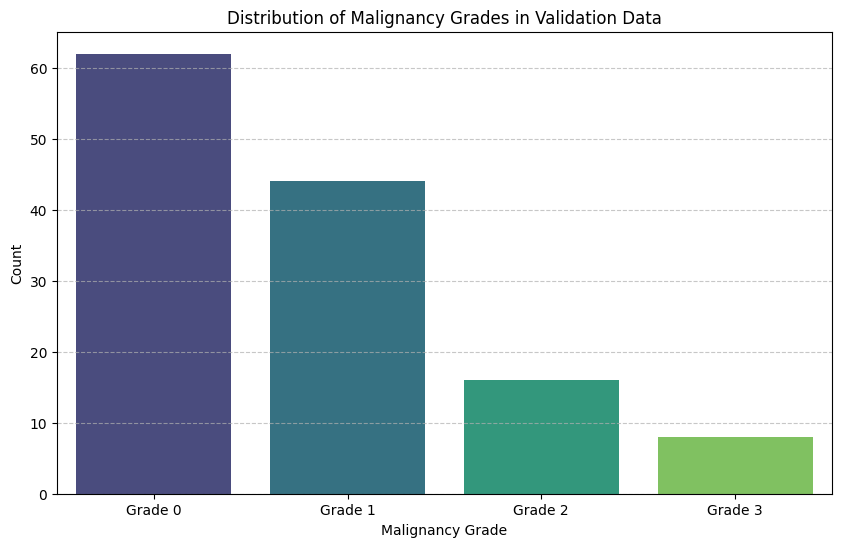

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(data=train_df, x='malignancy_grade', palette='viridis')
plt.title('Distribution of Malignancy Grades in Train Data')
plt.xlabel('Malignancy Grade')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1, 2, 3], labels=['Grade 0', 'Grade 1', 'Grade 2', 'Grade 3'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

plt.figure(figsize=(10, 6))
sns.countplot(data=validation_df, x='malignancy_grade', palette='viridis')
plt.title('Distribution of Malignancy Grades in Validation Data')
plt.xlabel('Malignancy Grade')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1, 2, 3], labels=['Grade 0', 'Grade 1', 'Grade 2', 'Grade 3'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
import pandas as pd

train_df = pd.read_excel('/content/train_with_image_paths.xlsx')
val_df = pd.read_excel('/content/validation_with_image_paths.xlsx')

def determine_malignancy(row):
    if row['diagnosis'] == 0:
        return 0

    # Breslow Depth
    breslow = row['breslow(mm)']
    if pd.isna(breslow):
        breslow_grade = 1
    elif breslow == 0:
        breslow_grade = 1
    elif 1 <= breslow <= 4:
        breslow_grade = 2
    else:
        breslow_grade = 3

    # Clark Level
    clark = row['clark']
    if pd.isna(clark):
        clark_grade = 1
    elif clark <= 2:
        clark_grade = 1
    elif 3 <= clark <= 4:
        clark_grade = 2
    else:
        clark_grade = 3

    # Ulceration
    ulceration = row['ulceration']
    if pd.isna(ulceration) or ulceration == 0:
        ulceration_grade = 1
    else:
        ulceration_grade = 3

    # Mitotic Activity
    mitotic = row['mitotic']
    if pd.isna(mitotic) or mitotic < 1:
        mitotic_grade = 1
    elif 1 <= mitotic < 3:
        mitotic_grade = 2
    else:
        mitotic_grade = 3

    final_score = breslow_grade + clark_grade + ulceration_grade + mitotic_grade

    if final_score >= 10:
        return 3
    elif 7 <= final_score < 10:
        return 2
    else:
        return 1

train_df['malignancy_grade'] = train_df.apply(determine_malignancy, axis=1)
val_df['malignancy_grade'] = val_df.apply(determine_malignancy, axis=1)

train_df.to_excel('/content/train_with_malignancy_grade.xlsx', index=False)
val_df.to_excel('/content/validation_with_malignancy_grade.xlsx', index=False)

print("✅ ستون malignancy_grade با موفقیت اضافه و ذخیره شد.")

✅ ستون malignancy_grade با موفقیت اضافه و ذخیره شد.


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tqdm import tqdm

train_df = pd.read_excel('/content/train_with_malignancy_grade.xlsx')
val_df = pd.read_excel('/content/validation_with_malignancy_grade.xlsx')

train_df = train_df[~train_df['malignancy_grade'].isna()]
val_df = val_df[~val_df['malignancy_grade'].isna()]
train_df['malignancy_grade'] = train_df['malignancy_grade'].astype(int)
val_df['malignancy_grade'] = val_df['malignancy_grade'].astype(int)

all_df = pd.concat([train_df, val_df], ignore_index=True)
all_labels = all_df['malignancy_grade'].values
all_paths = all_df['image_path'].values

def load_and_preprocess_image(path):
    try:
        img = load_img(path, target_size=(224, 224))
        img_array = img_to_array(img)
        img_array = tf.keras.applications.densenet.preprocess_input(img_array)
        return img_array
    except:
        print(f"❌ خطا در بارگذاری تصویر: {path}")
        return None

print("✅ بارگذاری و پیش‌پردازش تصاویر...")
images = []
valid_labels = []
for path, label in tqdm(zip(all_paths, all_labels), total=len(all_paths)):
    img = load_and_preprocess_image(path)
    if img is not None:
        images.append(img)
        valid_labels.append(label)

images = np.array(images)
labels = to_categorical(valid_labels, num_classes=4)

print("📦 استخراج ویژگی‌ها با DenseNet201...")
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
features = base_model.predict(images, verbose=1)

X_flat = features.reshape(features.shape[0], -1)
y_raw = np.argmax(labels, axis=1)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_flat, y_raw)

y_res_cat = to_categorical(y_resampled, num_classes=4)
X_resampled = X_resampled.reshape(-1, 7, 7, 1920)

X_train, X_val, y_train, y_val = train_test_split(
    X_resampled, y_res_cat, test_size=0.2, stratify=y_resampled, random_state=42
)

class_weights = compute_class_weight('balanced', classes=np.unique(y_resampled), y=y_resampled)
class_weight_dict = {i: w for i, w in enumerate(class_weights)}

model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.4),
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(4, activation='softmax')
])

model.compile(optimizer=Adam(learning_rate=3e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7),
    ModelCheckpoint('malignancy_densenet_model.keras', monitor='val_accuracy', save_best_only=True)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=100,
    batch_size=32,
    class_weight=class_weight_dict,
    callbacks=callbacks,
    verbose=1
)

val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"\n✅ Validation Accuracy: {val_acc:.4f}")
print(f"✅ Validation Loss: {val_loss:.4f}")

y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_val, axis=1)

print("\n📊 Classification Report:\n")
print(classification_report(y_true_classes, y_pred_classes))

✅ بارگذاری و پیش‌پردازش تصاویر...


 25%|██▌       | 155/608 [01:17<02:40,  2.82it/s]

❌ خطا در بارگذاری تصویر: /content/drive/MyDrive/train/malignant/p1 .jpg


100%|██████████| 608/608 [03:49<00:00,  2.65it/s]


📦 استخراج ویژگی‌ها با DenseNet201...
74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 194s 10s/step
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.2663 - loss: 2.1281 - val_accuracy: 0.4777 - val_loss: 1.2916 - learning_rate: 3.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.3616 - loss: 1.7267 - val_accuracy: 0.6339 - val_loss: 1.0234 - learning_rate: 3.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.4738 - loss: 1.3478 - val_accuracy: 0.6786 - val_loss: 0.8613 - learning_rate: 3.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.5518 - loss: 1.2065 - val_accuracy: 0.7321 - val_loss: 0.7599 - learning_rate: 3.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5809 - loss: 1.1515 - val_accuracy: 0.7277 - val_loss: 0.7004 - learning_rate: 3.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.6147 - loss: 1.0162 - val

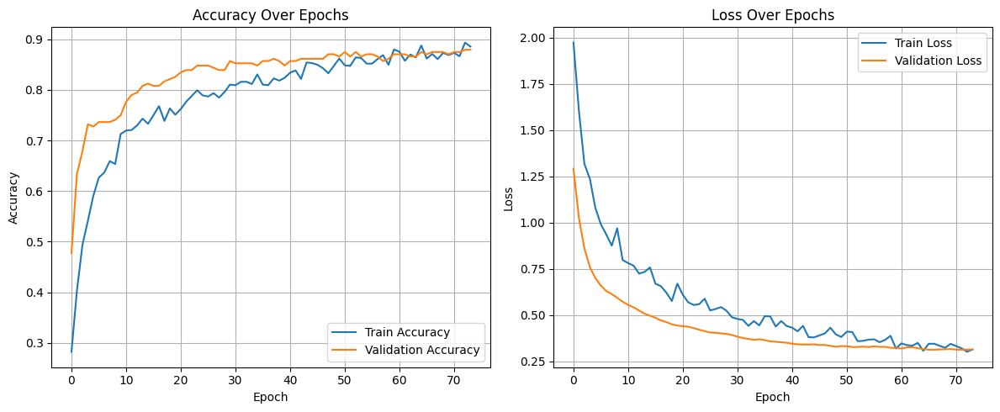

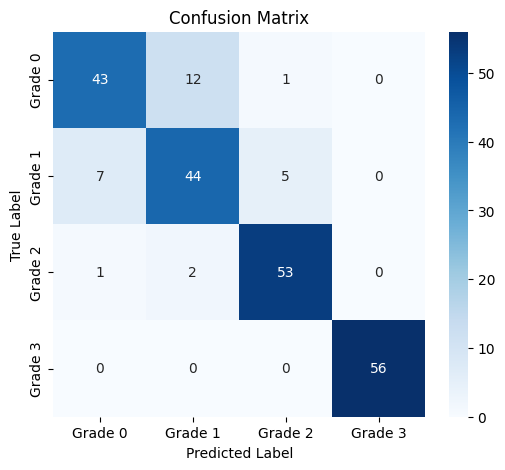

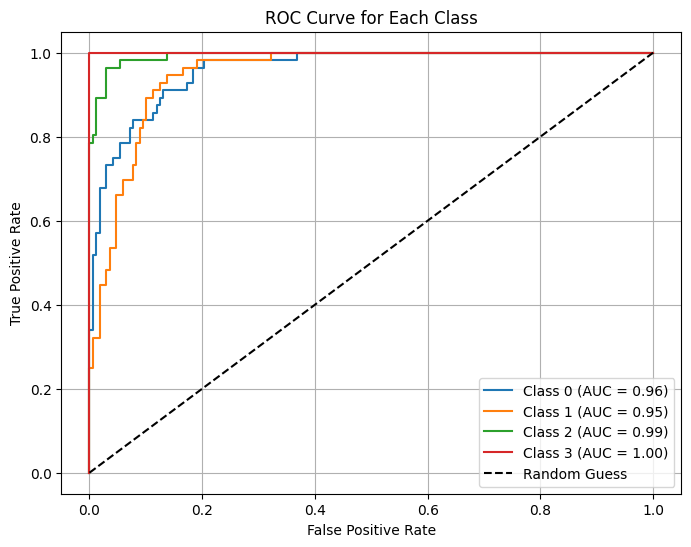

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true_classes, y_pred_classes)
labels = ['Grade 0', 'Grade 1', 'Grade 2', 'Grade 3']

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

y_val_bin = label_binarize(y_true_classes, classes=[0, 1, 2, 3])
y_pred_bin = y_pred

fpr = {}
tpr = {}
roc_auc = {}
n_classes = 4

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_pred_bin[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.title('ROC Curve for Each Class')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

✅ بارگذاری و پیش‌پردازش تصاویر...


 27%|██▋       | 162/608 [00:03<00:10, 44.02it/s]

❌ خطا در بارگذاری تصویر: /content/drive/MyDrive/train/malignant/p1 .jpg


100%|██████████| 608/608 [00:11<00:00, 53.88it/s]


📦 استخراج ویژگی‌ها با DenseNet201...
19/19 ━━━━━━━━━━━━━━━━━━━━ 255s 13s/step

🔁 Fold 1/5
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 133ms/step - accuracy: 0.1848 - loss: 1.8289 - val_accuracy: 0.3125 - val_loss: 1.4487 - learning_rate: 2.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.3264 - loss: 1.6300 - val_accuracy: 0.4509 - val_loss: 1.1996 - learning_rate: 2.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - accuracy: 0.3915 - loss: 1.3799 - val_accuracy: 0.6027 - val_loss: 1.0153 - learning_rate: 2.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.4859 - loss: 1.2211 - val_accuracy: 0.6562 - val_loss: 0.8860 - learning_rate: 2.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.5289 - loss: 1.1179 - val_accuracy: 0.7188 - val_loss: 0.7958 - learning_rate: 2.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.5862 - loss: 0.9968 - val_accuracy: 0.7188 - val_loss: 0.7313 -

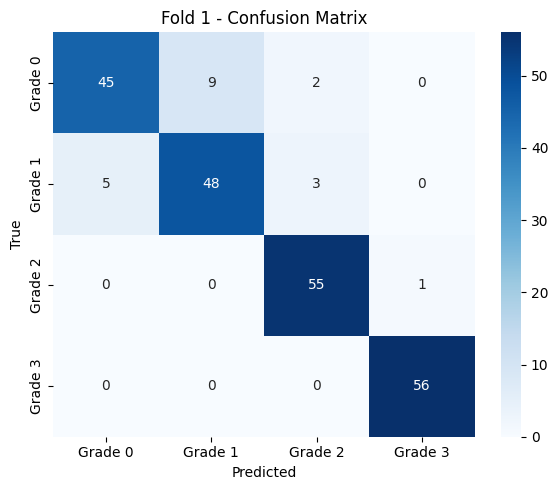

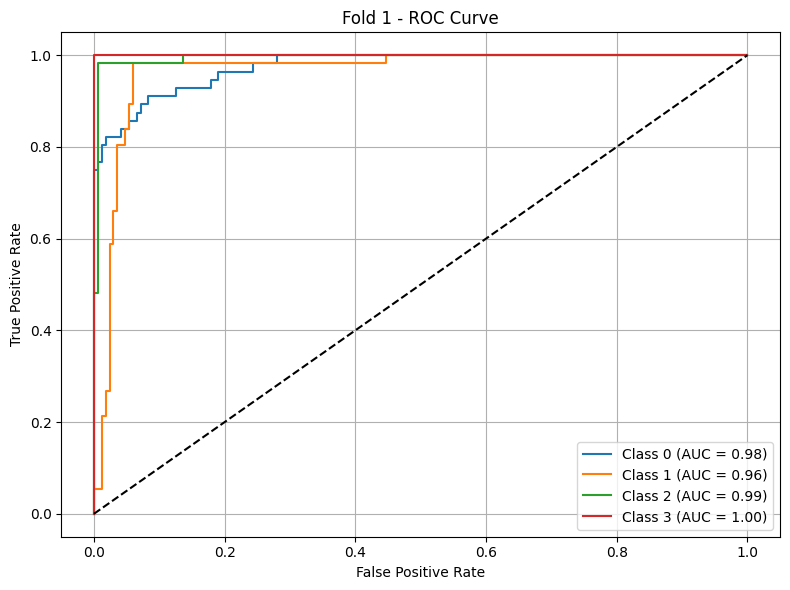


🔁 Fold 2/5
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.2469 - loss: 1.8092 - val_accuracy: 0.2422 - val_loss: 1.5924 - learning_rate: 2.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.3194 - loss: 1.5729 - val_accuracy: 0.3363 - val_loss: 1.2262 - learning_rate: 2.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.4334 - loss: 1.3692 - val_accuracy: 0.6413 - val_loss: 1.0091 - learning_rate: 2.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.5103 - loss: 1.2417 - val_accuracy: 0.6996 - val_loss: 0.8785 - learning_rate: 2.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.5393 - loss: 1.1725 - val_accuracy: 0.7399 - val_loss: 0.7908 - learning_rate: 2.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.5644 - loss: 1.0830 - val_accuracy: 0.7489 - val_loss: 0.7304 - learning_rate: 2.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step 

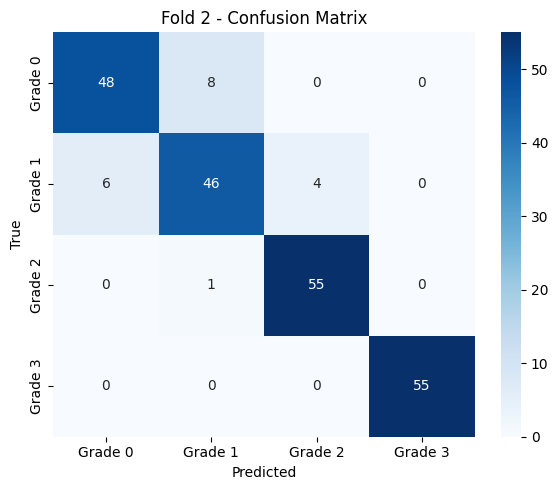

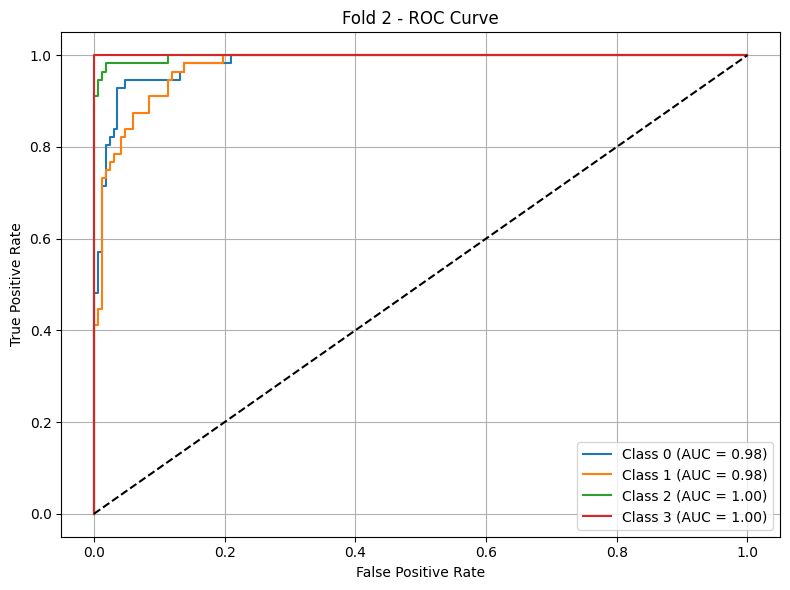


🔁 Fold 3/5
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.3115 - loss: 1.7293 - val_accuracy: 0.3094 - val_loss: 1.5097 - learning_rate: 2.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - accuracy: 0.3358 - loss: 1.6353 - val_accuracy: 0.4709 - val_loss: 1.1690 - learning_rate: 2.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.4636 - loss: 1.3101 - val_accuracy: 0.6188 - val_loss: 0.9722 - learning_rate: 2.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.4813 - loss: 1.2118 - val_accuracy: 0.6861 - val_loss: 0.8550 - learning_rate: 2.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.5402 - loss: 1.0889 - val_accuracy: 0.7130 - val_loss: 0.7812 - learning_rate: 2.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.5625 - loss: 1.0788 - val_accuracy: 0.7309 - val_loss: 0.7294 - learning_rate: 2.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step 

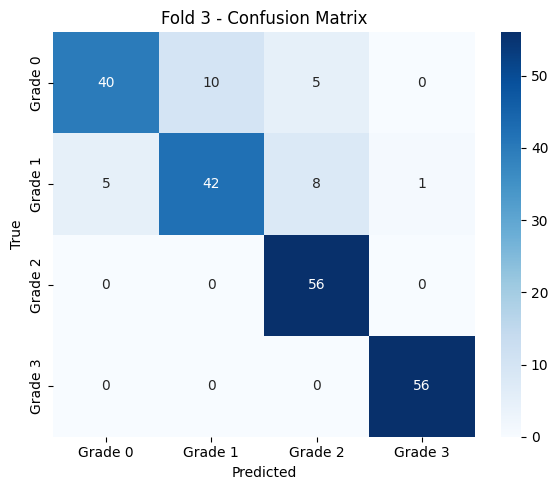

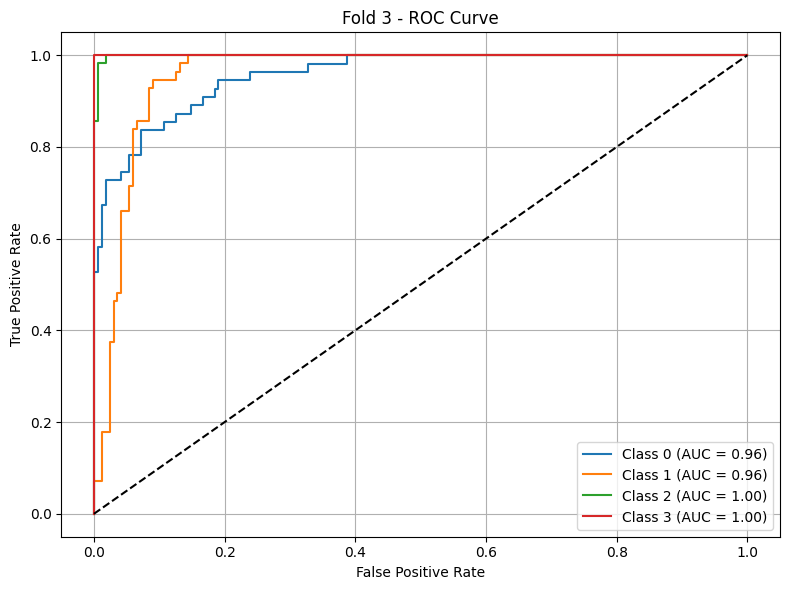


🔁 Fold 4/5
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.3048 - loss: 1.7877 - val_accuracy: 0.3632 - val_loss: 1.4901 - learning_rate: 2.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.3490 - loss: 1.5643 - val_accuracy: 0.4843 - val_loss: 1.2089 - learning_rate: 2.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.4233 - loss: 1.3943 - val_accuracy: 0.6233 - val_loss: 1.0287 - learning_rate: 2.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.4666 - loss: 1.2098 - val_accuracy: 0.6951 - val_loss: 0.9125 - learning_rate: 2.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.5074 - loss: 1.1744 - val_accuracy: 0.7130 - val_loss: 0.8327 - learning_rate: 2.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - accuracy: 0.6036 - loss: 1.0092 - val_accuracy: 0.7309 - val_loss: 0.7739 - learning_rate: 2.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

📊 Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.80      0.81        56
           1       0.76      0.76      0.76        55
           2       0.98      0.96      0.97        56
           3       0.97      1.00      0.98        56

    accuracy                           0.88       223
   macro avg       0.88      0.88      0.88       223
weighted avg       0.88      0.88      0.88       223



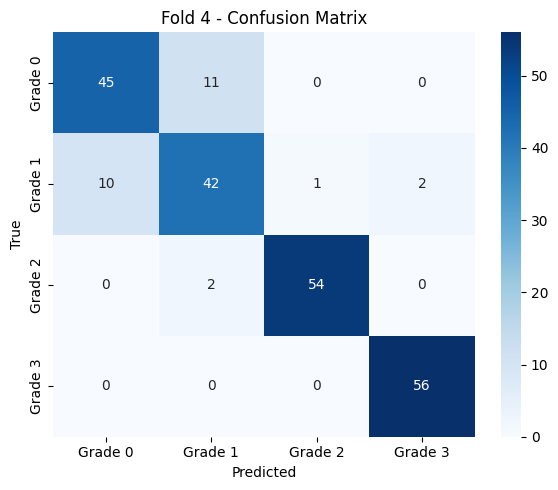

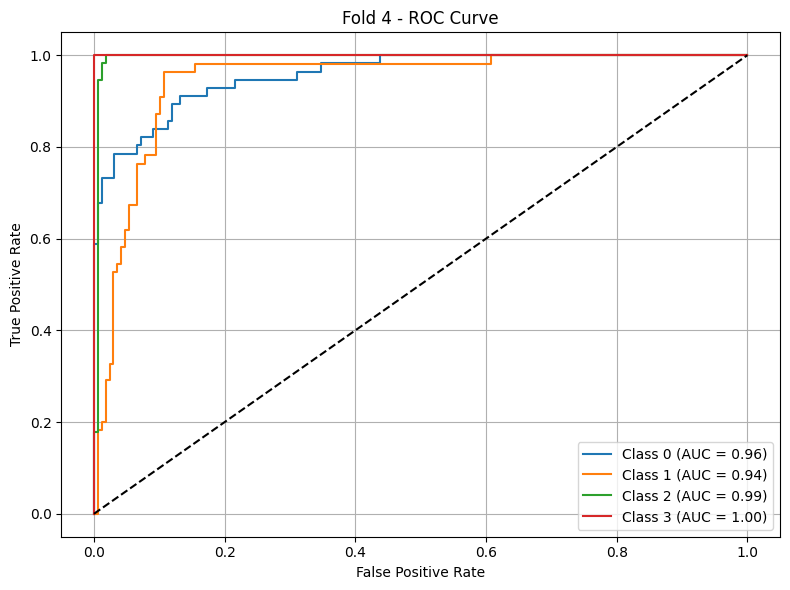


🔁 Fold 5/5
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.2937 - loss: 1.7457 - val_accuracy: 0.3767 - val_loss: 1.3315 - learning_rate: 2.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.3578 - loss: 1.5098 - val_accuracy: 0.5067 - val_loss: 1.1039 - learning_rate: 2.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - accuracy: 0.4384 - loss: 1.3108 - val_accuracy: 0.6188 - val_loss: 0.9517 - learning_rate: 2.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.5383 - loss: 1.1490 - val_accuracy: 0.6502 - val_loss: 0.8416 - learning_rate: 2.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.5570 - loss: 1.1148 - val_accuracy: 0.6906 - val_loss: 0.7649 - learning_rate: 2.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.5987 - loss: 0.9941 - val_accuracy: 0.7220 - val_loss: 0.7085 - learning_rate: 2.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

📊 Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.89      0.83        56
           1       0.85      0.70      0.76        56
           2       0.95      0.96      0.95        55
           3       0.98      1.00      0.99        56

    accuracy                           0.89       223
   macro avg       0.89      0.89      0.89       223
weighted avg       0.89      0.89      0.89       223



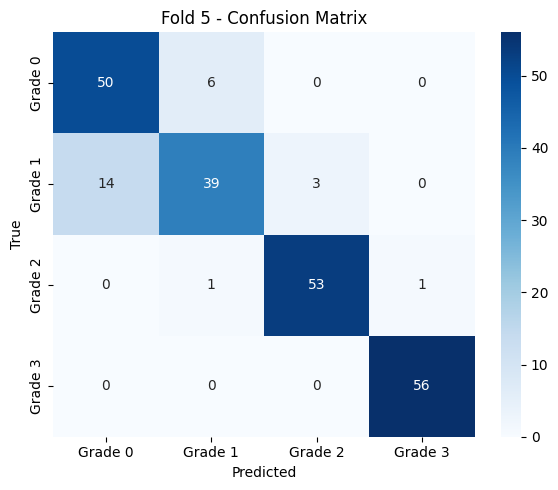

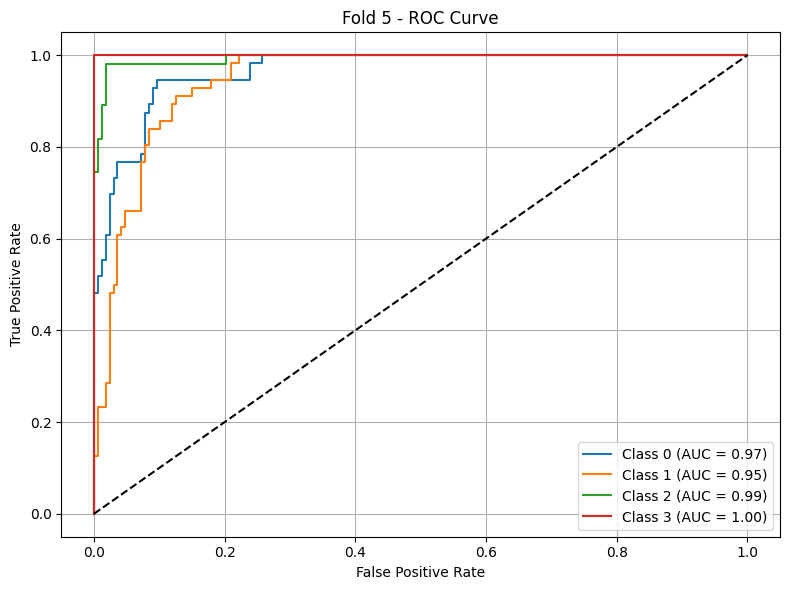


🔚 Cross-Validation Summary:
✅ Average Accuracy: 0.8934 ± 0.0170
✅ Average Loss: 0.2837 ± 0.0373


In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import SMOTE
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

train_df = pd.read_excel('/content/train_with_malignancy_grade.xlsx')
val_df = pd.read_excel('/content/validation_with_malignancy_grade.xlsx')

train_df = train_df[~train_df['malignancy_grade'].isna()]
val_df = val_df[~val_df['malignancy_grade'].isna()]
train_df['malignancy_grade'] = train_df['malignancy_grade'].astype(int)
val_df['malignancy_grade'] = val_df['malignancy_grade'].astype(int)

all_df = pd.concat([train_df, val_df], ignore_index=True)
all_labels = all_df['malignancy_grade'].values
all_paths = all_df['image_path'].values

def load_and_preprocess_image(path):
    try:
        img = load_img(path, target_size=(224, 224))
        img_array = img_to_array(img)
        img_array = tf.keras.applications.densenet.preprocess_input(img_array)
        return img_array
    except:
        print(f"❌ خطا در بارگذاری تصویر: {path}")
        return None

print("✅ بارگذاری و پیش‌پردازش تصاویر...")
images, valid_labels = [], []
for path, label in tqdm(zip(all_paths, all_labels), total=len(all_paths)):
    img = load_and_preprocess_image(path)
    if img is not None:
        images.append(img)
        valid_labels.append(label)

images = np.array(images)
labels = np.array(valid_labels)

print("📦 استخراج ویژگی‌ها با DenseNet201...")
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
features = base_model.predict(images, verbose=1)

X_flat = features.reshape(features.shape[0], -1)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_flat, labels)

y_resampled_cat = to_categorical(y_resampled, num_classes=4)
X_resampled = X_resampled.reshape(-1, 7, 7, 1920)

NUM_FOLDS = 5
EPOCHS = 100
BATCH_SIZE = 32
N_CLASSES = 4
fold_no = 1

all_fold_acc = []
all_fold_loss = []

skf = StratifiedKFold(n_splits=NUM_FOLDS, shuffle=True, random_state=42)

for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{NUM_FOLDS}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled_cat[train_idx], y_resampled_cat[val_idx]
    y_val_labels = y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_resampled), y=y_resampled[train_idx])
    class_weights_dict = {i: w for i, w in enumerate(class_weights)}

    model = models.Sequential([
        layers.Input(shape=(7, 7, 1920)),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.4),
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.1),
        layers.Dropout(0.3),
        layers.Dense(N_CLASSES, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=2e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7),
        ModelCheckpoint(f'model_densenet_fold_{fold_no}.keras', monitor='val_accuracy', save_best_only=True)
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=EPOCHS,
        batch_size=BATCH_SIZE,
        class_weight=class_weights_dict,
        callbacks=callbacks,
        verbose=1
    )

    val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
    all_fold_acc.append(val_acc)
    all_fold_loss.append(val_loss)
    print(f"✅ Fold {fold_no} Accuracy: {val_acc:.4f} | Loss: {val_loss:.4f}")

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)

    print("\n📊 Classification Report:")
    print(classification_report(y_val_labels, y_pred_classes))

    cm = confusion_matrix(y_val_labels, y_pred_classes)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[f'Grade {i}' for i in range(N_CLASSES)],
                yticklabels=[f'Grade {i}' for i in range(N_CLASSES)])
    plt.title(f'Fold {fold_no} - Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.show()

    y_val_bin = label_binarize(y_val_labels, classes=list(range(N_CLASSES)))
    plt.figure(figsize=(8, 6))
    for i in range(N_CLASSES):
        fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_pred[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f'Fold {fold_no} - ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    fold_no += 1

print("\n🔚 Cross-Validation Summary:")
print(f"✅ Average Accuracy: {np.mean(all_fold_acc):.4f} ± {np.std(all_fold_acc):.4f}")
print(f"✅ Average Loss: {np.mean(all_fold_loss):.4f} ± {np.std(all_fold_loss):.4f}")

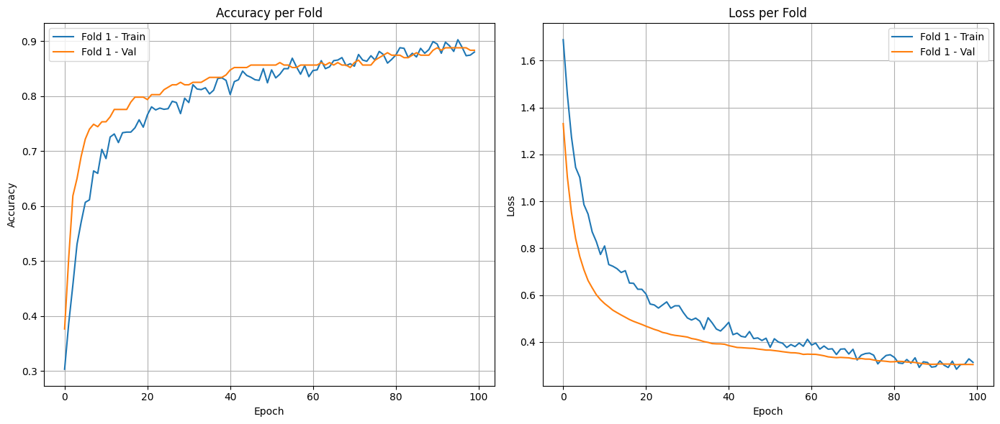

In [ ]:
all_history_acc = []
all_history_val_acc = []
all_history_loss = []
all_history_val_loss = []
history_acc = history.history['accuracy']
history_val_acc = history.history['val_accuracy']
history_loss = history.history['loss']
history_val_loss = history.history['val_loss']

all_history_acc.append(history_acc)
all_history_val_acc.append(history_val_acc)
all_history_loss.append(history_loss)
all_history_val_loss.append(history_val_loss)

max_epochs = max(len(h) for h in all_history_acc)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
for i, acc in enumerate(all_history_acc):
    plt.plot(acc, label=f'Fold {i+1} - Train')
for i, val_acc in enumerate(all_history_val_acc):
    plt.plot(val_acc, label=f'Fold {i+1} - Val')
plt.title('Accuracy per Fold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
for i, loss in enumerate(all_history_loss):
    plt.plot(loss, label=f'Fold {i+1} - Train')
for i, val_loss in enumerate(all_history_val_loss):
    plt.plot(val_loss, label=f'Fold {i+1} - Val')
plt.title('Loss per Fold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


🔁 Fold 1/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 94ms/step - accuracy: 0.2605 - loss: 1.8853 - val_accuracy: 0.3214 - val_loss: 1.6924 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.3579 - loss: 1.6835 - val_accuracy: 0.4509 - val_loss: 1.3808 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.3680 - loss: 1.5611 - val_accuracy: 0.5089 - val_loss: 1.1826 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.4276 - loss: 1.3657 - val_accuracy: 0.5982 - val_loss: 1.0371 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.4475 - loss: 1.3704 - val_accuracy: 0.6384 - val_loss: 0.9369 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.4907 - loss: 1.2335 - val_accuracy: 0.6518 - val_loss: 0.8629 - learning_rate: 2.0000e-05
Epoch 7/150

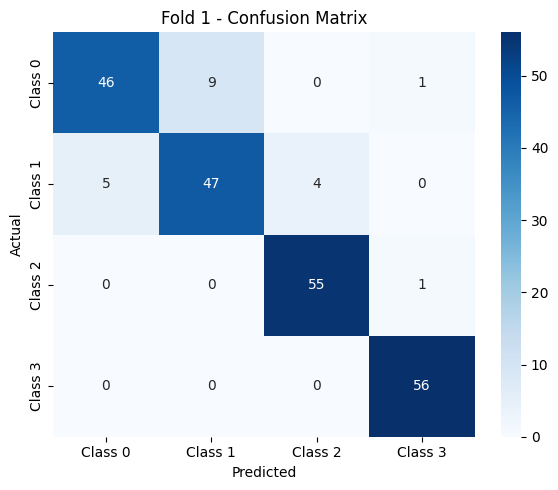

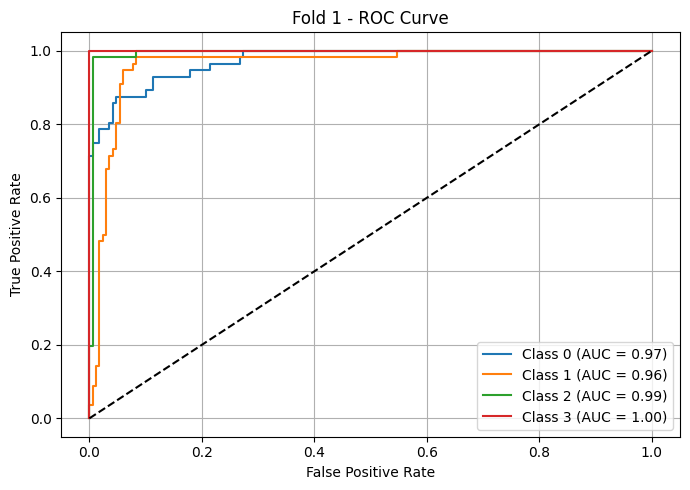

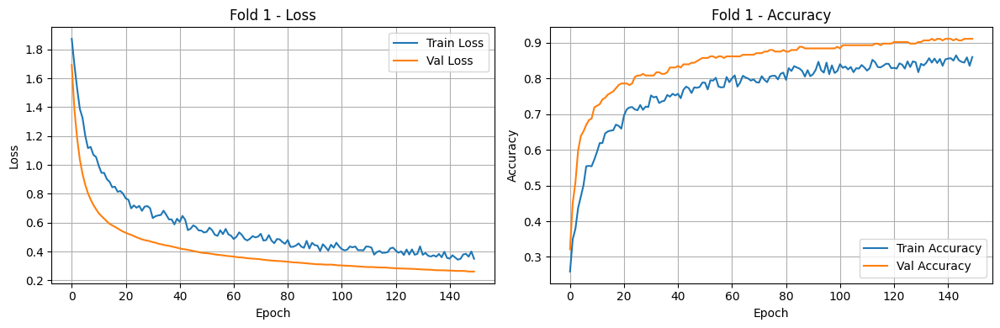


🔁 Fold 2/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.2873 - loss: 1.7429 - val_accuracy: 0.5112 - val_loss: 1.2105 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.3283 - loss: 1.5757 - val_accuracy: 0.5740 - val_loss: 1.0538 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - accuracy: 0.4282 - loss: 1.4205 - val_accuracy: 0.6278 - val_loss: 0.9440 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.4930 - loss: 1.2856 - val_accuracy: 0.6502 - val_loss: 0.8640 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - accuracy: 0.4869 - loss: 1.2852 - val_accuracy: 0.6951 - val_loss: 0.7985 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.5278 - loss: 1.1267 - val_accuracy: 0.7265 - val_loss: 0.7461 - learning_rate: 2.0000e-05
Epoch 7/150

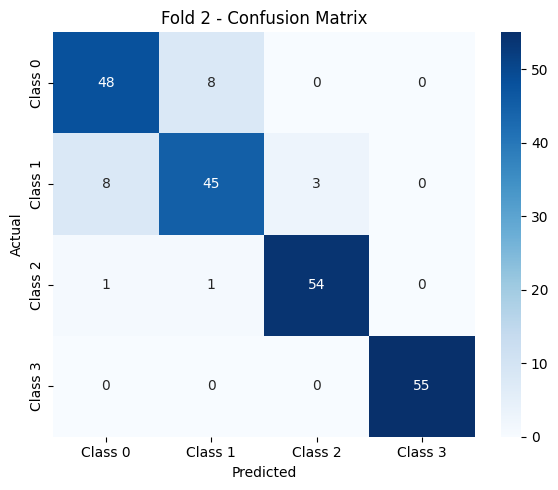

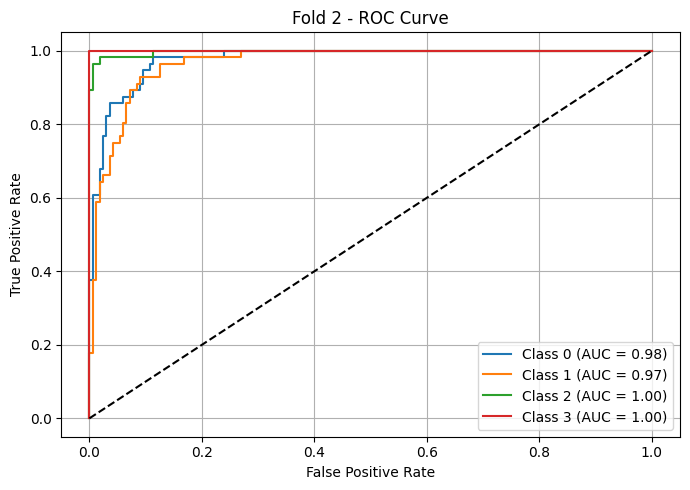

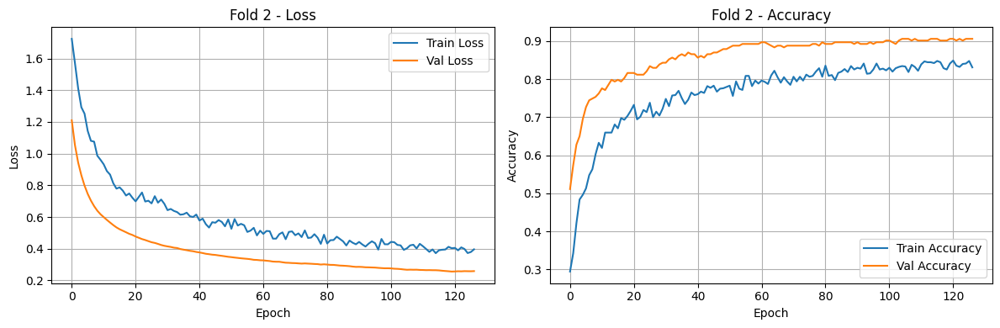


🔁 Fold 3/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.2985 - loss: 1.8515 - val_accuracy: 0.2735 - val_loss: 1.4515 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy: 0.2722 - loss: 1.7266 - val_accuracy: 0.3901 - val_loss: 1.2527 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.3562 - loss: 1.4529 - val_accuracy: 0.4709 - val_loss: 1.1154 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.3841 - loss: 1.4266 - val_accuracy: 0.5291 - val_loss: 1.0045 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.4583 - loss: 1.2996 - val_accuracy: 0.6009 - val_loss: 0.9238 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.5236 - loss: 1.1174 - val_accuracy: 0.6143 - val_loss: 0.8587 - learning_rate: 2.0000e-05
Epoch 7/150

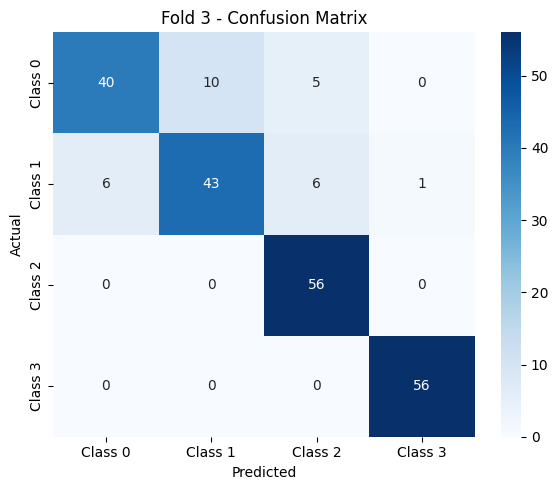

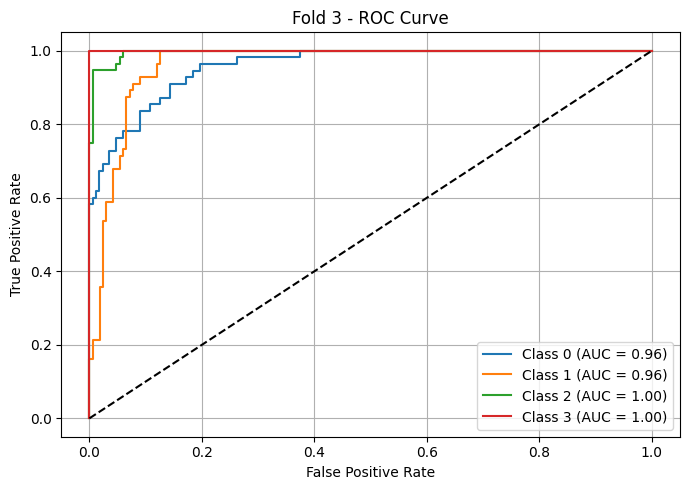

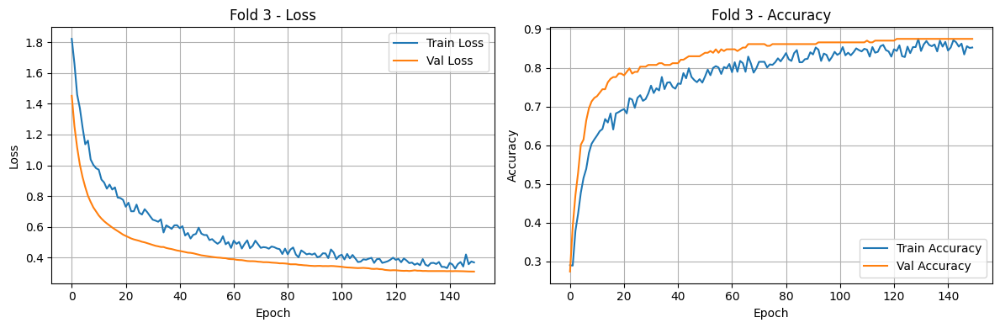


🔁 Fold 4/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.2415 - loss: 1.8749 - val_accuracy: 0.2287 - val_loss: 1.6068 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.2858 - loss: 1.7381 - val_accuracy: 0.3318 - val_loss: 1.3269 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - accuracy: 0.3222 - loss: 1.5294 - val_accuracy: 0.4619 - val_loss: 1.1343 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - accuracy: 0.4127 - loss: 1.3884 - val_accuracy: 0.5874 - val_loss: 1.0078 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - accuracy: 0.4934 - loss: 1.2204 - val_accuracy: 0.6592 - val_loss: 0.9173 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - accuracy: 0.5370 - loss: 1.1524 - val_accuracy: 0.6861 - val_loss: 0.8525 - learning_rate: 2.0000e-05
Epoch 7/150

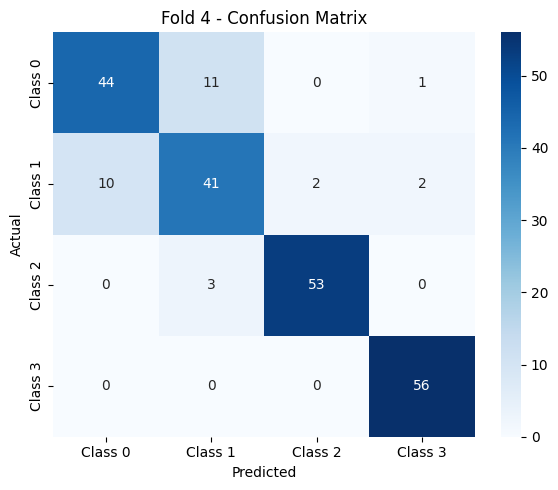

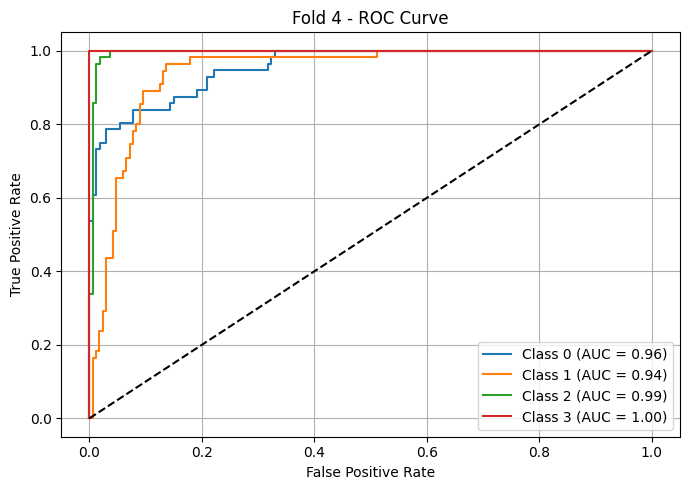

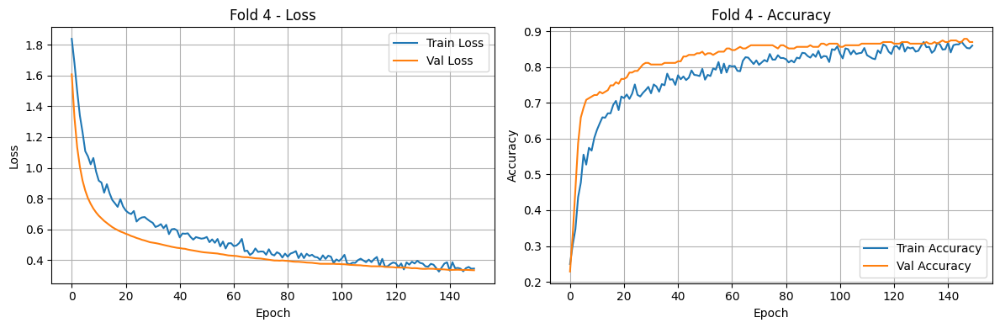


🔁 Fold 5/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - accuracy: 0.2116 - loss: 1.8883 - val_accuracy: 0.3139 - val_loss: 1.6131 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.2731 - loss: 1.7496 - val_accuracy: 0.4260 - val_loss: 1.2942 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - accuracy: 0.3542 - loss: 1.5908 - val_accuracy: 0.5650 - val_loss: 1.1004 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - accuracy: 0.4051 - loss: 1.4807 - val_accuracy: 0.6592 - val_loss: 0.9718 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - accuracy: 0.4330 - loss: 1.3324 - val_accuracy: 0.7175 - val_loss: 0.8807 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.4482 - loss: 1.2909 - val_accuracy: 0.7623 - val_loss: 0.8119 - learning_rate: 2.0000e-05
Epoch 7/150

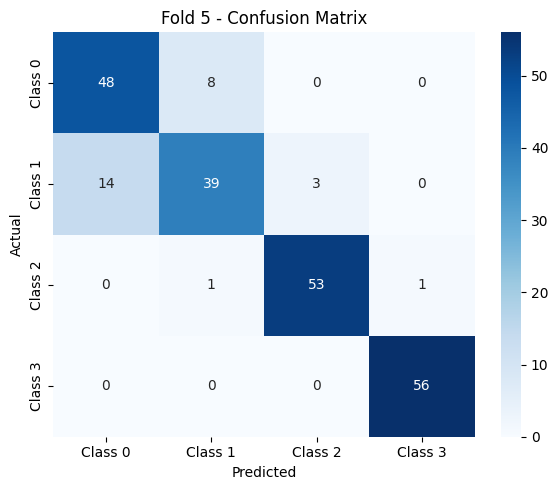

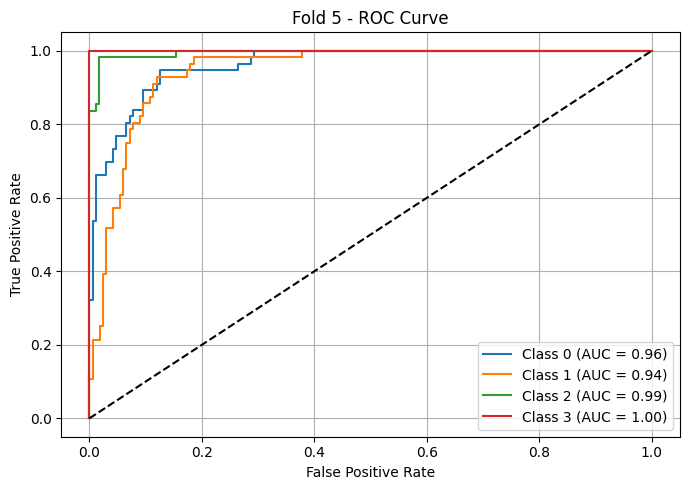

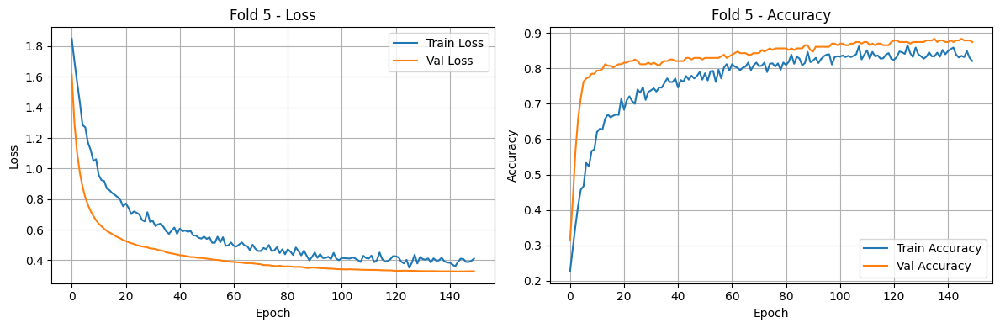

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import label_binarize
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import models, layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

n_splits = 5
n_classes = 4
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

y_resampled_cat = to_categorical(y_resampled, num_classes=n_classes)

fold_no = 1

for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{n_splits} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled_cat[train_idx], y_resampled_cat[val_idx]
    y_val_labels = y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_resampled), y=y_resampled[train_idx])
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
        layers.Input(shape=(7, 7, 1920)),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.5),
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.1),
        layers.Dropout(0.4),
        layers.Dense(n_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=2e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7),
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=1
    )

    y_pred = model.predict(X_val, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)

    print("\n📊 Classification Report:\n", classification_report(y_val_labels, y_pred_classes))

    cm = confusion_matrix(y_val_labels, y_pred_classes)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[f'Class {i}' for i in range(n_classes)],
                yticklabels=[f'Class {i}' for i in range(n_classes)])
    plt.title(f'Fold {fold_no} - Confusion Matrix')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    y_val_bin = label_binarize(y_val_labels, classes=list(range(n_classes)))
    plt.figure(figsize=(7, 5))
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_pred[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"Fold {fold_no} - ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold_no} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    fold_no += 1


🔁 Fold 1/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - accuracy: 0.3438 - loss: 1.6396 - val_accuracy: 0.5045 - val_loss: 1.0505 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - accuracy: 0.5655 - loss: 1.0234 - val_accuracy: 0.6920 - val_loss: 0.7684 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - accuracy: 0.7181 - loss: 0.7954 - val_accuracy: 0.7366 - val_loss: 0.6269 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - accuracy: 0.7523 - loss: 0.6688 - val_accuracy: 0.7991 - val_loss: 0.5303 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7655 - loss: 0.5986 - val_accuracy: 0.8393 - val_loss: 0.4738 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - accuracy: 0.7686 - loss: 0.5602 - val_accuracy: 0.8661 - val_loss: 0.4303 - learning_rate: 2.0000e-05
Epoch 7/

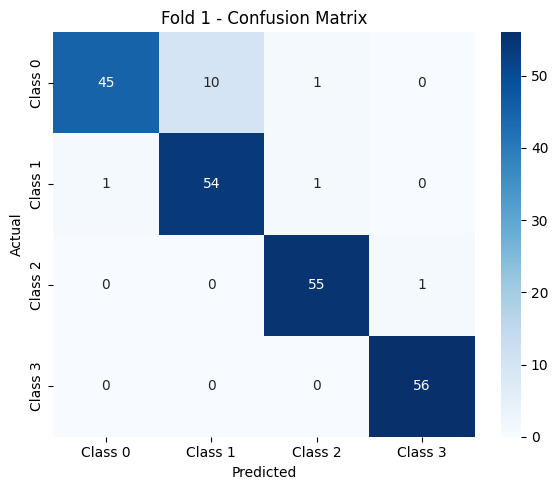

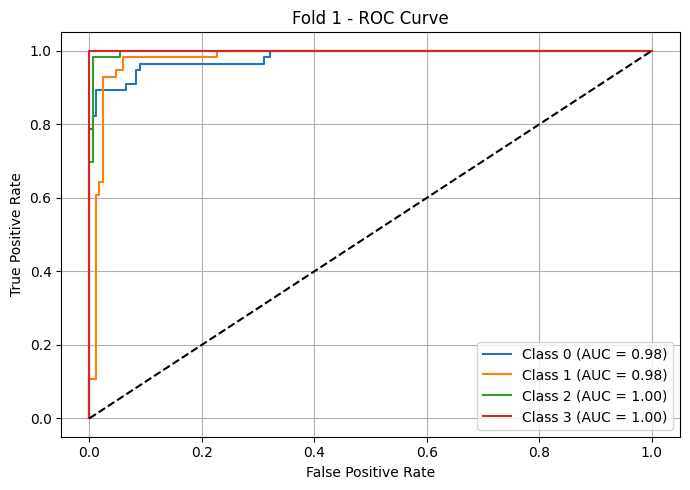

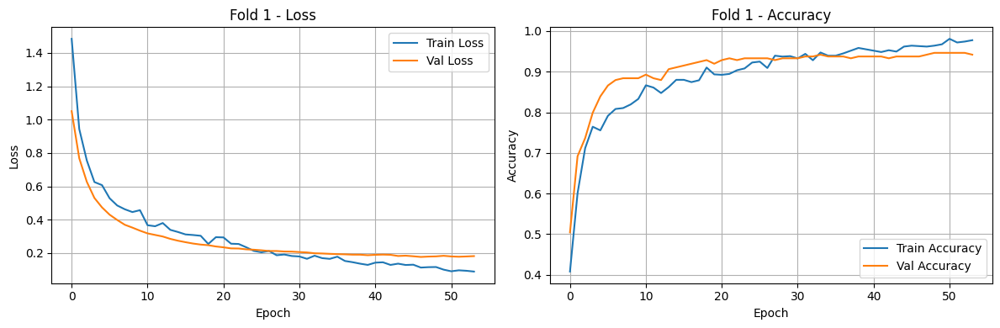


🔁 Fold 2/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - accuracy: 0.3262 - loss: 1.6344 - val_accuracy: 0.5202 - val_loss: 1.0641 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - accuracy: 0.5992 - loss: 1.0012 - val_accuracy: 0.7489 - val_loss: 0.7814 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.6931 - loss: 0.7963 - val_accuracy: 0.7578 - val_loss: 0.6336 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.7284 - loss: 0.7022 - val_accuracy: 0.7892 - val_loss: 0.5450 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.7599 - loss: 0.6084 - val_accuracy: 0.8161 - val_loss: 0.4824 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.7619 - loss: 0.5746 - val_accuracy: 0.8520 - val_loss: 0.4336 - learning_rate: 2.0000e-05
Epoch 7/15

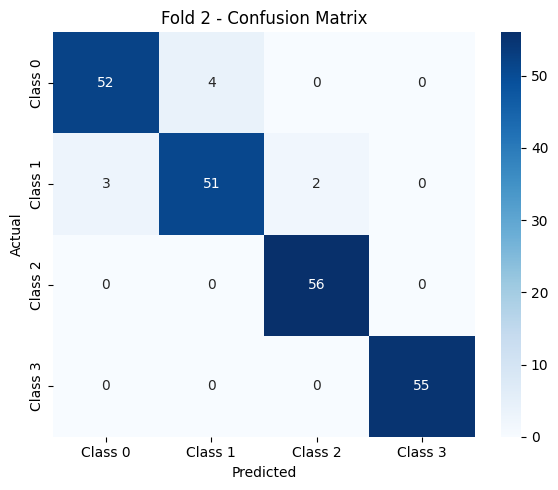

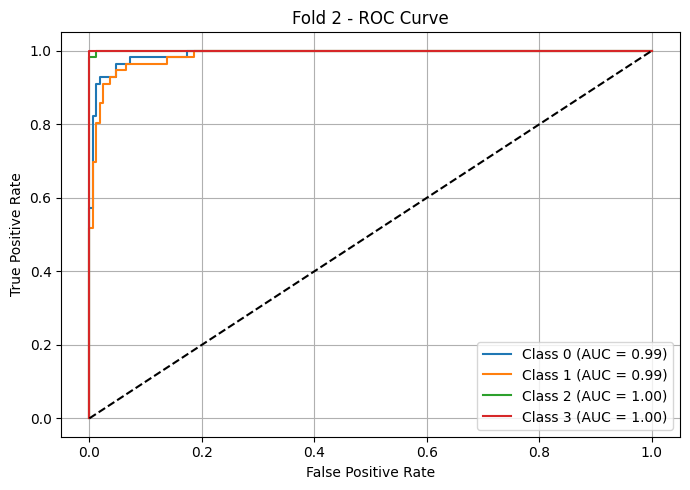

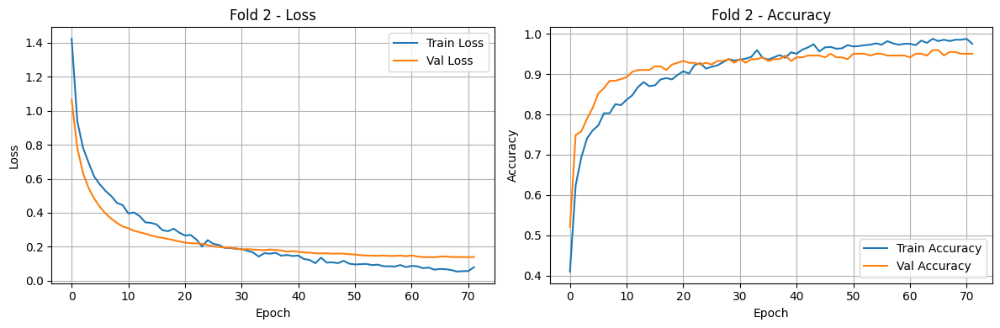


🔁 Fold 3/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.3323 - loss: 1.7461 - val_accuracy: 0.4529 - val_loss: 1.1575 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.5349 - loss: 1.0841 - val_accuracy: 0.6368 - val_loss: 0.8630 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.6999 - loss: 0.7345 - val_accuracy: 0.7444 - val_loss: 0.6946 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.7245 - loss: 0.6634 - val_accuracy: 0.7803 - val_loss: 0.5917 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - accuracy: 0.7701 - loss: 0.5622 - val_accuracy: 0.7982 - val_loss: 0.5231 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.8161 - loss: 0.4933 - val_accuracy: 0.8161 - val_loss: 0.4870 - learning_rate: 2.0000e-05
Epoch 7/150

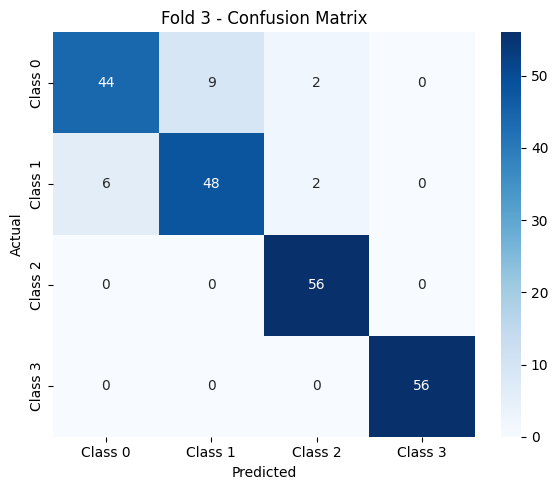

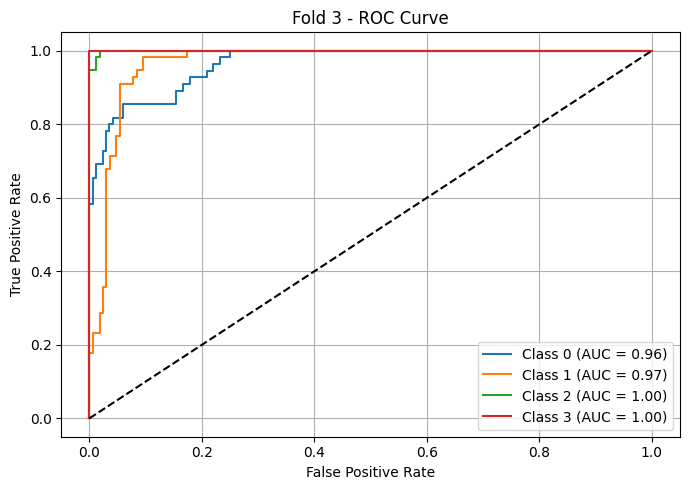

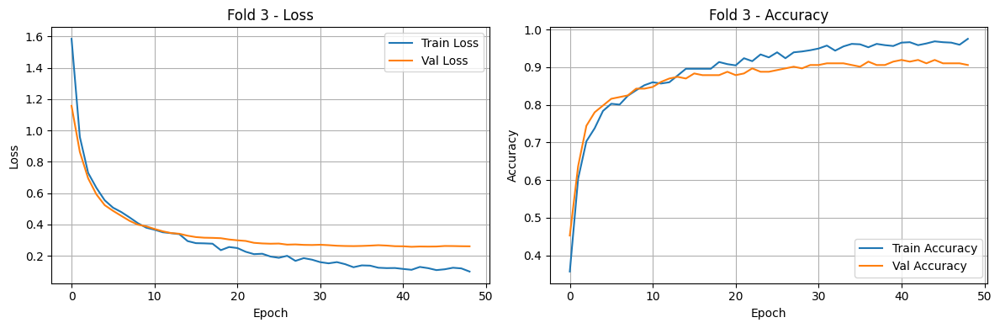


🔁 Fold 4/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 0.3216 - loss: 1.8845 - val_accuracy: 0.5695 - val_loss: 1.0287 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5310 - loss: 1.0832 - val_accuracy: 0.7354 - val_loss: 0.7662 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.6735 - loss: 0.8090 - val_accuracy: 0.7578 - val_loss: 0.6486 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - accuracy: 0.7262 - loss: 0.7092 - val_accuracy: 0.7848 - val_loss: 0.5840 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7235 - loss: 0.6749 - val_accuracy: 0.8072 - val_loss: 0.5417 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7459 - loss: 0.6631 - val_accuracy: 0.8027 - val_loss: 0.5132 - learning_rate: 2.0000e-05
Epoch 7/15

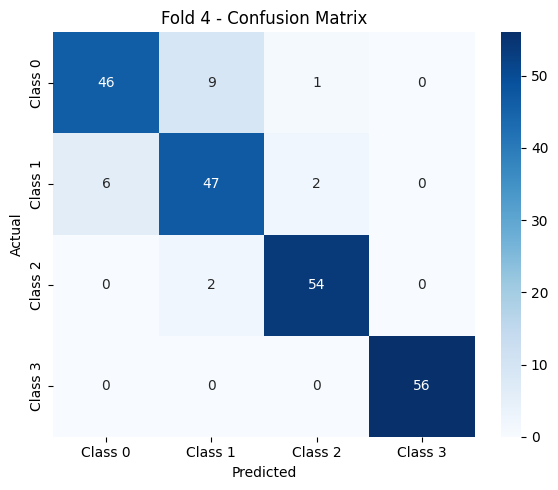

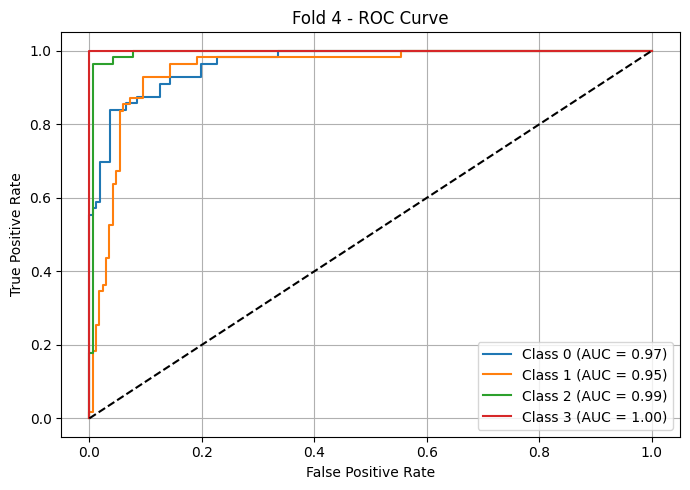

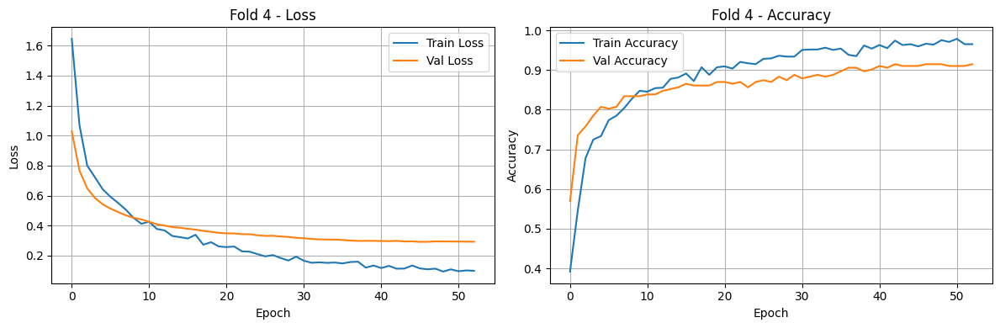


🔁 Fold 5/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - accuracy: 0.3752 - loss: 1.5235 - val_accuracy: 0.6682 - val_loss: 0.9647 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - accuracy: 0.6014 - loss: 0.9508 - val_accuracy: 0.7309 - val_loss: 0.7227 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.7023 - loss: 0.7731 - val_accuracy: 0.7489 - val_loss: 0.6122 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.6981 - loss: 0.7402 - val_accuracy: 0.7803 - val_loss: 0.5371 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.7731 - loss: 0.6199 - val_accuracy: 0.7982 - val_loss: 0.4905 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.8010 - loss: 0.5528 - val_accuracy: 0.8296 - val_loss: 0.4404 - learning_rate: 2.0000e-05
Epoch 7/150

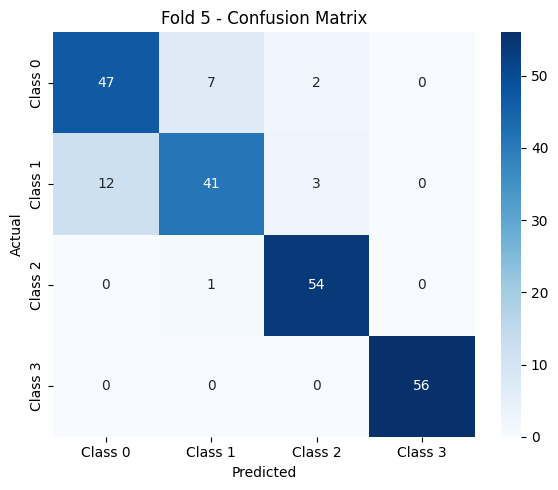

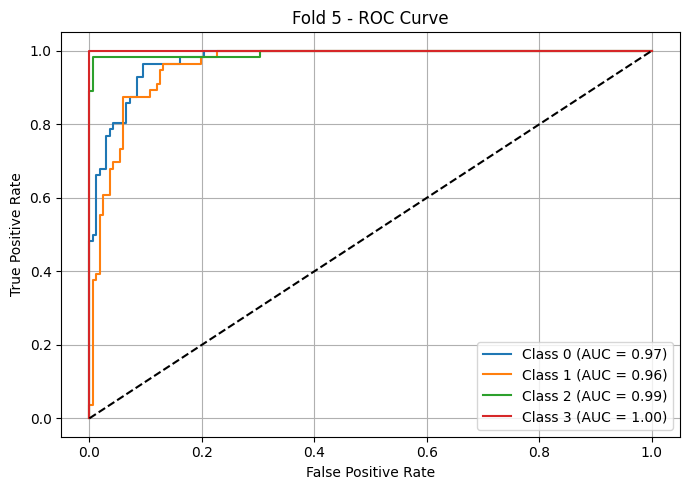

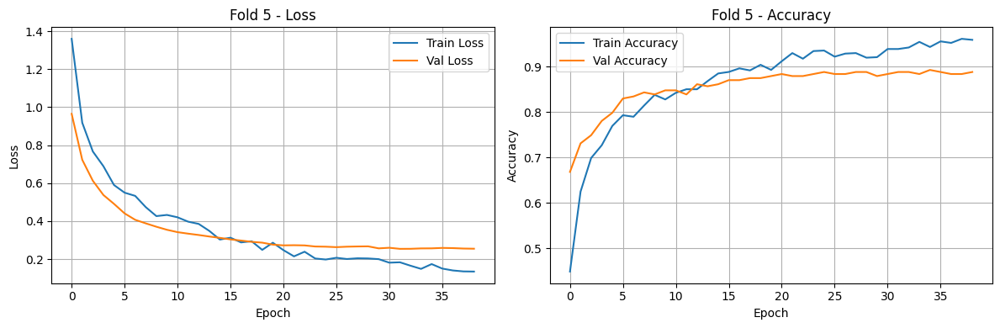

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import label_binarize
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import models, layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

n_splits = 5
n_classes = 4
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

y_resampled_cat = to_categorical(y_resampled, num_classes=n_classes)

fold_no = 1

for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{n_splits} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled_cat[train_idx], y_resampled_cat[val_idx]
    y_val_labels = y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_resampled), y=y_resampled[train_idx])
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dense(1024),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.4),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(n_classes, activation='softmax')
])

    model.compile(
        optimizer=Adam(learning_rate=2e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7),
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=1
    )

    y_pred = model.predict(X_val, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)

    print("\n📊 Classification Report:\n", classification_report(y_val_labels, y_pred_classes))

    cm = confusion_matrix(y_val_labels, y_pred_classes)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[f'Class {i}' for i in range(n_classes)],
                yticklabels=[f'Class {i}' for i in range(n_classes)])
    plt.title(f'Fold {fold_no} - Confusion Matrix')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    y_val_bin = label_binarize(y_val_labels, classes=list(range(n_classes)))
    plt.figure(figsize=(7, 5))
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_pred[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"Fold {fold_no} - ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold_no} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    fold_no += 1

✅ بارگذاری و پیش‌پردازش تصاویر...


 25%|██▌       | 155/608 [01:20<03:28,  2.18it/s]

❌ خطا در بارگذاری تصویر: /content/drive/MyDrive/train/malignant/p1 .jpg


100%|██████████| 608/608 [05:01<00:00,  2.02it/s]


📦 استخراج ویژگی‌ها با DenseNet201...
74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step

🔁 Fold 1/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - accuracy: 0.4378 - loss: 1.3781 - val_accuracy: 0.6741 - val_loss: 0.9185 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6180 - loss: 0.9853 - val_accuracy: 0.7009 - val_loss: 0.7287 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6938 - loss: 0.7648 - val_accuracy: 0.7545 - val_loss: 0.6177 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7378 - loss: 0.6865 - val_accuracy: 0.7946 - val_loss: 0.5546 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.7582 - loss: 0.5925 - val_accuracy: 0.8348 - val_loss: 0.5014 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 

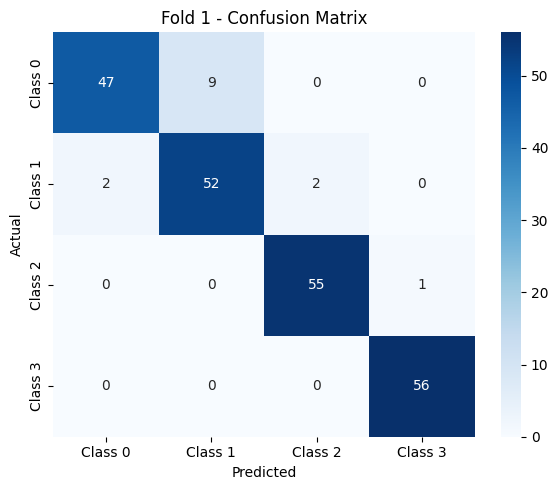

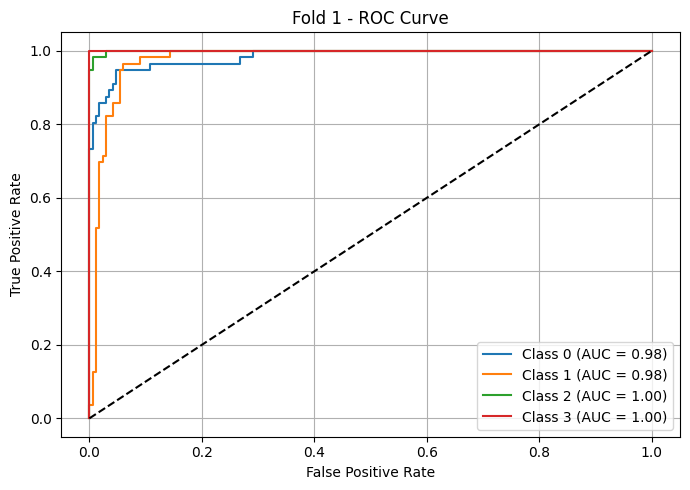

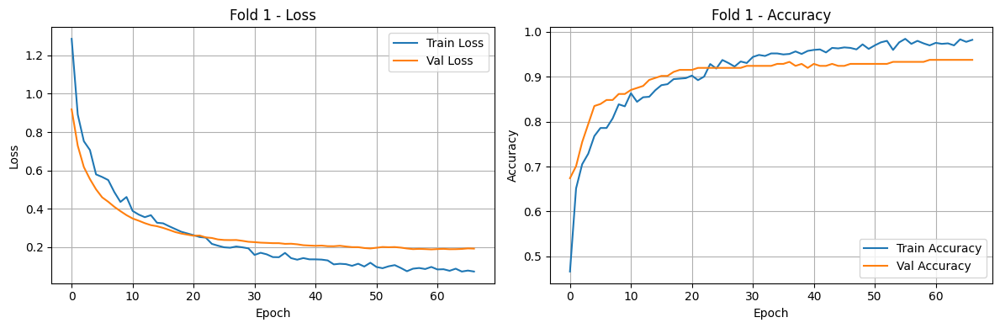


🔁 Fold 2/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 147ms/step - accuracy: 0.3188 - loss: 1.6712 - val_accuracy: 0.5067 - val_loss: 1.1077 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5921 - loss: 1.0201 - val_accuracy: 0.6592 - val_loss: 0.8411 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6821 - loss: 0.8305 - val_accuracy: 0.7130 - val_loss: 0.6936 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7345 - loss: 0.7404 - val_accuracy: 0.7623 - val_loss: 0.5939 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7209 - loss: 0.6785 - val_accuracy: 0.7937 - val_loss: 0.5252 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7643 - loss: 0.6314 - val_accuracy: 0.8251 - val_loss: 0.4736 - learning_rate: 2.0000e-05
Epoch 7/15

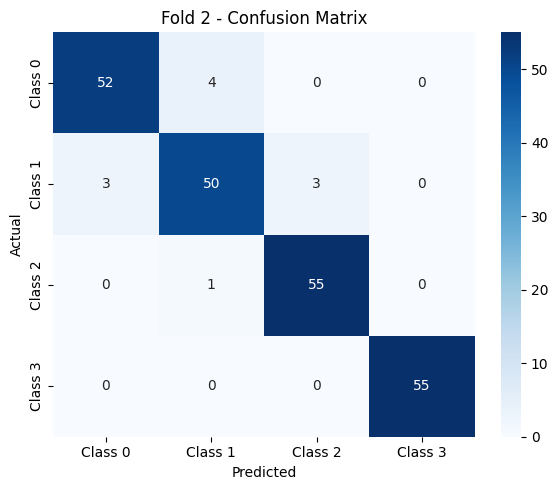

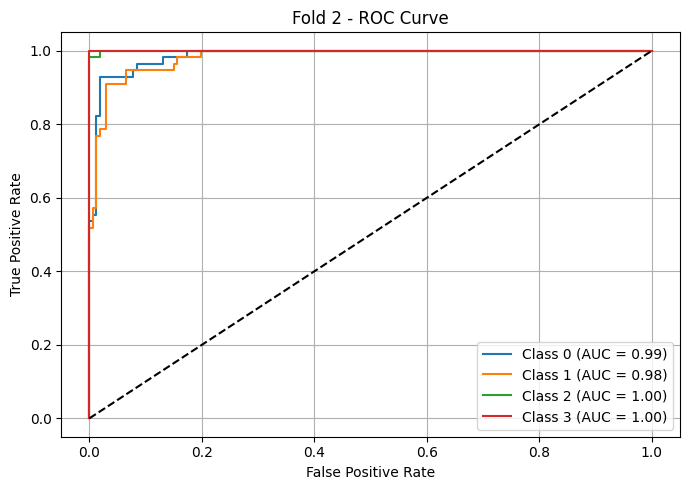

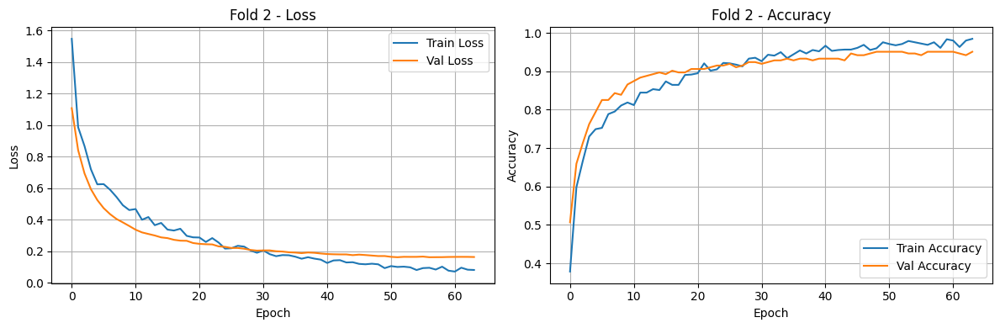


🔁 Fold 3/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 0.3520 - loss: 1.6262 - val_accuracy: 0.5830 - val_loss: 0.9715 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.6036 - loss: 0.9752 - val_accuracy: 0.7758 - val_loss: 0.7211 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.7057 - loss: 0.7830 - val_accuracy: 0.7668 - val_loss: 0.6115 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7607 - loss: 0.6401 - val_accuracy: 0.7668 - val_loss: 0.5488 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7728 - loss: 0.5772 - val_accuracy: 0.7758 - val_loss: 0.4997 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7813 - loss: 0.5980 - val_accuracy: 0.7848 - val_loss: 0.4676 - learning_rate: 2.0000e-05
Epoch 7/15

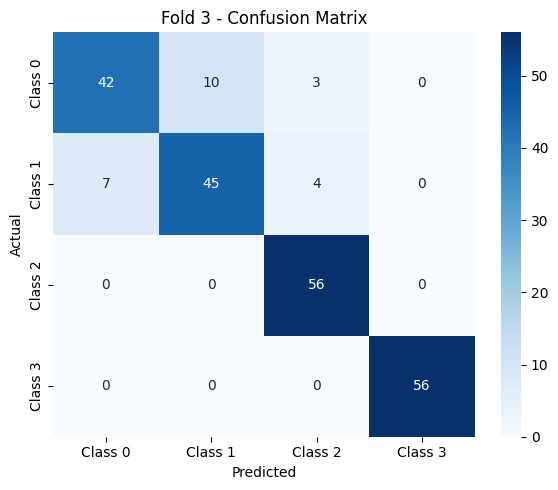

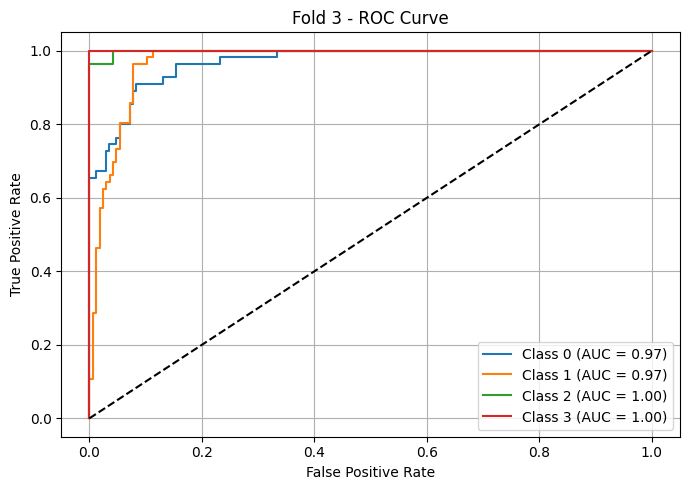

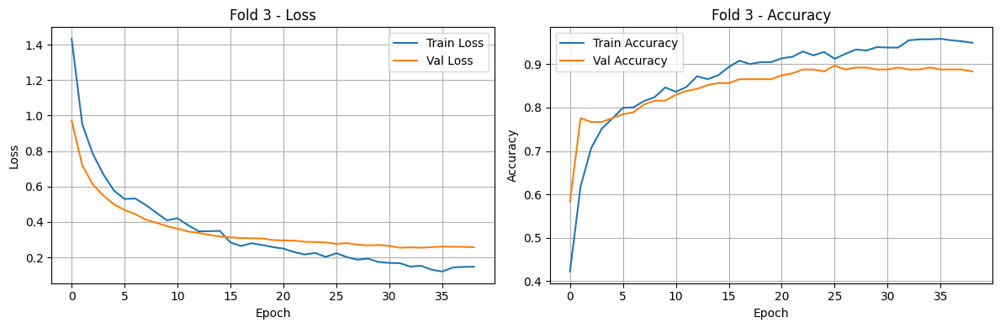


🔁 Fold 4/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - accuracy: 0.3049 - loss: 1.6788 - val_accuracy: 0.4484 - val_loss: 1.1446 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.5658 - loss: 1.0157 - val_accuracy: 0.6951 - val_loss: 0.8647 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7101 - loss: 0.7502 - val_accuracy: 0.7534 - val_loss: 0.7125 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7508 - loss: 0.6333 - val_accuracy: 0.7982 - val_loss: 0.6218 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7568 - loss: 0.5685 - val_accuracy: 0.8072 - val_loss: 0.5625 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.7875 - loss: 0.5186 - val_accuracy: 0.8251 - val_loss: 0.5270 - learning_rate: 2.0000e-05
Epoch 7/15


📊 Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.80      0.82        56
           1       0.81      0.80      0.81        55
           2       0.95      1.00      0.97        56
           3       1.00      1.00      1.00        56

    accuracy                           0.90       223
   macro avg       0.90      0.90      0.90       223
weighted avg       0.90      0.90      0.90       223



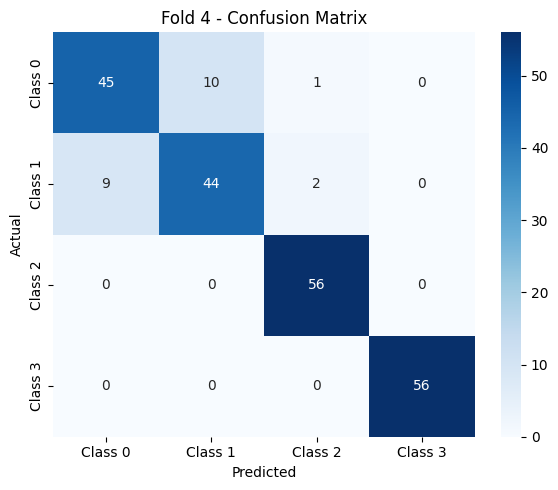

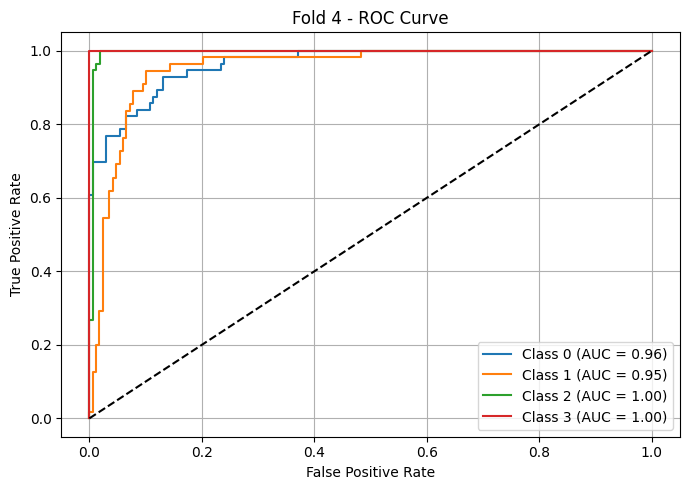

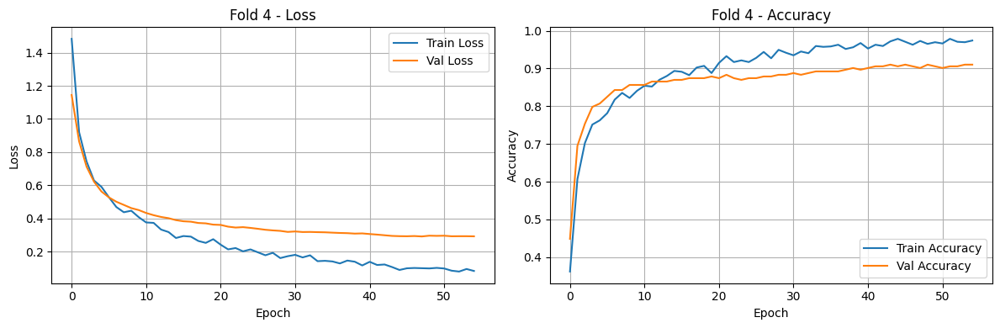


🔁 Fold 5/5 ----------------------------------------
Epoch 1/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 135ms/step - accuracy: 0.3099 - loss: 1.7564 - val_accuracy: 0.5247 - val_loss: 1.1022 - learning_rate: 2.0000e-05
Epoch 2/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5781 - loss: 1.0239 - val_accuracy: 0.7175 - val_loss: 0.7904 - learning_rate: 2.0000e-05
Epoch 3/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7070 - loss: 0.7343 - val_accuracy: 0.7578 - val_loss: 0.6453 - learning_rate: 2.0000e-05
Epoch 4/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.6984 - loss: 0.7393 - val_accuracy: 0.7982 - val_loss: 0.5527 - learning_rate: 2.0000e-05
Epoch 5/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7658 - loss: 0.5787 - val_accuracy: 0.8161 - val_loss: 0.5011 - learning_rate: 2.0000e-05
Epoch 6/150
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7968 - loss: 0.5378 - val_accuracy: 0.8296 - val_loss: 0.4629 - learning_rate: 2.0000e-05
Epoch 7/15


📊 Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.88      0.85        56
           1       0.85      0.79      0.81        56
           2       0.96      0.98      0.97        55
           3       1.00      1.00      1.00        56

    accuracy                           0.91       223
   macro avg       0.91      0.91      0.91       223
weighted avg       0.91      0.91      0.91       223



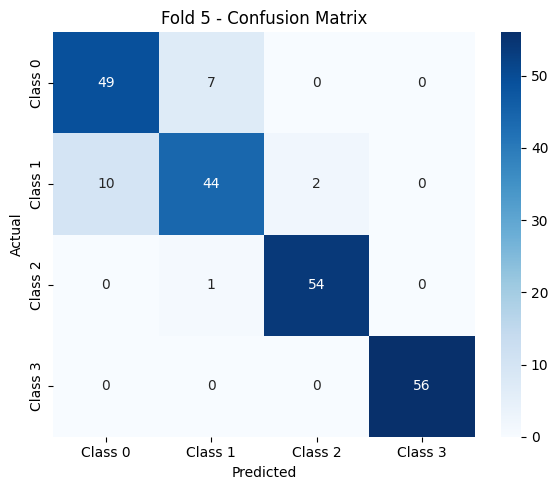

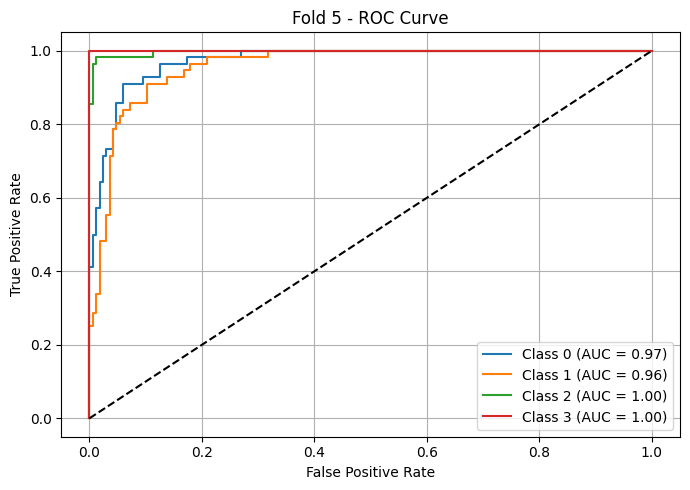

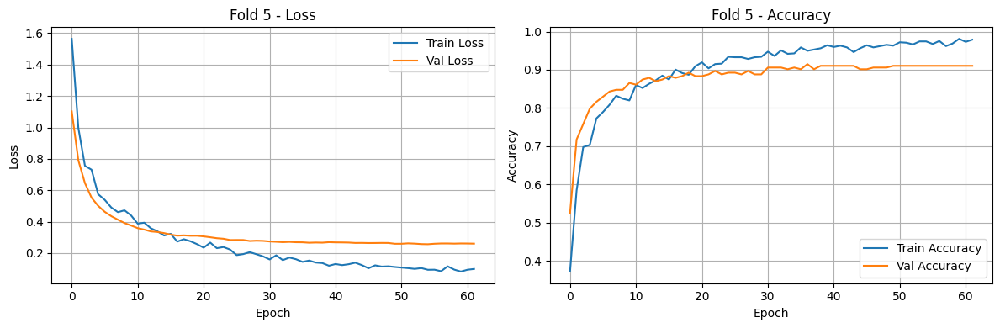

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import SMOTE
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

train_df = pd.read_excel('/content/train_with_malignancy_grade.xlsx')
val_df = pd.read_excel('/content/validation_with_malignancy_grade.xlsx')

train_df = train_df[~train_df['malignancy_grade'].isna()]
val_df = val_df[~val_df['malignancy_grade'].isna()]
train_df['malignancy_grade'] = train_df['malignancy_grade'].astype(int)
val_df['malignancy_grade'] = val_df['malignancy_grade'].astype(int)

all_df = pd.concat([train_df, val_df], ignore_index=True)
all_labels = all_df['malignancy_grade'].values
all_paths = all_df['image_path'].values

def load_and_preprocess_image(path):
    try:
        img = load_img(path, target_size=(224, 224))
        img_array = img_to_array(img)
        img_array = tf.keras.applications.densenet.preprocess_input(img_array)
        return img_array
    except:
        print(f"❌ خطا در بارگذاری تصویر: {path}")
        return None

print("✅ بارگذاری و پیش‌پردازش تصاویر...")
images, valid_labels = [], []
for path, label in tqdm(zip(all_paths, all_labels), total=len(all_paths)):
    img = load_and_preprocess_image(path)
    if img is not None:
        images.append(img)
        valid_labels.append(label)

images = np.array(images)
labels = np.array(valid_labels)

print("📦 استخراج ویژگی‌ها با DenseNet201...")
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
features = base_model.predict(images, verbose=1)

X_flat = features.reshape(features.shape[0], -1)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_flat, labels)

y_resampled_cat = to_categorical(y_resampled, num_classes=4)
X_resampled = X_resampled.reshape(-1, 7, 7, 1920)

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import label_binarize
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import models, layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

n_splits = 5
n_classes = 4
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

y_resampled_cat = to_categorical(y_resampled, num_classes=n_classes)

fold_no = 1

for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold_no}/{n_splits} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled_cat[train_idx], y_resampled_cat[val_idx]
    y_val_labels = y_resampled[val_idx]
    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_resampled), y=y_resampled[train_idx])
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
    layers.Input(shape=(7, 7, 1920)),
    layers.GlobalAveragePooling2D(),
    layers.Dense(1024),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.4),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(n_classes, activation='softmax')
])

    model.compile(
        optimizer=Adam(learning_rate=2e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7),
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=1
    )

    y_pred = model.predict(X_val, verbose=0)
    y_pred_classes = np.argmax(y_pred, axis=1)

    print("\n📊 Classification Report:\n", classification_report(y_val_labels, y_pred_classes))

    cm = confusion_matrix(y_val_labels, y_pred_classes)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[f'Class {i}' for i in range(n_classes)],
                yticklabels=[f'Class {i}' for i in range(n_classes)])
    plt.title(f'Fold {fold_no} - Confusion Matrix')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    y_val_bin = label_binarize(y_val_labels, classes=list(range(n_classes)))
    plt.figure(figsize=(7, 5))
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_pred[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"Fold {fold_no} - ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold_no} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'Fold {fold_no} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    fold_no += 1

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_1471']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


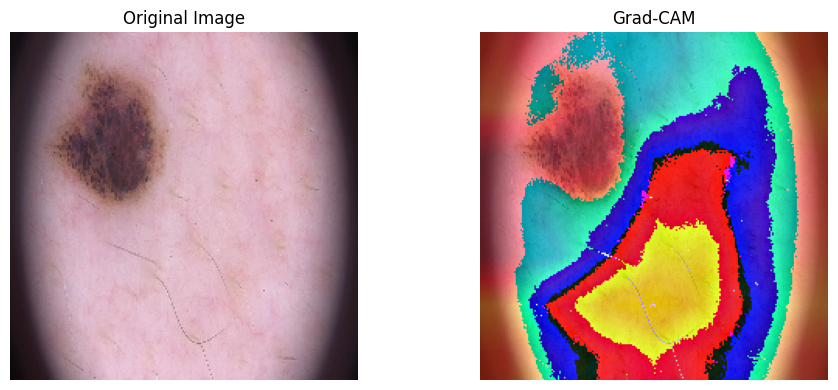

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model

model = tf.keras.applications.DenseNet201(weights='imagenet')
last_conv_layer_name = 'conv5_block32_concat'
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model([model.inputs], [model.get_layer(last_conv_layer_name).output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        loss = predictions[:, pred_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def show_gradcam(image_path, model, last_conv_layer_name, label_map=None):
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_batch = np.expand_dims(tf.keras.applications.densenet.preprocess_input(img_array.copy()), axis=0)

    heatmap = make_gradcam_heatmap(img_batch, model, last_conv_layer_name)
    heatmap = cv2.resize(heatmap, (img_array.shape[1], img_array.shape[0]))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)

    superimposed = heatmap_color * 0.4 + img_array
    superimposed = np.uint8(superimposed)

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_array.astype('uint8'))
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed)
    plt.title("Grad-CAM")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

image_path = "/content/drive/MyDrive/train/malignant/p13-14.jpg"
show_gradcam(image_path, model, last_conv_layer_name)

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=248db1c0692201aa99258924555b44d385e06f241d6393592364943e43412a26
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1

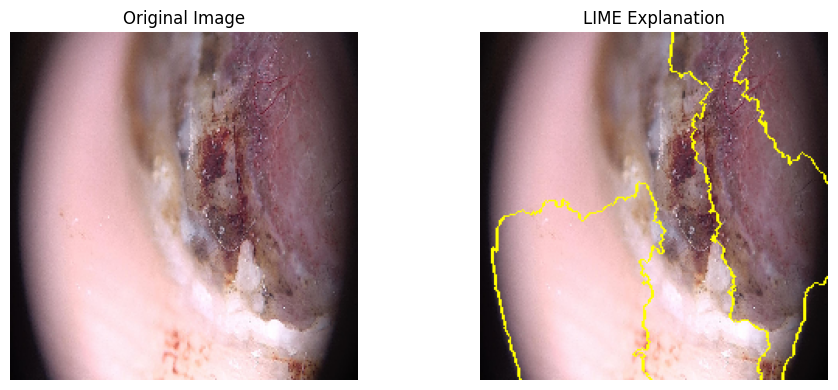

In [ ]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tensorflow.keras.applications.densenet import DenseNet201, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

model = DenseNet201(weights='imagenet')

def predict_fn(images):
    images = preprocess_input(images.copy())
    return model.predict(images)

image_path = all_paths[10]
image = load_img(image_path, target_size=(224, 224))
image_np = img_to_array(image).astype(np.uint8)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(
    image_np,
    predict_fn,
    top_labels=5,
    hide_color=0,
    num_samples=1000
)

temp, mask = explanation.get_image_and_mask(
    label=explanation.top_labels[0],
    positive_only=True,
    num_features=10,
    hide_rest=False
)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(image_np.astype("uint8"))
plt.title("Original Image")
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(mark_boundaries(temp / 255.0, mask))
plt.title("LIME Explanation")
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.losses import CategoricalCrossentropy
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from tensorflow.keras.utils import to_categorical
from imblearn.over_sampling import SMOTE
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = '/content/drive/MyDrive/train'

datagen = ImageDataGenerator(rescale=1./255)
generator = datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='categorical', shuffle=False
)

y_all_labels = generator.classes
class_indices = generator.class_indices
num_classes = len(class_indices)

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)
X_features = feature_extractor.predict(generator, verbose=1)
y_labels = y_all_labels

X_flat = X_features.reshape(X_features.shape[0], -1)
smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(X_flat, y_labels)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 7, 7, 1920)
y_resampled_cat = to_categorical(y_resampled, num_classes=num_classes)

NUM_FOLDS = 5
skf = StratifiedKFold(n_splits=NUM_FOLDS, shuffle=True, random_state=42)
fold = 1

for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold}/{NUM_FOLDS} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled_cat[train_idx], y_resampled_cat[val_idx]
    y_val_labels = y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_resampled), y=y_resampled[train_idx])
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
        layers.Input(shape=(7, 7, 1920)),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.5),
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.1),
        layers.Dropout(0.4),
        layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=2e-5),
        loss=CategoricalCrossentropy(),
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
        ModelCheckpoint(f'model_fold_{fold}.keras', monitor='val_accuracy', save_best_only=True, verbose=1)
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=1
    )

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)

    print("\n📊 Classification Report:")
    print(classification_report(y_val_labels, y_pred_classes))

    fold += 1

Found 1246 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


39/39 ━━━━━━━━━━━━━━━━━━━━ 210s 5s/step

🔁 Fold 1/5 ----------------------------------------
Epoch 1/150
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.6299 - loss: 0.7437
Epoch 1: val_accuracy improved from -inf to 0.68792, saving model to model_fold_1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - accuracy: 0.6306 - loss: 0.7424 - val_accuracy: 0.6879 - val_loss: 0.5537 - learning_rate: 2.0000e-05
Epoch 2/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7137 - loss: 0.6015
Epoch 2: val_accuracy improved from 0.68792 to 0.73490, saving model to model_fold_1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7147 - loss: 0.5999 - val_accuracy: 0.7349 - val_loss: 0.4953 - learning_rate: 2.0000e-05
Epoch 3/150
34/38 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7707 - loss: 0.5098
Epoch 3: val_accuracy improved from 0.73490 to 0.77517, saving model to model_fold_1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7676 - loss: 0.5153 - val_accuracy: 0.7

In [ ]:
base_model_for_gradcam = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model_for_gradcam.summary()

Model: "densenet201"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_58      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_48   │ (None, 230, 230,  │          0 │ input_layer_58[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_49   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_4… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 18,321,984 (69.89 MB)

 Trainable params: 18,092,928 (69.02 MB)

 Non-trainable params: 229,056 (894.75 KB)

In [ ]:
!pip install tf_keras_vis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 4.0 MB/s eta 0:00:00


In [ ]:
########## چرت و پرت ########################

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.losses import CategoricalCrossentropy
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from tensorflow.keras.utils import to_categorical
from imblearn.over_sampling import SMOTE
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = '/content/drive/MyDrive/train'

datagen = ImageDataGenerator(rescale=1./255)
generator = datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=32, class_mode='categorical', shuffle=False
)

y_all_labels = generator.classes
class_indices = generator.class_indices
num_classes = len(class_indices)

base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
feature_extractor = models.Model(inputs=base_model.input, outputs=base_model.output)
X_features = feature_extractor.predict(generator, verbose=1)
y_labels = y_all_labels

X_flat = X_features.reshape(X_features.shape[0], -1)
smote = SMOTE(random_state=42)
X_resampled_flat, y_resampled = smote.fit_resample(X_flat, y_labels)

scaler = StandardScaler()
X_resampled_flat = scaler.fit_transform(X_resampled_flat)
X_resampled = X_resampled_flat.reshape(-1, 7, 7, 1920)
y_resampled_cat = to_categorical(y_resampled, num_classes=num_classes)

NUM_FOLDS = 5
skf = StratifiedKFold(n_splits=NUM_FOLDS, shuffle=True, random_state=42)
fold = 1

for train_idx, val_idx in skf.split(X_resampled, y_resampled):
    print(f"\n🔁 Fold {fold}/{NUM_FOLDS} {'-'*40}")

    X_train, X_val = X_resampled[train_idx], X_resampled[val_idx]
    y_train, y_val = y_resampled_cat[train_idx], y_resampled_cat[val_idx]
    y_val_labels = y_resampled[val_idx]

    class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_resampled), y=y_resampled[train_idx])
    class_weight_dict = dict(enumerate(class_weights))

    model = models.Sequential([
        layers.Input(shape=(7, 7, 1920)),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.5),
        layers.Dense(512),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.1),
        layers.Dropout(0.4),
        layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=2e-5),
        loss=CategoricalCrossentropy(),
        metrics=['accuracy']
    )

    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
        ModelCheckpoint(f'model_fold_{fold}.keras', monitor='val_accuracy', save_best_only=True, verbose=1)
    ]

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=150,
        batch_size=32,
        class_weight=class_weight_dict,
        callbacks=callbacks,
        verbose=1
    )

    y_pred = model.predict(X_val)
    y_pred_classes = np.argmax(y_pred, axis=1)

    print("\n📊 Classification Report:")
    print(classification_report(y_val_labels, y_pred_classes))

    fold += 1

Found 1246 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


39/39 ━━━━━━━━━━━━━━━━━━━━ 412s 10s/step

🔁 Fold 1/5 ----------------------------------------
Epoch 1/150
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4968 - loss: 1.0097
Epoch 1: val_accuracy improved from -inf to 0.68792, saving model to model_fold_1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.5013 - loss: 1.0020 - val_accuracy: 0.6879 - val_loss: 0.5915 - learning_rate: 2.0000e-05
Epoch 2/150
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6745 - loss: 0.6708
Epoch 2: val_accuracy improved from 0.68792 to 0.74497, saving model to model_fold_1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - accuracy: 0.6755 - loss: 0.6701 - val_accuracy: 0.7450 - val_loss: 0.5300 - learning_rate: 2.0000e-05
Epoch 3/150
36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.7459 - loss: 0.5838
Epoch 3: val_accuracy improved from 0.74497 to 0.75839, saving model to model_fold_1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.7454 - loss: 0.5866 - val_accuracy: 

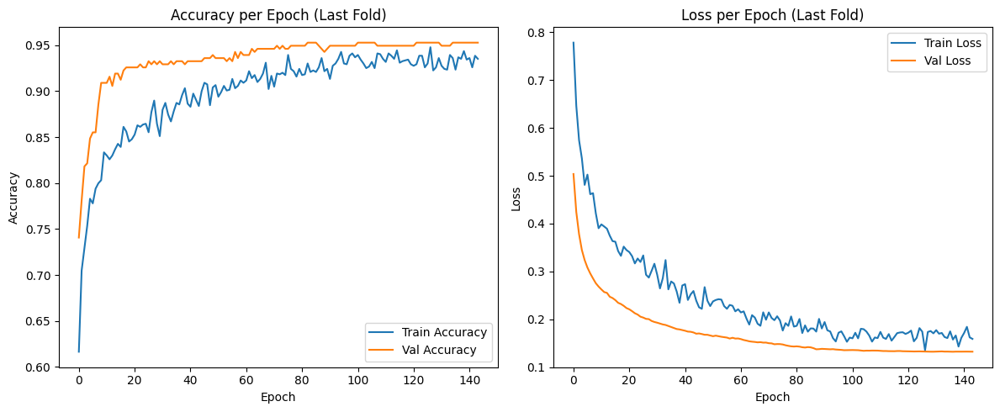

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy per Epoch (Last Fold)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss per Epoch (Last Fold)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

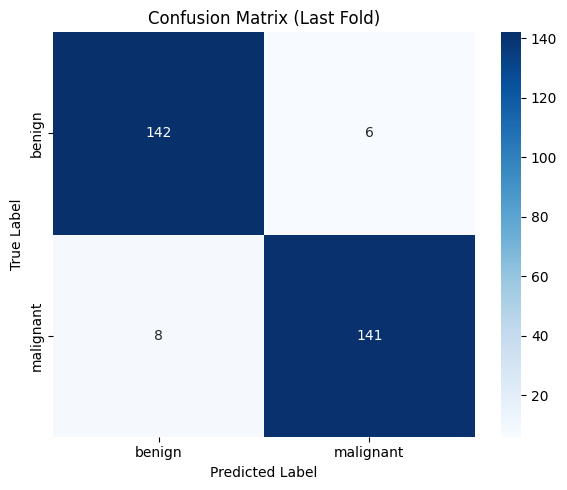

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_val_labels, y_pred_classes)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_indices.keys(),
            yticklabels=class_indices.keys())
plt.title('Confusion Matrix (Last Fold)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.show()

In [ ]:
############ fusion #####

 25%|██▌       | 155/608 [01:25<03:52,  1.95it/s]

❌ مشکل در بارگذاری: /content/drive/MyDrive/train/malignant/p1 .jpg


100%|██████████| 608/608 [05:04<00:00,  2.00it/s]


74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 190ms/step - accuracy: 0.2765 - loss: 2.6093 - val_accuracy: 0.4464 - val_loss: 1.6943 - learning_rate: 3.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.3902 - loss: 2.2534 - val_accuracy: 0.6250 - val_loss: 1.4721 - learning_rate: 3.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.4589 - loss: 1.8502 - val_accuracy: 0.6920 - val_loss: 1.3064 - learning_rate: 3.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.5745 - loss: 1.6540 - val_accuracy: 0.7054 - val_loss: 1.1831 - learning_rate: 3.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.5929 - loss: 1.4597 - val_accuracy: 0.7321 - val_loss: 1.0892 - learning_rate: 3.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6318 - loss: 1.3479 - val_accuracy: 0.7679 - val_loss: 1.0156 

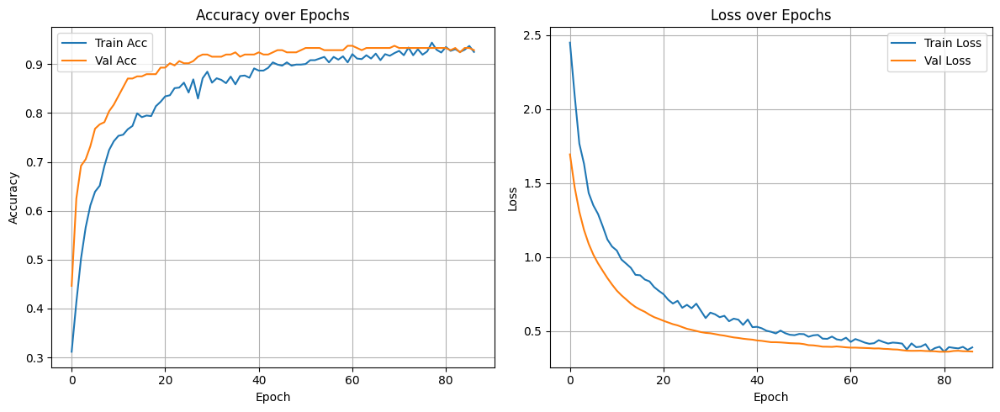

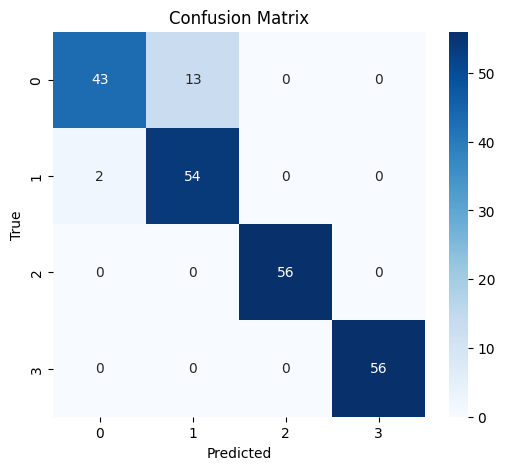

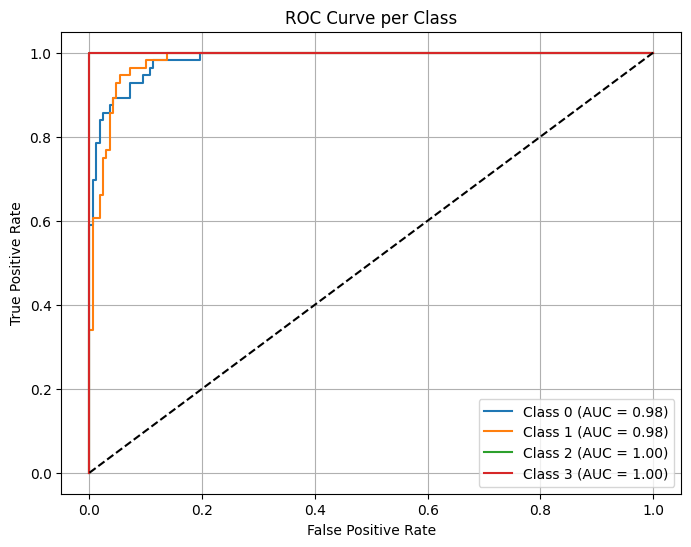

In [ ]:
import pandas as pd
import numpy as np
import os
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras import layers, models, Input, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tqdm import tqdm
import tensorflow as tf
from sklearn.preprocessing import StandardScaler, LabelEncoder

df = pd.concat([train_df, validation_df], ignore_index=True)
df = df[~df['malignancy_grade'].isna()]
df['malignancy_grade'] = df['malignancy_grade'].astype(int)

labels = to_categorical(df['malignancy_grade'].values, num_classes=4)

def load_and_preprocess_image(path):
    try:
        img = load_img(path, target_size=(224, 224))
        img_array = img_to_array(img)
        return tf.keras.applications.xception.preprocess_input(img_array)
    except:
        print(f"❌ مشکل در بارگذاری: {path}")
        return None

images = []
valid_indices = []

for i, path in enumerate(tqdm(df['image_path'].values)):
    img = load_and_preprocess_image(path)
    if img is not None:
        images.append(img)
        valid_indices.append(i)

images = np.array(images)
labels = labels[valid_indices]
df = df.iloc[valid_indices].reset_index(drop=True)

textual_features = ['gender', 'clark', 'breslow(mm)', 'ulceration', 'mitotic']
df['gender'] = LabelEncoder().fit_transform(df['gender'])

df[textual_features] = df[textual_features].fillna(0)
X_text = df[textual_features].values

scaler = StandardScaler()
X_text_scaled = scaler.fit_transform(X_text)

base_cnn = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
image_features = base_cnn.predict(images, verbose=1)
image_features = image_features.reshape(image_features.shape[0], -1)

X_combined = np.hstack([image_features, X_text_scaled])
y_raw = np.argmax(labels, axis=1)

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_combined, y_raw)
y_resampled_cat = to_categorical(y_resampled, num_classes=4)

X_img_resampled = X_resampled[:, :image_features.shape[1]].reshape(-1, 7, 7, 1920)
X_text_resampled = X_resampled[:, image_features.shape[1]:]

X_img_train, X_img_val, X_txt_train, X_txt_val, y_train, y_val = train_test_split(
    X_img_resampled, X_text_resampled, y_resampled_cat, test_size=0.2, stratify=y_resampled, random_state=42
)

class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_resampled), y=y_resampled)
class_weights_dict = {i: w for i, w in enumerate(class_weights)}

image_input = Input(shape=(7, 7, 1920))
x1 = layers.GlobalAveragePooling2D()(image_input)
x1 = layers.Dropout(0.3)(x1)
text_input = Input(shape=(X_txt_train.shape[1],))
x2 = layers.Dense(64, activation='relu')(text_input)
x2 = layers.BatchNormalization()(x2)
x2 = layers.Dropout(0.3)(x2)
merged = layers.Concatenate()([x1, x2])
x = layers.Dense(256, activation='relu', kernel_regularizer=l2(0.001))(merged)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
output = layers.Dense(4, activation='softmax')(x)

fusion_model = Model(inputs=[image_input, text_input], outputs=output)

fusion_model.compile(optimizer=Adam(learning_rate=3e-5),
                     loss='categorical_crossentropy',
                     metrics=['accuracy'])

callbacks = [
    EarlyStopping(patience=7, restore_best_weights=True, monitor='val_loss'),
    ReduceLROnPlateau(patience=4, factor=0.5, min_lr=1e-7, monitor='val_loss'),
    ModelCheckpoint('fusion_model_malignancy.keras', save_best_only=True, monitor='val_accuracy')
]

history = fusion_model.fit(
    [X_img_train, X_txt_train], y_train,
    validation_data=([X_img_val, X_txt_val], y_val),
    epochs=100,
    batch_size=32,
    class_weight=class_weights_dict,
    callbacks=callbacks,
    verbose=1
)

val_loss, val_acc = fusion_model.evaluate([X_img_val, X_txt_val], y_val, verbose=0)
print(f"\n✅ Validation Accuracy: {val_acc:.4f}")
print(f"✅ Validation Loss: {val_loss:.4f}")

y_pred = fusion_model.predict([X_img_val, X_txt_val])
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = np.argmax(y_val, axis=1)

print("\n📊 Classification Report:\n")
print(classification_report(y_true_labels, y_pred_labels))

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()
import seaborn as sns
from sklearn.metrics import confusion_matrix

conf_mat = confusion_matrix(y_true_labels, y_pred_labels)

plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=range(4), yticklabels=range(4))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

y_val_bin = label_binarize(y_true_labels, classes=[0, 1, 2, 3])
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(4):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# رسم
plt.figure(figsize=(8, 6))
for i in range(4):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve per Class')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid()
plt.show()


--- Fold 1/5 ---
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 14s 218ms/step - accuracy: 0.2433 - loss: 2.8510 - val_accuracy: 0.3348 - val_loss: 1.7263 - learning_rate: 3.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - accuracy: 0.3266 - loss: 2.3553 - val_accuracy: 0.6161 - val_loss: 1.4532 - learning_rate: 3.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.4286 - loss: 2.0588 - val_accuracy: 0.7143 - val_loss: 1.2702 - learning_rate: 3.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.4938 - loss: 1.6602 - val_accuracy: 0.7366 - val_loss: 1.1500 - learning_rate: 3.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5957 - loss: 1.4450 - val_accuracy: 0.7500 - val_loss: 1.0549 - learning_rate: 3.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6363 - loss: 1.4030 - val_accuracy: 0.7545 - val_loss: 0.9826 - learning_rate: 3.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 1

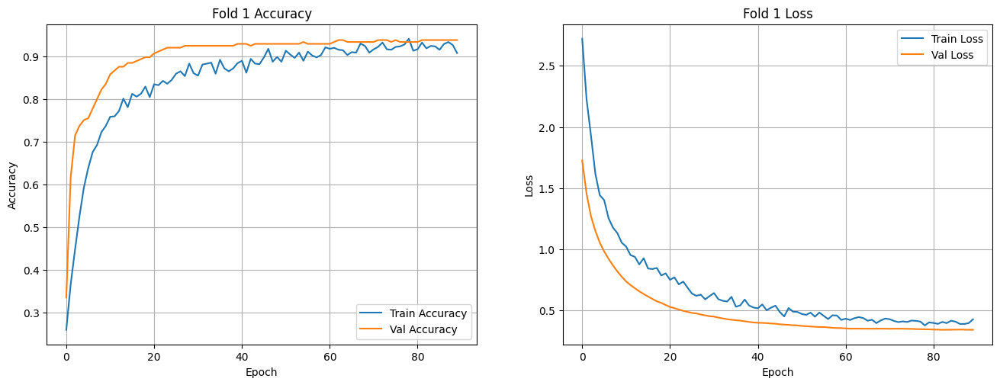

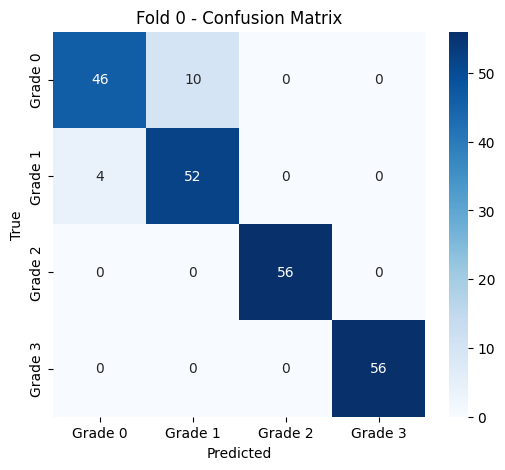

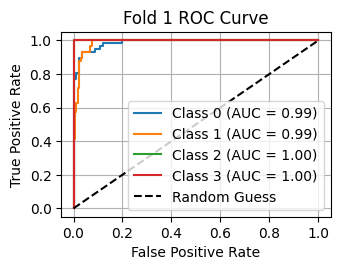


--- Fold 2/5 ---
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 226ms/step - accuracy: 0.2277 - loss: 2.8492 - val_accuracy: 0.3543 - val_loss: 1.7397 - learning_rate: 3.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.3685 - loss: 2.2083 - val_accuracy: 0.5426 - val_loss: 1.4887 - learning_rate: 3.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.5251 - loss: 1.8089 - val_accuracy: 0.6099 - val_loss: 1.3193 - learning_rate: 3.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5195 - loss: 1.6353 - val_accuracy: 0.6996 - val_loss: 1.1915 - learning_rate: 3.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.5656 - loss: 1.6052 - val_accuracy: 0.7220 - val_loss: 1.0956 - learning_rate: 3.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6504 - loss: 1.3250 - val_accuracy: 0.7489 - val_loss: 1.0220 - learning_rate: 3.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 16

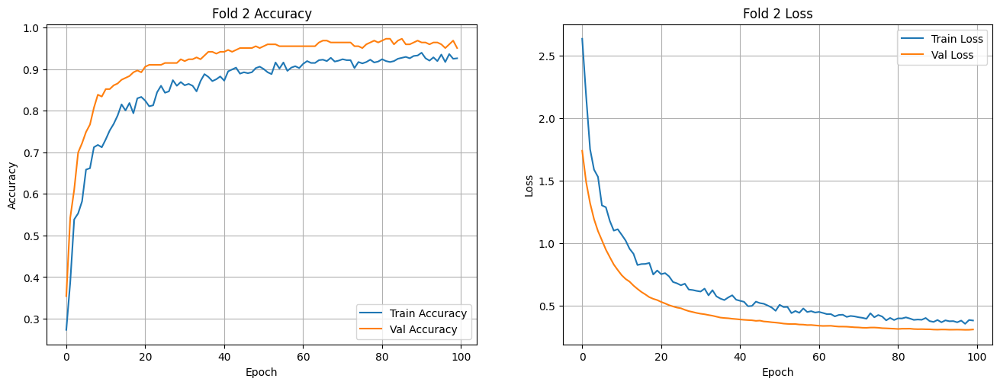

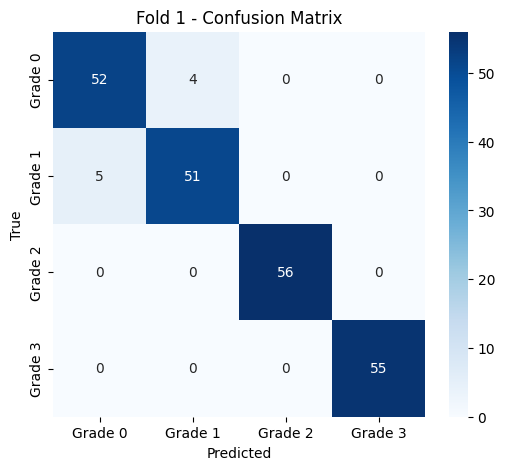

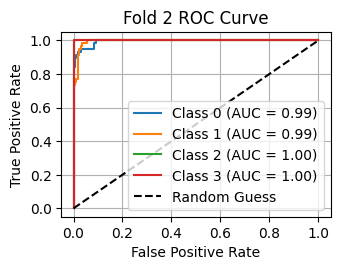


--- Fold 3/5 ---
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.2484 - loss: 2.7612 - val_accuracy: 0.3991 - val_loss: 1.7645 - learning_rate: 3.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.3730 - loss: 2.2196 - val_accuracy: 0.5426 - val_loss: 1.5272 - learning_rate: 3.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4825 - loss: 1.8334 - val_accuracy: 0.5830 - val_loss: 1.3654 - learning_rate: 3.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.5657 - loss: 1.6137 - val_accuracy: 0.6547 - val_loss: 1.2486 - learning_rate: 3.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5931 - loss: 1.5117 - val_accuracy: 0.6682 - val_loss: 1.1632 - learning_rate: 3.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6184 - loss: 1.3610 - val_accuracy: 0.7175 - val_loss: 1.0892 - learning_rate: 3.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18m

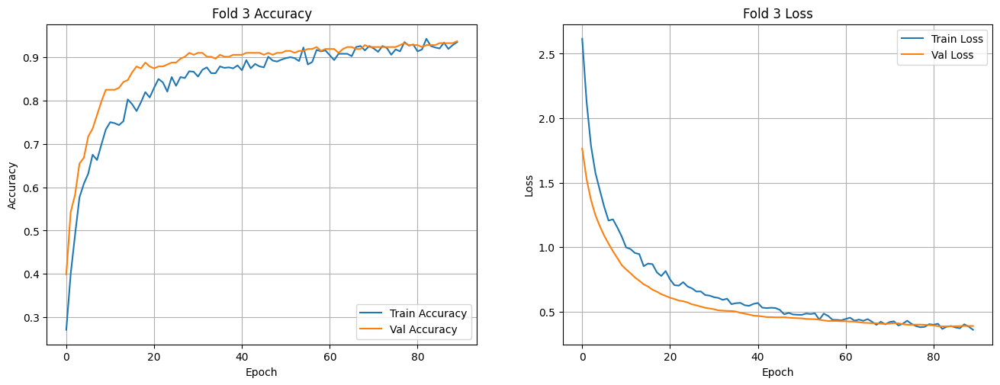

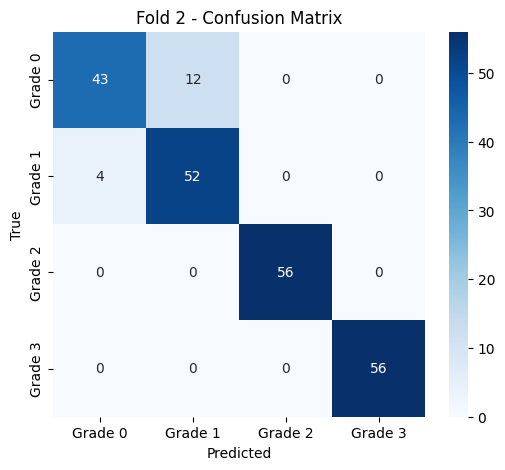

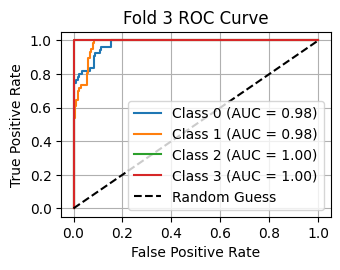


--- Fold 4/5 ---
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.3316 - loss: 2.3360 - val_accuracy: 0.3901 - val_loss: 1.7205 - learning_rate: 3.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.4263 - loss: 1.9519 - val_accuracy: 0.5067 - val_loss: 1.5024 - learning_rate: 3.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.5264 - loss: 1.7385 - val_accuracy: 0.6054 - val_loss: 1.3394 - learning_rate: 3.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6068 - loss: 1.5550 - val_accuracy: 0.6771 - val_loss: 1.2212 - learning_rate: 3.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.6327 - loss: 1.4081 - val_accuracy: 0.7130 - val_loss: 1.1097 - learning_rate: 3.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.7025 - loss: 1.2041 - val_accuracy: 0.7220 - val_loss: 1.0276 - learning_rate: 3.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15m

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step
Fold 4 Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.80      0.82        56
           1       0.81      0.84      0.82        55
           2       1.00      1.00      1.00        56
           3       1.00      1.00      1.00        56

    accuracy                           0.91       223
   macro avg       0.91      0.91      0.91       223
weighted avg       0.91      0.91      0.91       223



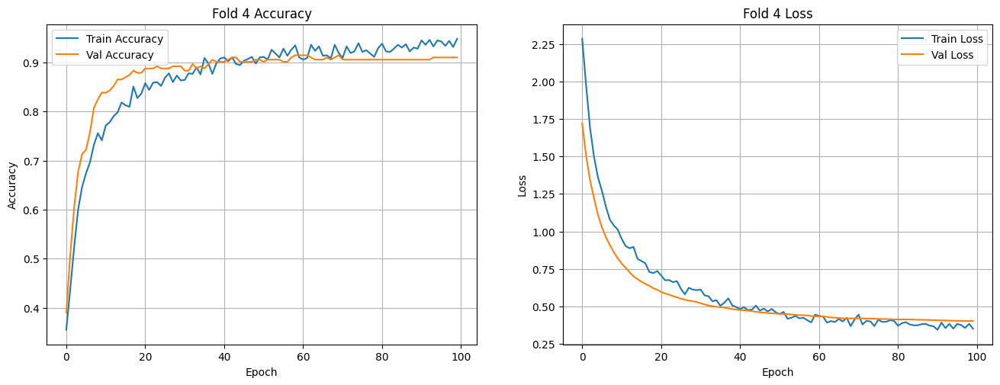

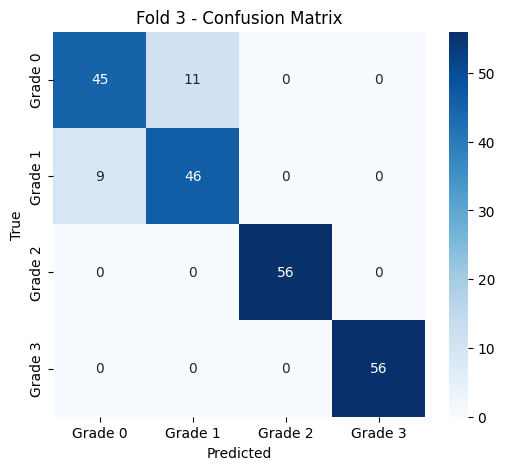

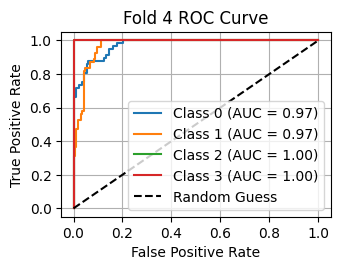


--- Fold 5/5 ---
Epoch 1/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - accuracy: 0.3032 - loss: 2.4803 - val_accuracy: 0.3318 - val_loss: 1.8324 - learning_rate: 3.0000e-05
Epoch 2/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.4294 - loss: 2.0494 - val_accuracy: 0.5157 - val_loss: 1.5194 - learning_rate: 3.0000e-05
Epoch 3/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.4766 - loss: 1.8487 - val_accuracy: 0.6637 - val_loss: 1.3054 - learning_rate: 3.0000e-05
Epoch 4/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.5614 - loss: 1.4993 - val_accuracy: 0.7399 - val_loss: 1.1628 - learning_rate: 3.0000e-05
Epoch 5/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6169 - loss: 1.4083 - val_accuracy: 0.7534 - val_loss: 1.0602 - learning_rate: 3.0000e-05
Epoch 6/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.6517 - loss: 1.3152 - val_accuracy: 0.7668 - val_loss: 0.9847 - learning_rate: 3.0000e-05
Epoch 7/100
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 17m

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step
Fold 5 Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.84      0.82        56
           1       0.83      0.80      0.82        56
           2       1.00      1.00      1.00        55
           3       1.00      1.00      1.00        56

    accuracy                           0.91       223
   macro avg       0.91      0.91      0.91       223
weighted avg       0.91      0.91      0.91       223



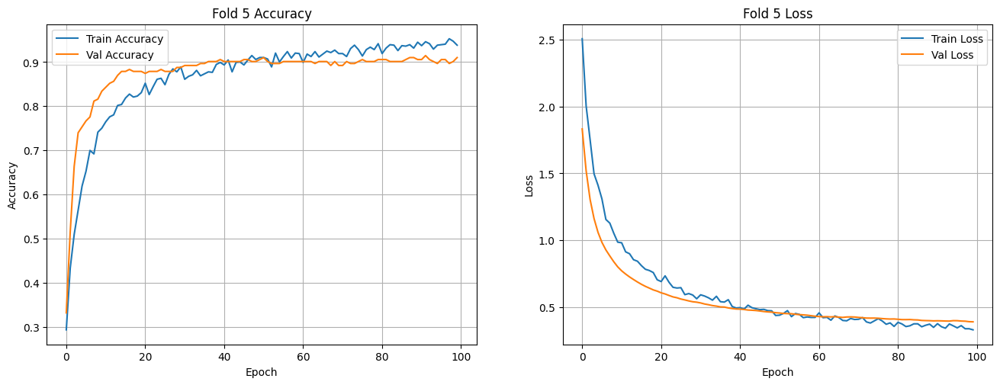

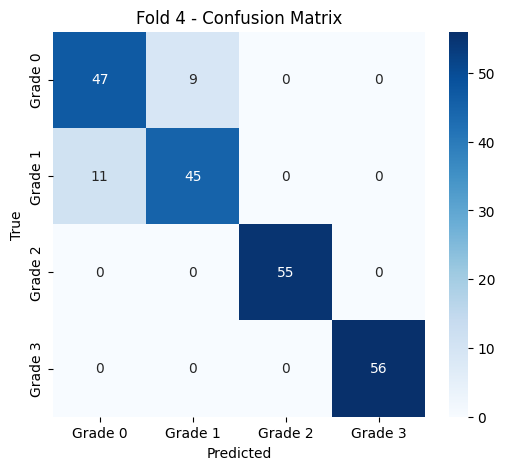

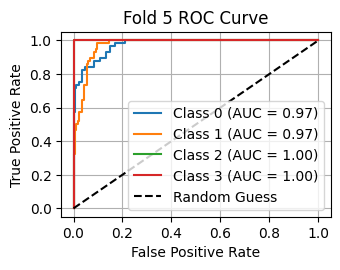

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras import layers, Input, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.preprocessing import label_binarize

n_splits = 5

val_accuracies = []
val_losses = []
histories = []
reports = []

skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(skf.split(X_resampled, y_resampled)):
    print(f"\n--- Fold {fold + 1}/{n_splits} ---")

    X_img_train_fold = X_resampled[train_idx, :image_features.shape[1]].reshape(-1, 7, 7, 1920)
    X_txt_train_fold = X_resampled[train_idx, image_features.shape[1]:]
    y_train_fold = to_categorical(y_resampled[train_idx], num_classes=4)

    X_img_val_fold = X_resampled[val_idx, :image_features.shape[1]].reshape(-1, 7, 7, 1920)
    X_txt_val_fold = X_resampled[val_idx, image_features.shape[1]:]
    y_val_fold = to_categorical(y_resampled[val_idx], num_classes=4)

    class_weights_fold = compute_class_weight(class_weight='balanced', classes=np.unique(y_resampled[train_idx]), y=y_resampled[train_idx])
    class_weights_dict_fold = {i: w for i, w in enumerate(class_weights_fold)}

    image_input = Input(shape=(7, 7, 1920))
    x1 = layers.GlobalAveragePooling2D()(image_input)
    x1 = layers.Dropout(0.3)(x1)

    text_input = Input(shape=(X_txt_train_fold.shape[1],))
    x2 = layers.Dense(64, activation='relu')(text_input)
    x2 = layers.BatchNormalization()(x2)
    x2 = layers.Dropout(0.3)(x2)

    merged = layers.Concatenate()([x1, x2])
    x = layers.Dense(256, activation='relu', kernel_regularizer=l2(0.001))(merged)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)
    output = layers.Dense(4, activation='softmax')(x)

    model = Model(inputs=[image_input, text_input], outputs=output)

    model.compile(optimizer=Adam(learning_rate=3e-5),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    callbacks = [
        EarlyStopping(patience=7, restore_best_weights=True, monitor='val_loss'),
        ReduceLROnPlateau(patience=4, factor=0.5, min_lr=1e-7, monitor='val_loss'),
        ModelCheckpoint(f'fusion_model_malignancy_fold{fold+1}.keras', save_best_only=True, monitor='val_accuracy')
    ]

    history = model.fit(
        [X_img_train_fold, X_txt_train_fold], y_train_fold,
        validation_data=([X_img_val_fold, X_txt_val_fold], y_val_fold),
        epochs=100,
        batch_size=32,
        class_weight=class_weights_dict_fold,
        callbacks=callbacks,
        verbose=1
    )
    histories.append(history)

    val_loss, val_acc = model.evaluate([X_img_val_fold, X_txt_val_fold], y_val_fold, verbose=0)
    val_accuracies.append(val_acc)
    val_losses.append(val_loss)
    print(f"Fold {fold+1} Validation Accuracy: {val_acc:.4f}")
    print(f"Fold {fold+1} Validation Loss: {val_loss:.4f}")

    y_pred_prob = model.predict([X_img_val_fold, X_txt_val_fold])
    y_pred_labels = np.argmax(y_pred_prob, axis=1)
    y_true_labels = np.argmax(y_val_fold, axis=1)

    from sklearn.metrics import classification_report
    report = classification_report(y_true_labels, y_pred_labels, output_dict=True)
    reports.append(report)
    print(f"Fold {fold+1} Classification Report:")
    print(classification_report(y_true_labels, y_pred_labels))

    plt.figure(figsize=(16, 12))
    plt.subplot(2, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title(f'Fold {fold+1} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid()

    plt.subplot(2, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f'Fold {fold+1} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()

    N_CLASSES = 4
    cm = confusion_matrix(y_true_labels, y_pred_labels)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[f'Grade {i}' for i in range(N_CLASSES)],
                yticklabels=[f'Grade {i}' for i in range(N_CLASSES)])
    plt.title(f'Fold {fold} - Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    y_val_bin = label_binarize(y_true_labels, classes=[0, 1, 2, 3])
    N_CLASSES = 4

    plt.subplot(2, 2, 4)
    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(N_CLASSES):
        fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.title(f'Fold {fold+1} ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.grid(True)

    plt.tight_layout()
    plt.show()